In [11]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess
from clust_huge_amp import *



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## here we're running with the likelihood only 

In [3]:
%load_ext autoreload
%autoreload 2



%autoreload 2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from scipy.spatial.distance import pdist, squareform
from scipy.special import expit
from scipy.stats import multivariate_normal
import matplotlib.pyplot as plt
from sklearn.cluster import SpectralClustering  # Add this import

def load_model_essentials(base_path='/Users/sarahurbut/Dropbox/data_for_running/'):
    """
    Load all essential components
    """
    print("Loading components...")
    
    # Load large matrices
    Y = torch.load(base_path + 'Y_tensor.pt')
    E = torch.load(base_path + 'E_matrix.pt')
    G = torch.load(base_path + 'G_matrix.pt')
    
    # Load other components
    essentials = torch.load(base_path + 'model_essentials.pt')
    
    print("Loaded all components successfully!")
    
    return Y, E, G, essentials

# Load and initialize model:
Y, E, G, essentials = load_model_essentials()


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Loading components...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_24966/945457161.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  Y = torch.load(base_path + 'Y_tensor.pt')
/va

Loaded all components successfully!


In [4]:

# Subset the data
Y_100k, E_100k, G_100k, indices = subset_data(Y, E, G, start_index=0, end_index=10000)

torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
# Initialize model with subsetted data

del Y

In [5]:
# When initializing the model:
original_G = G_100k # Store the original G - proper tensor copy

# Now in your batch run, load and verify:
initial_psi = torch.load('/Users/sarahurbut/Dropbox/data_for_running/initial_psi_400k.pt')
initial_clusters = torch.load('/Users/sarahurbut/Dropbox/data_for_running/initial_clusters_400k.pt')

original_cluster_sizes = {}
unique, counts = np.unique(initial_clusters, return_counts=True)
for k, count in zip(unique, counts):
    original_cluster_sizes[k] = count
print("\nOriginal cluster sizes:")
for k, count in original_cluster_sizes.items():
    print(f"Cluster {k}: {count} diseases")


Original cluster sizes:
Cluster 0: 16 diseases
Cluster 1: 21 diseases
Cluster 2: 15 diseases
Cluster 3: 82 diseases
Cluster 4: 5 diseases
Cluster 5: 7 diseases
Cluster 6: 8 diseases
Cluster 7: 22 diseases
Cluster 8: 28 diseases
Cluster 9: 12 diseases
Cluster 10: 11 diseases
Cluster 11: 8 diseases
Cluster 12: 7 diseases
Cluster 13: 13 diseases
Cluster 14: 10 diseases
Cluster 15: 5 diseases
Cluster 16: 29 diseases
Cluster 17: 17 diseases
Cluster 18: 9 diseases
Cluster 19: 23 diseases


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_24966/2050531461.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  initial_psi = torch.load('/Users/sarahurbut/D

In [7]:
E_100k

tensor([[51, 51, 51,  ..., 51, 51, 51],
        [51, 51, 51,  ..., 51, 51, 51],
        [51, 51, 51,  ..., 51, 51, 51],
        ...,
        [51, 51, 51,  ..., 51, 51, 51],
        [51, 51, 51,  ..., 51, 51, 51],
        [51, 51, 51,  ..., 51, 51, 51]])

In [26]:
def create_censored_event_times(Y, E, ascvd_indices=[111, 112, 113, 114, 115, 116], censoring_window=2):
    """
    Create censored event times for ASCVD predictive evaluation
    
    Args:
        Y: Disease occurrence tensor [N, D, T]
        E: Original event times
        ascvd_indices: Indices of ASCVD diseases to censor
        censoring_window: Number of years before event to censor
        
    Returns:
        E_censored: Modified event times with ASCVD events censored
        censored_indices: Indices of patients who were censored
        original_event_times: Original event times for censored patients
    """
    # Create a copy of event times to modify
    E_censored = E.clone()
    
    # Track which patients were censored and their original event times
    censored_indices = []
    original_event_times = []
    
    # For each patient
    for i in range(Y.shape[0]):
        # Only look at ASCVD diseases
        ascvd_data = Y[i, ascvd_indices, :]
        
        # Find the first occurrence of any ASCVD disease for this patient
        any_ascvd = torch.sum(ascvd_data, dim=0) > 0
        
        # Find the first time index where any ASCVD disease occurred
        ascvd_times = torch.where(any_ascvd)[0]
        
        if len(ascvd_times) > 0:
            # Get the earliest ASCVD event time
            event_time = ascvd_times[0].item()
            
            # If they had an event and it's not at the very beginning
            if event_time > censoring_window:
                # Store original event time
                original_event_times.append(event_time)
                
                # Censor by setting event time to be earlier
                censor_time = max(0, event_time - censoring_window)
                
                # Update event time in E_censored
                # This depends on the structure of E
                if len(E.shape) == 1:
                    # If E is a 1D tensor [N]
                    E_censored[i] = censor_time
                elif len(E.shape) == 2:
                    # If E is a 2D tensor [N, D] or [N, T]
                    # We need to determine which dimension to update
                    if E.shape[1] == Y.shape[1]:  # [N, D]
                        # Update event times for ASCVD diseases
                        for d_idx in ascvd_indices:
                            if d_idx < E.shape[1]:  # Make sure index is valid
                                E_censored[i, d_idx] = censor_time
                    else:  # Assume [N, T] or similar
                        # Set all times after censor_time to 0 or another indicator
                        E_censored[i, censor_time:] = 0
                
                # Track this patient
                censored_indices.append(i)
    
    return E_censored, censored_indices, original_event_times


In [27]:
   # Define ASCVD disease indices
   ascvd_indices = [111, 112, 113, 114, 115, 116]
   
   # Create censored event times
   E_censored, censored_indices, original_event_times = create_censored_event_times(
       Y_100k, E_100k, ascvd_indices=ascvd_indices, censoring_window=2
   )

In [40]:
E_100k[9997,112]
E_censored[9997,112]

tensor(28)

In [28]:
import torch
import numpy as np

def test_event_time_masking():
    """
    Test how event time masking affects the likelihood calculation
    """
    # Create a simple test case
    N, D, T = 1, 1, 50  # 1 patient, 1 disease, 50 time points
    
    # Create Y with an event at time 40
    Y = torch.zeros((N, D, T))
    Y[0, 0, 40] = 1
    
    # Create pi (model predictions)
    pi = torch.ones((N, D, T)) * 0.1  # 10% risk at each time point
    
    # Create two different event time scenarios
    E_original = torch.tensor([40])  # Original event time
    E_censored = torch.tensor([38])  # Censored event time
    
    # Function to calculate negative log likelihood with masking
    def calc_nll(Y, pi, E):
        nll = 0
        for i in range(N):
            for d in range(D):
                event_time = E[i].item()
                
                # Create mask up to event time
                mask = torch.zeros(T, dtype=torch.bool)
                mask[:event_time+1] = True
                
                # Apply mask to Y and pi
                Y_masked = Y[i, d, mask]
                pi_masked = pi[i, d, mask]
                
                # Calculate likelihood components
                # 1. Event likelihood: log(pi) for times where Y=1
                event_ll = torch.sum(torch.log(pi_masked[Y_masked == 1] + 1e-10))
                
                # 2. Non-event likelihood: log(1-pi) for times where Y=0
                non_event_ll = torch.sum(torch.log(1 - pi_masked[Y_masked == 0] + 1e-10))
                
                # Total negative log likelihood
                nll -= (event_ll + non_event_ll)
                
                # Print detailed information
                print(f"Event time: {event_time}")
                print(f"Mask shape: {mask.sum()} time points")
                print(f"Y values included: {Y_masked}")
                print(f"pi values included: {pi_masked}")
                print(f"Event likelihood: {event_ll.item()}")
                print(f"Non-event likelihood: {non_event_ll.item()}")
                print(f"Total NLL: {nll.item()}")
                
                # Check if time 40 is included
                print(f"Is time 40 included in likelihood? {40 <= event_time}")
        
        return nll
    
    # Calculate NLL with original event time
    print("=== Original Event Time (40) ===")
    nll_original = calc_nll(Y, pi, E_original)
    
    print("\n=== Censored Event Time (38) ===")
    nll_censored = calc_nll(Y, pi, E_censored)
    
    # Compare results
    print("\n=== Comparison ===")
    print(f"Original NLL: {nll_original.item()}")
    print(f"Censored NLL: {nll_censored.item()}")
    print(f"Difference: {nll_original.item() - nll_censored.item()}")

# Run the test
test_event_time_masking()

=== Original Event Time (40) ===
Event time: 40
Mask shape: 41 time points
Y values included: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 1.])
pi values included: tensor([0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000,
        0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000,
        0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000,
        0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000, 0.1000,
        0.1000, 0.1000, 0.1000, 0.1000, 0.1000])
Event likelihood: -2.3025851249694824
Non-event likelihood: -4.21442174911499
Total NLL: 6.517006874084473
Is time 40 included in likelihood? True

=== Censored Event Time (38) ===
Event time: 38
Mask shape: 39 time points
Y values included: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

In [17]:
print("Initial psi stats:")
print(f"Shape: {initial_psi.shape}")
print(f"Range: [{initial_psi.min():.2f}, {initial_psi.max():.2f}]")
print(f"Number of positive values: {(initial_psi > 0).sum().item()}")



Initial psi stats:
Shape: torch.Size([20, 348])
Range: [-2.04, 1.33]
Number of positive values: 348


In [18]:
# Load references (signatures only, no healthy)
refs = torch.load('/Users/sarahurbut/Dropbox/data_for_running/reference_trajectories.pt')
signature_refs = refs['signature_refs']
# When initializing the model:


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_24966/986570307.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  refs = torch.load('/Users/sarahurbut/Dropbox/d

In [29]:
Y_train.shape

torch.Size([10000, 348, 52])

In [30]:

torch.manual_seed(7)
np.random.seed(4)
# Create model without healthy reference
model = AladynSurvivalFixedKernelsAvgLoss_clust_logitInit_psitest(
    N=Y_train.shape[0], 
    D=Y_train.shape[1], 
    T=Y_train.shape[2], 
    K=20,
    P=G_100k.shape[1],
    init_sd_scaler=1e-1,
    G=G_100k, 
    Y=Y_train,
    genetic_scale=1,
    W=0.0001,
    R=0,
    prevalence_t=essentials['prevalence_t'],
    signature_references=signature_refs,  # Only pass signature refs
    healthy_reference=True,  # Explicitly set to None
    disease_names=essentials['disease_names']
)

torch.manual_seed(0)
np.random.seed(0)
# Initialize with psi and clusters
model.initialize_params(true_psi=initial_psi)
model.clusters = initial_clusters
# Verify clusters match
clusters_match = np.array_equal(initial_clusters, model.clusters)
print(f"\nClusters match exactly: {clusters_match}")

/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:73: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.signature_refs = torch.tensor(signature_references, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:80: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G_scaled, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts


Cluster Sizes:
Cluster 0: 16 diseases
Cluster 1: 24 diseases
Cluster 2: 32 diseases
Cluster 3: 8 diseases
Cluster 4: 13 diseases
Cluster 5: 15 diseases
Cluster 6: 14 diseases
Cluster 7: 11 diseases
Cluster 8: 14 diseases
Cluster 9: 9 diseases
Cluster 10: 16 diseases
Cluster 11: 9 diseases
Cluster 12: 5 diseases
Cluster 13: 84 diseases
Cluster 14: 7 diseases
Cluster 15: 32 diseases
Cluster 16: 9 diseases
Cluster 17: 8 diseases
Cluster 18: 17 diseases
Cluster 19: 5 diseases

Calculating gamma for k=0:
Number of diseases in cluster: 16
Base value (first 5): tensor([-18.4207, -18.4207, -18.4207, -16.6096, -18.4207])
Base value centered (first 5): tensor([-0.2060, -0.2060, -0.2060,  1.6051, -0.2060])
Base value centered mean: 2.6740074190456653e-06
Gamma init for k=0 (first 5): tensor([ 0.0075,  0.0124, -0.0026,  0.0100,  0.0286])

Calculating gamma for k=1:
Number of diseases in cluster: 24
Base value (first 5): tensor([-18.4207, -18.4207, -18.4207, -18.4207, -17.8170])
Base value centere

In [31]:
print(model.K_total)
print(model.K)
print(model.lrtpen)
print(model.gpweight)
print(model.lambda_amplitude)

21
20
0
0.0001
1


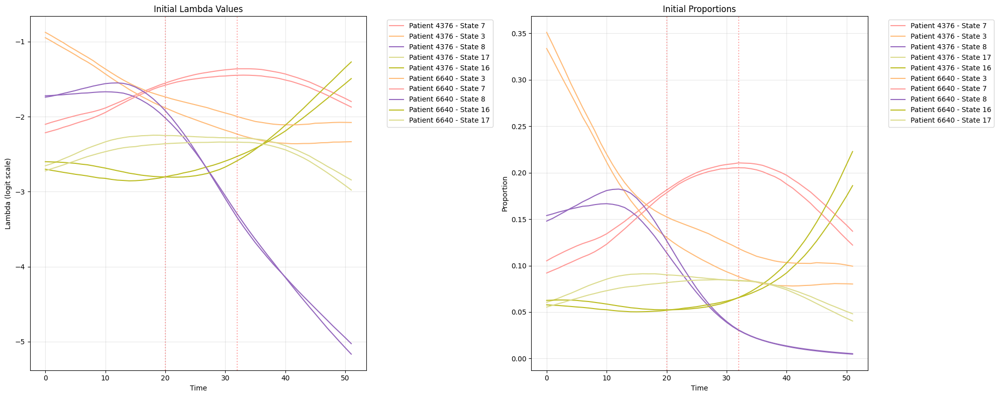


Genetic Effect Statistics for Sample Patients:

Patient 4376:
Mean shift: 0.046
Std of shifts: 0.104
Range of shifts: [-0.129, 0.344]

Top states and average proportions:
State 7: 0.170
State 3: 0.142
State 8: 0.081
State 17: 0.078
State 16: 0.076

Patient 6640:
Mean shift: 0.041
Std of shifts: 0.060
Range of shifts: [-0.110, 0.184]

Top states and average proportions:
State 3: 0.163
State 7: 0.161
State 8: 0.086
State 16: 0.084
State 17: 0.072


In [32]:
# Sample patients and set parameters
n_samples = 2
sample_patients = [4376, 6640]  # Use specific patients
n_top_states = 5  # Show only top 5 states per patient

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
time_points = np.arange(model.T)

# Get dominant states for these patients
lambda_patients = model.lambda_[sample_patients]  # [2, K, T]
patient_props = torch.softmax(lambda_patients, dim=1)  # [2, K, T]
mean_props = patient_props.mean(dim=-1)  # Average over time, now [2, K]
top_states = mean_props.topk(n_top_states, dim=-1).indices  # Get top states for each patient

# Color map for consistent colors across patients
colors = plt.cm.tab20(np.linspace(0, 1, model.K))

# Plot for each patient
for i, patient in enumerate(sample_patients):
    # Get diagnosis times for this patient
    diagnoses = model.Y[patient]  # Shape: [D, T]
    diagnosis_times = []
    for d in range(model.D):
        diag_time = torch.where(diagnoses[d])[0]
        if len(diag_time) > 0:
            diagnosis_times.append(diag_time[0].item())
            
    for j, k in enumerate(top_states[i]):
        k = k.item()  # Convert tensor to int
        color = colors[k]
        
        # Plot lambda values
        ax1.plot(time_points, model.lambda_[patient, k].detach(), '-', color=color,
                label=f'Patient {patient} - State {k}')
        
        # Plot proportions
        patient_props = torch.softmax(model.lambda_[patient].detach(), dim=0)[k]
        ax2.plot(time_points, patient_props, '-', color=color,
                label=f'Patient {patient} - State {k}')
    
    # Add vertical lines for diagnoses
    for t in diagnosis_times:
        ax1.axvline(x=t, color='red', alpha=0.2, linestyle=':')
        ax2.axvline(x=t, color='red', alpha=0.2, linestyle=':')

# Customize plots
ax1.set_title('Initial Lambda Values')
ax1.set_xlabel('Time')
ax1.set_ylabel('Lambda (logit scale)')
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

ax2.set_title('Initial Proportions')
ax2.set_xlabel('Time')
ax2.set_ylabel('Proportion')
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

# Print genetic effects and top states
print("\nGenetic Effect Statistics for Sample Patients:")
for i, patient in enumerate(sample_patients):
    genetic_effects = model.genetic_scale * (model.G[patient] @ model.gamma).detach()
    print(f"\nPatient {patient}:")
    print(f"Mean shift: {genetic_effects.mean():.3f}")
    print(f"Std of shifts: {genetic_effects.std():.3f}")
    print(f"Range of shifts: [{genetic_effects.min():.3f}, {genetic_effects.max():.3f}]")
    
    # Print top states and their proportions
    patient_mean_props = mean_props[i]
    top_props, top_indices = patient_mean_props.topk(n_top_states)
    print("\nTop states and average proportions:")
    for state, prop in zip(top_indices, top_props):
        print(f"State {state.item()}: {prop:.3f}")

In [33]:
print(f"LRT penalty (R): {model.lrtpen}")
print(f"Lambda amplitude: {model.lambda_amplitude}")
print(f"GP Weight: {model.gpweight}")

LRT penalty (R): 0
Lambda amplitude: 1
GP Weight: 0.0001


In [34]:
initial_gamma = model.gamma.detach().clone()
initial_phi = model.phi.detach().clone()
initial_lambda = model.lambda_.detach().clone()
initial_psi = model.psi.detach().clone()



In [41]:
import cProfile
import pstats
from pstats import SortKey

# For the healthtoo version
profiler = cProfile.Profile()
profiler.enable()
history_new = model.fit(E_censored, num_epochs=200, learning_rate=1e-1, lambda_reg=1e-2)
profiler.disable()
stats = pstats.Stats(profiler).sort_stats(SortKey.CUMULATIVE)
stats.print_stats(20)
        

/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:231: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  event_times_tensor = torch.tensor(event_times, dtype=torch.long)


Kappa gradient: -3.256e+00

Epoch 0
Loss: 48.4315

Monitoring signature responses:

Disease 161 (signature 7, LR=32.09):
  Theta for diagnosed: 0.150 ± 0.037
  Theta for others: 0.147
  Proportion difference: 0.002

Disease 76 (signature 7, LR=30.74):
  Theta for diagnosed: 0.150 ± 0.037
  Theta for others: 0.148
  Proportion difference: 0.003

Disease 260 (signature 8, LR=30.39):
  Theta for diagnosed: 0.087 ± 0.073
  Theta for others: 0.087
  Proportion difference: 0.000

Disease 347 (signature 3, LR=29.51):
  Theta for diagnosed: 0.149 ± 0.069
  Theta for others: 0.150
  Proportion difference: -0.001

Disease 50 (signature 15, LR=28.93):
  Theta for diagnosed: 0.016 ± 0.006
  Theta for others: 0.014
  Proportion difference: 0.002
Kappa gradient: -2.727e+00

Epoch 1
Loss: 691.7164

Monitoring signature responses:

Disease 161 (signature 7, LR=32.08):
  Theta for diagnosed: 0.150 ± 0.035
  Theta for others: 0.148
  Proportion difference: 0.002

Disease 76 (signature 7, LR=30.77):
  Th

In [42]:
model.kappa

Parameter containing:
tensor([2.1754], requires_grad=True)

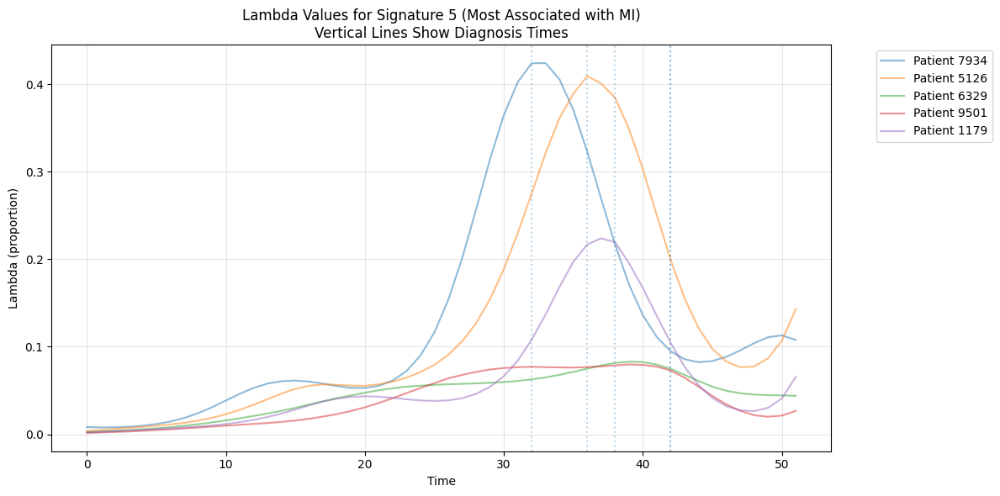

In [108]:
def plot_disease_lambda_alignment(model):
    """
    Plot lambda values aligned with disease occurrences for selected patients
    """
    # Find patients with specific diseases and their diagnosis times
    disease_idx = 112  # MI
    patients_with_disease = []
    diagnosis_times = []
    
    for patient in range(model.Y.shape[0]):
        diag_time = torch.where(model.Y[patient, disease_idx])[0]
        if len(diag_time) > 0:
            patients_with_disease.append(patient)
            diagnosis_times.append(diag_time[0].item())
    
    # Sample a few patients
    n_samples = min(5, len(patients_with_disease))
    sample_indices = np.random.choice(len(patients_with_disease), n_samples, replace=False)
    
    # Create plot
    fig, ax = plt.subplots(figsize=(12, 6))
    time_points = np.arange(model.T)
    
    # Find signature that most strongly associates with this disease
    psi_disease = model.psi[:, disease_idx].detach()
    sig_idx = torch.argmax(psi_disease).item()
    
    # Plot for each sampled patient
    for idx in sample_indices:
        patient = patients_with_disease[idx]
        diag_time = diagnosis_times[idx]
        
        # Plot lambda (detached)
        lambda_values = torch.softmax(model.lambda_[patient].detach(), dim=0)[sig_idx]
        ax.plot(time_points, lambda_values.numpy(),
                alpha=0.5, label=f'Patient {patient}')
        
        # Mark diagnosis time
        ax.axvline(x=diag_time, linestyle=':', alpha=0.3)
    
    ax.set_title(f'Lambda Values for Signature {sig_idx} (Most Associated with MI)\nVertical Lines Show Diagnosis Times')
    ax.set_xlabel('Time')
    ax.set_ylabel('Lambda (proportion)')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Call the plotting function
plot_disease_lambda_alignment(model)

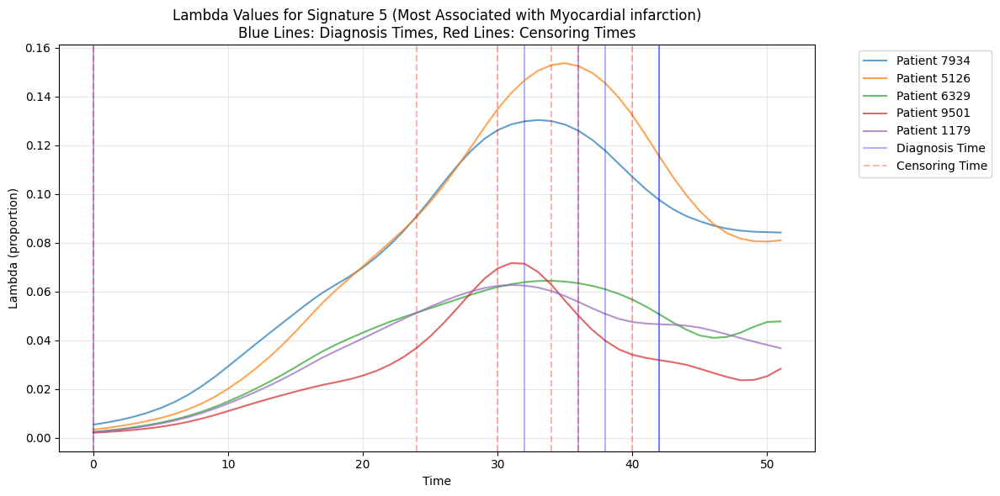

In [43]:
def plot_disease_lambda_alignment_for_test(model, Y_test, censored_indices, original_event_times, 
                                          disease_idx=112, sig_idx=None, n_samples=5):
    """
    Plot lambda values aligned with disease occurrences for censored patients
    
    Args:
        model: Trained model with censored event times
        Y_test: Original uncensored data
        censored_indices: Indices of patients who were censored
        original_event_times: Original event times for censored patients
        disease_idx: Index of the disease to analyze (default: 112 for MI)
        sig_idx: Specific signature index to plot (if None, will use most associated)
        n_samples: Number of patients to sample for plotting
    """
    # Filter patients who actually had the disease
    patients_with_disease = []
    diagnosis_times = []
    patient_indices = []
    
    for i, patient_idx in enumerate(censored_indices):
        # Check if this patient had the disease in the test data
        diag_time = torch.where(Y_test[patient_idx, disease_idx])[0]
        if len(diag_time) > 0:
            patients_with_disease.append(patient_idx)
            diagnosis_times.append(diag_time[0].item())
            patient_indices.append(i)  # Store position in censored_indices list
    
    # If no patients found, try a different disease
    if len(patients_with_disease) == 0:
        print(f"No patients found with disease {disease_idx}. Try a different disease index.")
        return
    
    # Sample patients if we have more than requested
    if len(patients_with_disease) > n_samples:
        sample_idx = np.random.choice(len(patients_with_disease), n_samples, replace=False)
        patients_with_disease = [patients_with_disease[i] for i in sample_idx]
        diagnosis_times = [diagnosis_times[i] for i in sample_idx]
        patient_indices = [patient_indices[i] for i in sample_idx]
    
    # Create plot
    fig, ax = plt.subplots(figsize=(12, 6))
    time_points = np.arange(model.T)
    
    # Find signature that most strongly associates with this disease if not specified
    if sig_idx is None:
        psi_disease = model.psi[:, disease_idx].detach()
        sig_idx = torch.argmax(psi_disease).item()
    
    # Get disease name if available
    disease_name = model.disease_names[disease_idx] if hasattr(model, 'disease_names') and model.disease_names is not None else f"Disease {disease_idx}"
    
    # Plot for each sampled patient
    for i, patient in enumerate(patients_with_disease):
        diag_time = diagnosis_times[i]
        censor_time = original_event_times[patient_indices[i]] - 2  # 2 years before event
        
        # Plot lambda (detached)
        lambda_values = torch.softmax(model.lambda_[patient].detach(), dim=0)[sig_idx]
        ax.plot(time_points, lambda_values.numpy(), alpha=0.7, label=f'Patient {patient}')
        
        # Mark diagnosis time with solid line
        ax.axvline(x=diag_time, linestyle='-', color='blue', alpha=0.3)
        
        # Mark censoring time with dashed line
        ax.axvline(x=censor_time, linestyle='--', color='red', alpha=0.3)
    
    # Add legend for vertical lines
    ax.axvline(x=0, linestyle='-', color='blue', alpha=0.3, label='Diagnosis Time')
    ax.axvline(x=0, linestyle='--', color='red', alpha=0.3, label='Censoring Time')
    
    # Set title and labels
    ax.set_title(f'Lambda Values for Signature {sig_idx} (Most Associated with {disease_name})\n'
                f'Blue Lines: Diagnosis Times, Red Lines: Censoring Times')
    ax.set_xlabel('Time')
    ax.set_ylabel('Lambda (proportion)')
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Return patient info for further analysis
    return {
        'patients': patients_with_disease,
        'diagnosis_times': diagnosis_times,
        'censoring_times': [original_event_times[i] - 2 for i in patient_indices]
    }

# Usage example:
patient_info = plot_disease_lambda_alignment_for_test(
     model, Y_test, censored_indices, original_event_times, 
     disease_idx=112  # MI
)

In [112]:
def plot_training_evolution(history_tuple):
    losses, gradient_history = history_tuple
    
    plt.figure(figsize=(15, 5))
    
    # Plot loss
    plt.subplot(1, 3, 1)
    plt.plot(losses, label='Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Evolution')
    plt.yscale('log')
    plt.legend()
    
    # Plot lambda gradients
    plt.subplot(1, 3, 2)
    lambda_norms = [torch.norm(g).item() for g in gradient_history['lambda_grad']]
    plt.plot(lambda_norms, label='Lambda gradients')
    plt.yscale('log')
    plt.xlabel('Epoch')
    plt.ylabel('Gradient norm')
    plt.title('Lambda Gradient Evolution')
    plt.legend()
    
    # Plot phi gradients
    plt.subplot(1, 3, 3)
    phi_norms = [torch.norm(g).item() for g in gradient_history['phi_grad']]
    plt.plot(phi_norms, label='Phi gradients')
    plt.yscale('log')
    plt.xlabel('Epoch')
    plt.ylabel('Gradient norm')
    plt.title('Phi Gradient Evolution')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

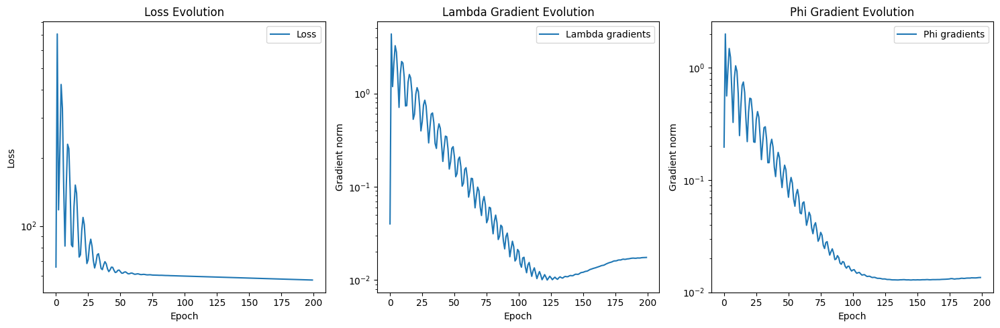

In [113]:
plot_training_evolution(history_new)

In [114]:
## do the cluster assignemtns still map?


# Get the signature with maximum psi for each disease
max_psi_indices = torch.argmax(final_psi, dim=0)  # Shape: [D]

# Compare with cluster assignments
matches = 0
total = len(model.clusters)

print("Comparing max psi signatures with cluster assignments:")
for k in range(model.K):
    # Find diseases assigned to cluster k
    cluster_diseases = np.where(model.clusters == k)[0]
    # Find diseases where k has maximum psi
    max_psi_diseases = np.where(max_psi_indices == k)[0]
    
    overlap = set(cluster_diseases) & set(max_psi_diseases)
    
    print(f"\nCluster {k}:")
    print(f"Number of diseases in cluster: {len(cluster_diseases)}")
    print(f"Number of diseases where this signature has max psi: {len(max_psi_diseases)}")
    print(f"Overlap: {len(overlap)}")
    
    matches += len(overlap)

print(f"\nOverall agreement: {matches}/{total} diseases ({matches/total*100:.1f}%)")

Comparing max psi signatures with cluster assignments:

Cluster 0:
Number of diseases in cluster: 16
Number of diseases where this signature has max psi: 16
Overlap: 16

Cluster 1:
Number of diseases in cluster: 21
Number of diseases where this signature has max psi: 21
Overlap: 21

Cluster 2:
Number of diseases in cluster: 15
Number of diseases where this signature has max psi: 15
Overlap: 15

Cluster 3:
Number of diseases in cluster: 82
Number of diseases where this signature has max psi: 82
Overlap: 82

Cluster 4:
Number of diseases in cluster: 5
Number of diseases where this signature has max psi: 5
Overlap: 5

Cluster 5:
Number of diseases in cluster: 7
Number of diseases where this signature has max psi: 7
Overlap: 7

Cluster 6:
Number of diseases in cluster: 8
Number of diseases where this signature has max psi: 8
Overlap: 8

Cluster 7:
Number of diseases in cluster: 22
Number of diseases where this signature has max psi: 22
Overlap: 22

Cluster 8:
Number of diseases in cluster:

In [115]:
model.psi[:,112]

tensor([-2.4133, -2.0282, -2.0700, -2.1973, -1.9229, -1.2272, -2.1277, -2.0557,
        -2.0092, -2.2590, -2.1735, -2.0738, -2.0585, -2.0330, -1.8766, -1.9685,
        -2.5690, -2.4836, -2.0029, -2.0967, -4.9747],
       grad_fn=<SelectBackward0>)

In [116]:
final_lambda = model.lambda_.detach().clone()
diff = torch.abs(final_lambda - initial_lambda)

print(f"Lambda changes with lr=1e-2:")
print(f"Mean absolute change: {torch.mean(diff):.3e}")
print(f"Max absolute change: {torch.max(diff):.3e}")
print(f"Std of changes: {torch.std(diff):.3e}")

Lambda changes with lr=1e-2:
Mean absolute change: 6.130e-02
Max absolute change: 7.114e+00
Std of changes: 1.551e-01


In [117]:
final_psi= model.psi.detach().clone()
diff = torch.abs(final_psi - initial_psi)

print(f"Psi changes with lr=1e-2:")
print(f"Mean absolute change: {torch.mean(diff):.3e}")
print(f"Max absolute change: {torch.max(diff):.3e}")
print(f"Std of changes: {torch.std(diff):.3e}")

Psi changes with lr=1e-2:
Mean absolute change: 1.511e-01
Max absolute change: 2.594e+00
Std of changes: 3.017e-01


In [118]:
final_phi= model.phi.detach().clone()
diff = torch.abs(final_phi - initial_phi)

print(f"Phi changes with lr=1e-2:")
print(f"Mean absolute change: {torch.mean(diff):.3e}")
print(f"Max absolute change: {torch.max(diff):.3e}")
print(f"Std of changes: {torch.std(diff):.3e}")

Phi changes with lr=1e-2:
Mean absolute change: 1.742e-02
Max absolute change: 1.920e+00
Std of changes: 6.796e-02


In [119]:
final_psi.shape

torch.Size([21, 348])

In [120]:
clusters_match = np.array_equal(initial_clusters, model.clusters)
print(f"\nClusters match exactly: {clusters_match}")


Clusters match exactly: True


In [121]:
model.clusters[17]

np.int32(19)

In [123]:
def plot_theta_differences():
    diseases = [112, 67, 127, 10, 17,114]
    signatures = [5, 7, 0, 17, 19,5]
    
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    for i, (d, sig) in enumerate(zip(diseases, signatures)):
        ax = axes[i]
        
        # Get diagnosis times
        diagnosis_mask = model.Y[:, d, :].bool()
        diagnosed = torch.where(diagnosis_mask)[0]
        
        # Get thetas
        pi, theta, phi_prob = model.forward()
        
        # Plot distributions
        diagnosed_theta = theta[diagnosis_mask, sig].detach().numpy()
        others_theta = theta[~diagnosis_mask, sig].detach().numpy()
        
        ax.hist(diagnosed_theta, alpha=0.5, label='At diagnosis', density=True)
        ax.hist(others_theta, alpha=0.5, label='Others', density=True)
        
        ax.set_title(f'Disease {d} (sig {sig})')
        ax.set_xlabel('Theta')
        ax.set_ylabel('Density')
        ax.legend()
    
    plt.tight_layout()
    plt.show()

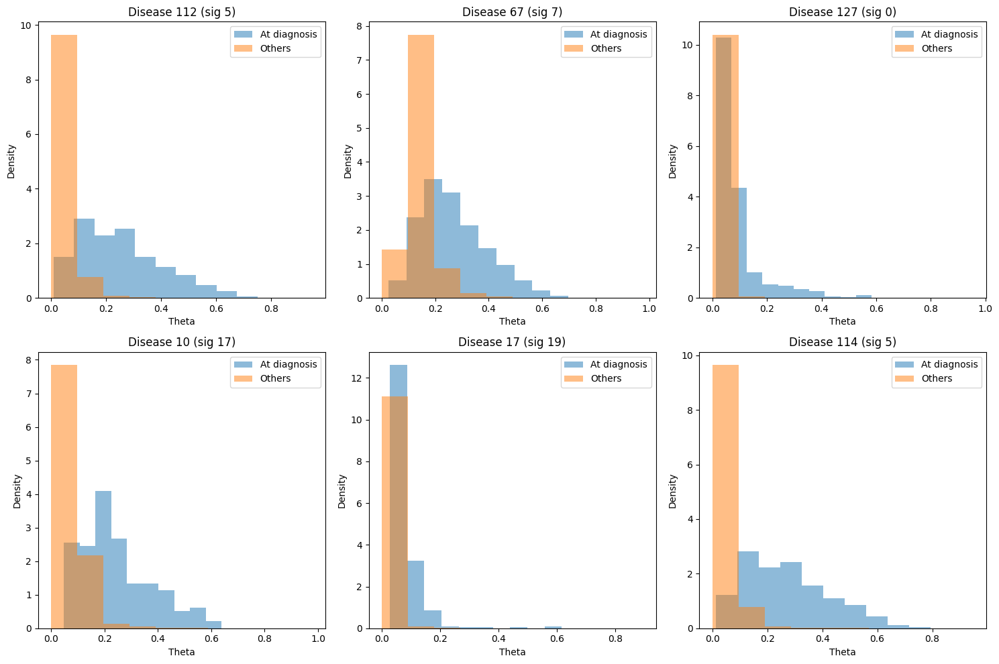

In [124]:
plot_theta_differences()

In [125]:
model.gpweight

0.0001

In [126]:
# Get μ_dt from checkpoint and predictions
mu_dt = model.prevalence_t  # Shape: (348, 52)



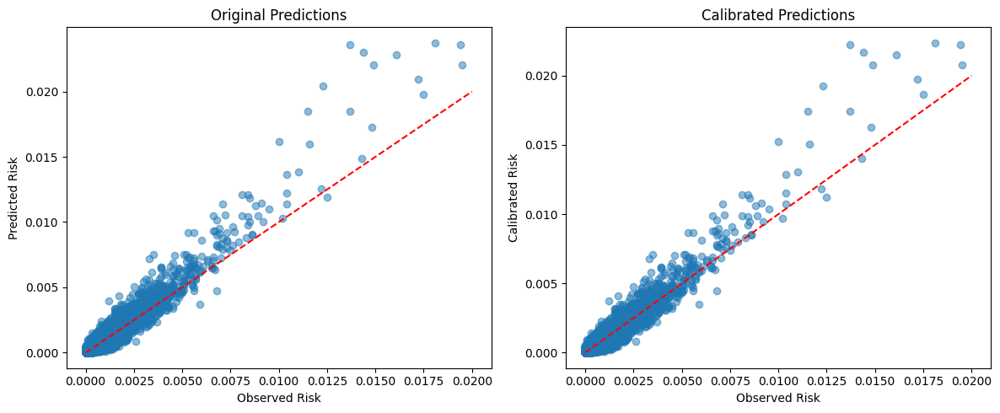

Mean observed risk: 0.000438
Mean predicted risk (original): 0.000464
Mean predicted risk (calibrated): 0.000438
Calibration scale factor: 0.943


In [127]:
# 1. Get predictions and actual values
predicted = model.forward()
pi_pred = predicted[0] if isinstance(predicted, tuple) else predicted
pi_pred = pi_pred.cpu().detach().numpy()
Y = model.Y.cpu().detach().numpy()

# 2. Calculate marginal risks directly
# Assuming dimensions are: [N, D, T] for both Y and pi_pred
observed_risk = Y.mean(axis=0).flatten()  # average across individuals
predicted_risk = pi_pred.mean(axis=0).flatten()
#observed_risk=mu_dt_flat
# 3. Apply calibration
scale_factor = np.mean(observed_risk) / np.mean(predicted_risk)
calibrated_risk = predicted_risk * scale_factor

# 4. Plot
plt.figure(figsize=(12, 5))

# Original predictions
plt.subplot(121)
plt.scatter(observed_risk, predicted_risk, alpha=0.5)
plt.plot([0, 0.02], [0, 0.02], 'r--')  # y=x line
plt.title('Original Predictions')
plt.xlabel('Observed Risk')
plt.ylabel('Predicted Risk')

# Calibrated predictions
plt.subplot(122)
plt.scatter(observed_risk, calibrated_risk, alpha=0.5)
plt.plot([0, 0.02], [0, 0.02], 'r--')  # y=x line
plt.title('Calibrated Predictions')
plt.xlabel('Observed Risk')
plt.ylabel('Calibrated Risk')

plt.tight_layout()
plt.show()

# Print statistics
print(f"Mean observed risk: {np.mean(observed_risk):.6f}")
print(f"Mean predicted risk (original): {np.mean(predicted_risk):.6f}")
print(f"Mean predicted risk (calibrated): {np.mean(calibrated_risk):.6f}")
print(f"Calibration scale factor: {scale_factor:.3f}")


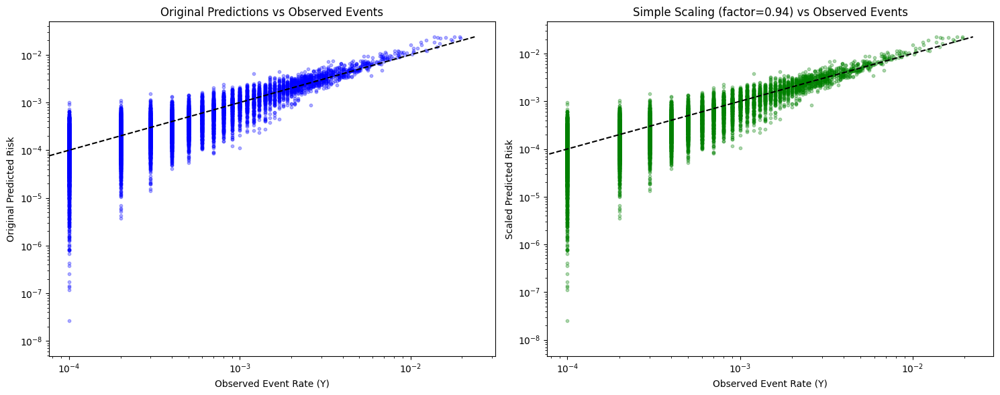

Scale factor: 0.943


In [128]:
# Get predictions
predicted = model.forward()
pi_pred = predicted[0] if isinstance(predicted, tuple) else predicted
predicted_risk_2d = pi_pred.cpu().detach().numpy().mean(axis=0)  # average across individuals

# Get raw observations and calculate scale factor
Y_np = model.Y.cpu().detach().numpy()
Y_mean_2d = Y_np.mean(axis=0)  # average across individuals
scale_factor = Y_mean_2d.mean() / predicted_risk_2d.mean()
scaled_risk_2d = predicted_risk_2d * scale_factor

# Create plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Original predictions vs raw observations
ax1.scatter(Y_mean_2d.flatten(), predicted_risk_2d.flatten(), 
           alpha=0.3, color='blue', s=10)
ax1.plot([0, max(Y_mean_2d.max(), predicted_risk_2d.max())], 
         [0, max(Y_mean_2d.max(), predicted_risk_2d.max())], 
         'k--', label='x=y')
ax1.set_xlabel('Observed Event Rate (Y)')
ax1.set_ylabel('Original Predicted Risk')
ax1.set_title('Original Predictions vs Observed Events')
ax1.set_xscale('log')
ax1.set_yscale('log')

# Scaled predictions vs raw observations
ax2.scatter(Y_mean_2d.flatten(), scaled_risk_2d.flatten(), 
           alpha=0.3, color='green', s=10)
ax2.plot([0, max(Y_mean_2d.max(), scaled_risk_2d.max())], 
         [0, max(Y_mean_2d.max(), scaled_risk_2d.max())], 
         'k--', label='x=y')
ax2.set_xlabel('Observed Event Rate (Y)')
ax2.set_ylabel('Scaled Predicted Risk')
ax2.set_title(f'Simple Scaling (factor={scale_factor:.2f}) vs Observed Events')
ax2.set_xscale('log')
ax2.set_yscale('log')

plt.tight_layout()
plt.show()

print(f"Scale factor: {scale_factor:.3f}")

In [129]:

ss_res = np.sum((observed_risk - predicted_risk) ** 2)
ss_tot = np.sum((observed_risk - np.mean(observed_risk)) ** 2)
r2 = 1 - (ss_res / ss_tot)

print(f"R^2: {r2:.3f}")

R^2: 0.867


In [130]:
def apply_loess_calibration(predicted_risks, observed_risks):
    # Fit LOESS calibration curve
    calibrated_risks = lowess(
        observed_risks, 
        predicted_risks,
        frac=0.3,  # Can tune this parameter
        return_sorted=False
    )
    
    # Apply to predictions
    pi_calibrated = np.zeros_like(pi)
    for d in range(model.D):
        for t in range(model.T):
            risks = pi[:, d, t]
            pi_calibrated[:, d, t] = lowess(
                observed_risks,  # Use same calibration curve
                risks,
                frac=0.3
            )
    
    return pi_calibrated

In [131]:
    calibrated_risks = lowess(
        observed_risk, 
        predicted_risk,
        frac=0.3,  # Can tune this parameter
        return_sorted=False
    )

In [133]:
def plot_signature_temporal_patterns(model, disease_names, plot_dir, n_top=10, selected_signatures=None):
    """Show temporal patterns of top diseases for each signature"""
    phi = model.phi.detach().numpy()
    prevalence_logit = model.logit_prev_t.detach().numpy()
    import os
    phi_centered = np.zeros_like(phi)
    for k in range(phi.shape[0]):
        for d in range(phi.shape[1]):
            phi_centered[k, d, :] = phi[k, d, :] - prevalence_logit[d, :]
    
    phi_avg = phi_centered.mean(axis=2)
    
    if selected_signatures is None:
        selected_signatures = range(phi_avg.shape[0])
    
    n_sigs = len(selected_signatures)
    fig, axes = plt.subplots(n_sigs, 1, figsize=(15, 5*n_sigs))
    if n_sigs == 1:
        axes = [axes]
    
    for i, k in enumerate(selected_signatures):
        scores = phi_avg[k, :]
        top_indices = np.argsort(scores)[-n_top:][::-1]
        
        ax = axes[i]
        for idx in top_indices:
            temporal_pattern = phi[k, idx, :]
            disease_name = disease_names[idx]
            ax.plot(temporal_pattern, label=disease_name)
        
        ax.set_title(f'Signature {k} - Top Disease Temporal Patterns')
        ax.set_xlabel('Time')
        ax.set_ylabel('Phi Value')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(plot_dir, 'temporal_patterns_withkappa.png'))
    plt.close('all') 

In [134]:
plot_signature_temporal_patterns(model, essentials['disease_names'],'/Users/sarahurbut/Dropbox (Personal)/', n_top=10, selected_signatures=[0,5,6,19])

In [135]:
def plot_signature_top_diseases_centered(model, disease_names, n_top=10):
    """
    Show top diseases for each signature, centered relative to prevalence
    """
    # Get phi and prevalence
    phi = model.phi.detach().numpy()  # Shape: (K, D, T)
    prevalence_logit = model.logit_prev_t.detach().numpy()  # Shape: (D, T)
    
    # Center phi relative to prevalence
    phi_centered = np.zeros_like(phi)
    for k in range(phi.shape[0]):
        for d in range(phi.shape[1]):
            phi_centered[k, d, :] = phi[k, d, :] - prevalence_logit[d, :]
    
    # Average over time
    phi_avg = phi_centered.mean(axis=2)  # Shape: (K, D)
    
    # For each signature, get top diseases
    for k in range(phi_avg.shape[0]):
        scores = phi_avg[k, :]
        top_indices = np.argsort(scores)[-n_top:][::-1]
        
        print(f"\nTop {n_top} diseases in Signature {k} (relative to baseline):")
        for idx in top_indices:
            avg_effect = scores[idx]
            temporal_std = np.std(phi_centered[k, idx, :])
            # Convert to odds ratio for interpretability
            odds_ratio = np.exp(avg_effect)
            print(f"{disease_names[idx]}: effect={avg_effect:.3f} (OR={odds_ratio:.2f}), std={temporal_std:.3f}")

# Run visualization
plot_signature_top_diseases_centered(model, essentials['disease_names'])


Top 10 diseases in Signature 0 (relative to baseline):
Atrial fibrillation and flutter: effect=1.615 (OR=5.03), std=0.585
Heart failure NOS: effect=1.463 (OR=4.32), std=0.336
Cardiomegaly: effect=1.270 (OR=3.56), std=0.364
Paroxysmal ventricular tachycardia: effect=1.269 (OR=3.56), std=0.113
Aortic valve disease: effect=1.264 (OR=3.54), std=0.142
Pleurisy; pleural effusion: effect=1.254 (OR=3.51), std=0.420
Congestive heart failure (CHF) NOS: effect=1.239 (OR=3.45), std=0.282
Congenital anomalies of great vessels: effect=1.170 (OR=3.22), std=0.198
Mitral valve disease: effect=1.166 (OR=3.21), std=0.287
Pericarditis: effect=1.143 (OR=3.14), std=0.082

Top 10 diseases in Signature 1 (relative to baseline):
Hallux valgus (Bunion): effect=1.277 (OR=3.59), std=0.113
Enthesopathy: effect=1.272 (OR=3.57), std=0.229
Peripheral enthesopathies and allied syndromes: effect=1.259 (OR=3.52), std=0.118
Other disorders of synovium, tendon, and bursa: effect=1.223 (OR=3.40), std=0.076
Pain in joint: 

In [136]:
mean_phi=model.phi.detach().cpu().numpy()

In [137]:
initial_psi[:,112]

tensor([-1.9906, -2.0008, -2.0034, -2.0126, -1.9857,  0.8679, -1.9930, -2.0030,
        -2.0053, -2.0097, -1.9918, -1.9775, -2.0165, -1.9968, -1.9910, -2.0046,
        -1.9988, -1.9991, -1.9921, -1.9857, -5.0022])

In [138]:
model.psi[:,112]

tensor([-2.4133, -2.0282, -2.0700, -2.1973, -1.9229, -1.2272, -2.1277, -2.0557,
        -2.0092, -2.2590, -2.1735, -2.0738, -2.0585, -2.0330, -1.8766, -1.9685,
        -2.5690, -2.4836, -2.0029, -2.0967, -4.9747],
       grad_fn=<SelectBackward0>)

In [139]:
model.K=21

In [140]:
model.kappa

Parameter containing:
tensor([2.9875], requires_grad=True)

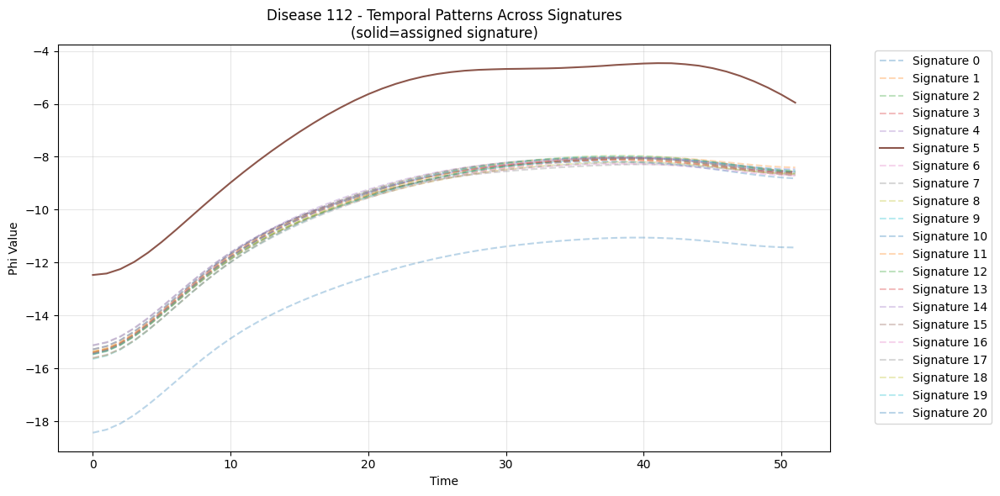


Psi values for disease 112:
Signature 0: -2.413
Signature 1: -2.028
Signature 2: -2.070
Signature 3: -2.197
Signature 4: -1.923
Signature 5: -1.227
Signature 6: -2.128
Signature 7: -2.056
Signature 8: -2.009
Signature 9: -2.259
Signature 10: -2.174
Signature 11: -2.074
Signature 12: -2.059
Signature 13: -2.033
Signature 14: -1.877
Signature 15: -1.968
Signature 16: -2.569
Signature 17: -2.484
Signature 18: -2.003
Signature 19: -2.097
Signature 20: -4.975


In [141]:
def plot_disease_signature_patterns(model, disease_idx=112):
    plt.figure(figsize=(12, 6))
    time_points = np.arange(model.T)
    
    # Get phi values for this disease across all signatures
    phi_disease = model.phi[:, disease_idx].detach()  # [K, T]
    psi_disease = model.psi[:, disease_idx].detach()  # [K]
    
    # Plot phi trajectories
    for k in range(model.K):
        # Make the assigned signature (highest psi) stand out
        is_assigned = (psi_disease[k] == psi_disease.max())
        alpha = 1.0 if is_assigned else 0.3
        linestyle = '-' if is_assigned else '--'
        
        plt.plot(time_points, phi_disease[k], 
                label=f'Signature {k}', 
                alpha=alpha,
                linestyle=linestyle)
    
    plt.title(f'Disease {disease_idx} - Temporal Patterns Across Signatures\n(solid=assigned signature)')
    plt.xlabel('Time')
    plt.ylabel('Phi Value')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Print psi values
    print(f"\nPsi values for disease {disease_idx}:")
    for k in range(model.K):
        print(f"Signature {k}: {psi_disease[k]:.3f}")

# Call the function for MI (disease 112)
plot_disease_signature_patterns(model, disease_idx=112)

/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:541: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  print("\nLambda kernel (first 5x5):")


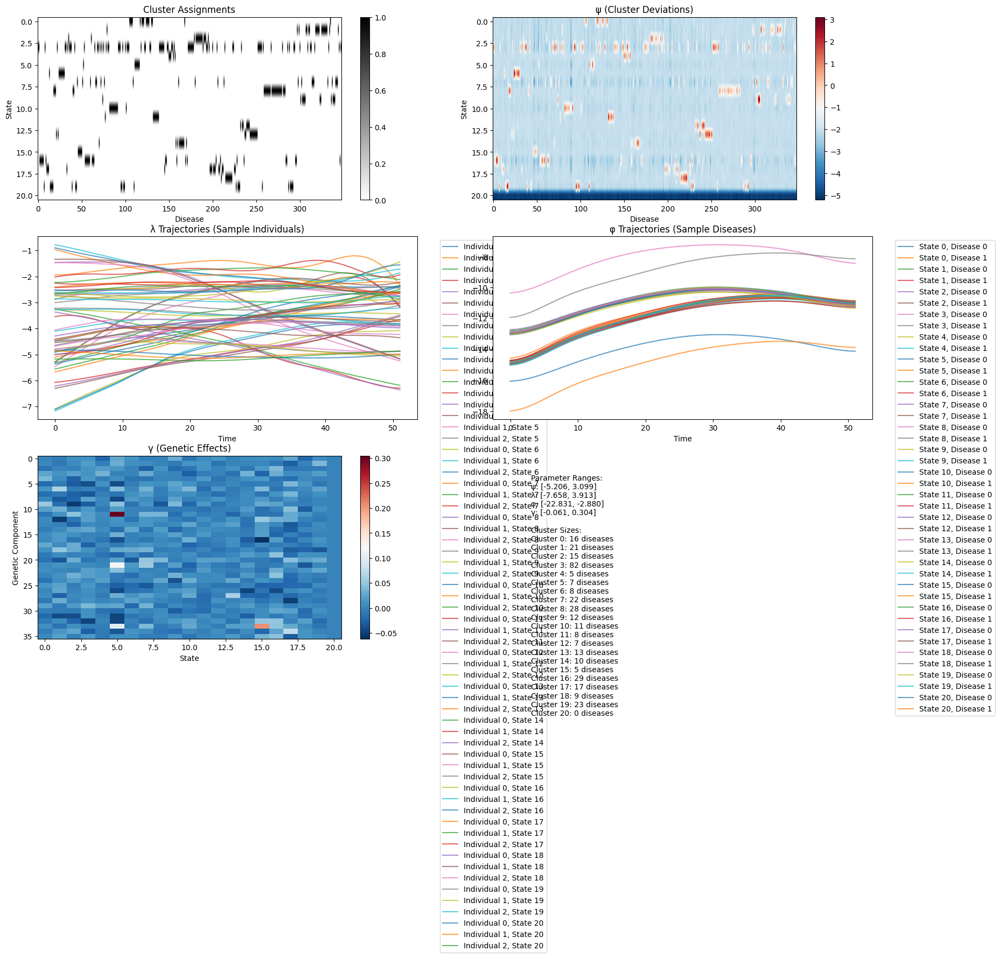

In [143]:
model.visualize_initialization()

In [144]:
def compare_disease_rankings(model, disease_names, n_top=10):
    """
    Compare initial vs final disease rankings for each signature
    """
    # Get initial rankings from psi
    psi = model.psi.detach().numpy()  # Shape: (K, D)
    
    # Get final rankings from centered phi
    phi = model.phi.detach().numpy()  # Shape: (K, D, T)
    prevalence_logit = model.logit_prev_t.detach().numpy()  # Shape: (D, T)
    
    # Center phi relative to prevalence
    phi_centered = np.zeros_like(phi)
    for k in range(phi.shape[0]):
        for d in range(phi.shape[1]):
            phi_centered[k, d, :] = phi[k, d, :] - prevalence_logit[d, :]
    
    # Average over time
    phi_avg = phi_centered.mean(axis=2)  # Shape: (K, D)
    
    # Compare rankings for each signature
    for k in range(phi_avg.shape[0]):
        print(f"\nSignature {k}:")
        
        # Get initial top diseases from psi
        initial_scores = psi[k, :]
        initial_top = np.argsort(initial_scores)[-n_top:][::-1]
        
        # Get final top diseases from phi
        final_scores = phi_avg[k, :]
        final_top = np.argsort(final_scores)[-n_top:][::-1]
        
        print("\nInitial top diseases:")
        for i, idx in enumerate(initial_top):
            print(f"{i+1}. {disease_names[idx]}: {initial_scores[idx]:.3f}")
            
        print("\nFinal top diseases:")
        for i, idx in enumerate(final_top):
            print(f"{i+1}. {disease_names[idx]}: {final_scores[idx]:.3f}")
            
        # Calculate rank changes
        initial_ranks = {disease: rank for rank, disease in enumerate(initial_top)}
        final_ranks = {disease: rank for rank, disease in enumerate(final_top)}
        
        # Find diseases that changed ranks significantly
        changed_diseases = set(initial_top) | set(final_top)
        for disease in changed_diseases:
            initial_rank = initial_ranks.get(disease, n_top+1)
            final_rank = final_ranks.get(disease, n_top+1)
            if abs(final_rank - initial_rank) > 2:  # Threshold for significant change
                print(f"\n{disease_names[disease]} changed from rank {initial_rank+1} to {final_rank+1}")

# Run comparison
compare_disease_rankings(model, essentials['disease_names'])


Signature 0:

Initial top diseases:
1. Paroxysmal ventricular tachycardia: 1.079
2. Pericarditis: 1.029
3. Heart failure NOS: 0.780
4. Mitral valve disease: 0.777
5. Cardiomegaly: 0.751
6. Congestive heart failure (CHF) NOS: 0.453
7. Aortic valve disease: 0.213
8. Paroxysmal supraventricular tachycardia: 0.143
9. Primary/intrinsic cardiomyopathies: -0.138
10. Congenital anomalies of great vessels: -0.314

Final top diseases:
1. Atrial fibrillation and flutter: 1.615
2. Heart failure NOS: 1.463
3. Cardiomegaly: 1.270
4. Paroxysmal ventricular tachycardia: 1.269
5. Aortic valve disease: 1.264
6. Pleurisy; pleural effusion: 1.254
7. Congestive heart failure (CHF) NOS: 1.239
8. Congenital anomalies of great vessels: 1.170
9. Mitral valve disease: 1.166
10. Pericarditis: 1.143

Pleurisy; pleural effusion changed from rank 12 to 6

Mitral valve disease changed from rank 4 to 9

Pericarditis changed from rank 2 to 10

Primary/intrinsic cardiomyopathies changed from rank 9 to 12

Paroxysmal s

In [145]:
model.K=21

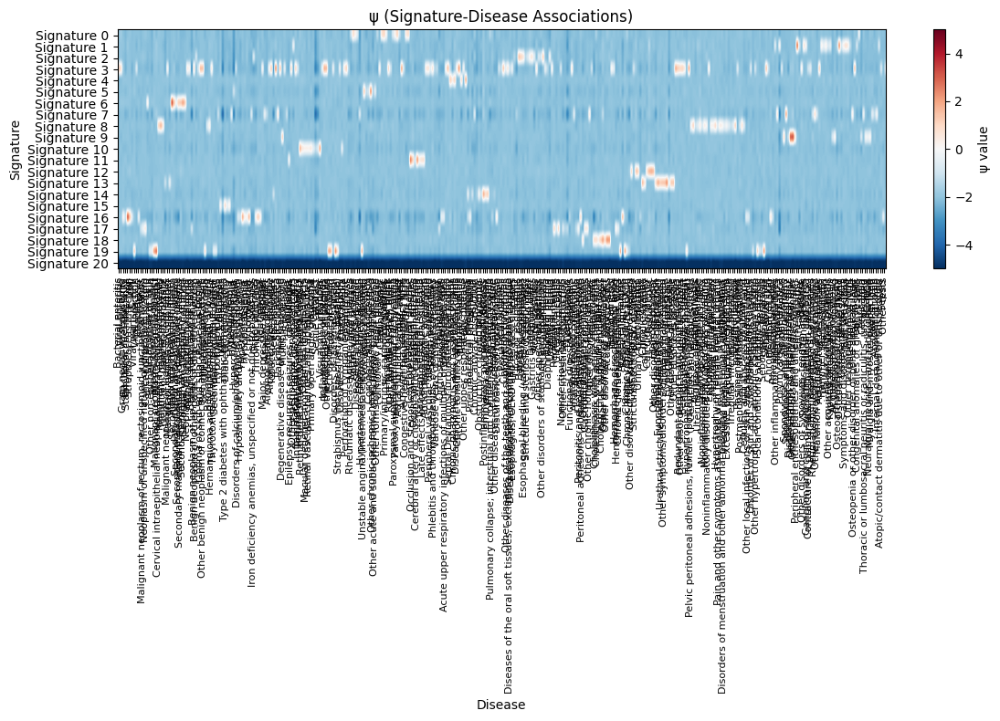

In [146]:
def plot_psi_heatmap(model, disease_names=None, figsize=(12, 8)):
    """
    Plot heatmap of psi values (signature-disease associations)
    
    Args:
        model: The trained model containing psi parameter
        disease_names: Optional list of disease names
        figsize: Tuple specifying figure size
    """
    plt.figure(figsize=figsize)
    
    # Get psi values from model
    psi = model.psi.detach().numpy()
    
    # Create heatmap
    im = plt.imshow(psi, aspect='auto', cmap='RdBu_r', vmin=-5, vmax=5)
    
    # Add colorbar
    plt.colorbar(im, label='ψ value')
    
    # Labels
    plt.xlabel('Disease')
    plt.ylabel('Signature')
    plt.title('ψ (Signature-Disease Associations)')
    
    # Optional: Add disease names if provided
    if disease_names is not None:
        plt.xticks(range(len(disease_names)), disease_names, 
                  rotation=90, fontsize=8)
    
    # Signature labels
    plt.yticks(range(psi.shape[0]), [f'Signature {i}' for i in range(psi.shape[0])])
    
    plt.tight_layout()
    plt.show()

# Usage:
plot_psi_heatmap(model, disease_names=essentials['disease_names'])  # if you have disease names
# or simply:
# plot_psi_heatmap(model)

Psi with kappa:
min=-5.206, max=3.099
mean=-2.106, std=0.842
max=3.099, std=0.842


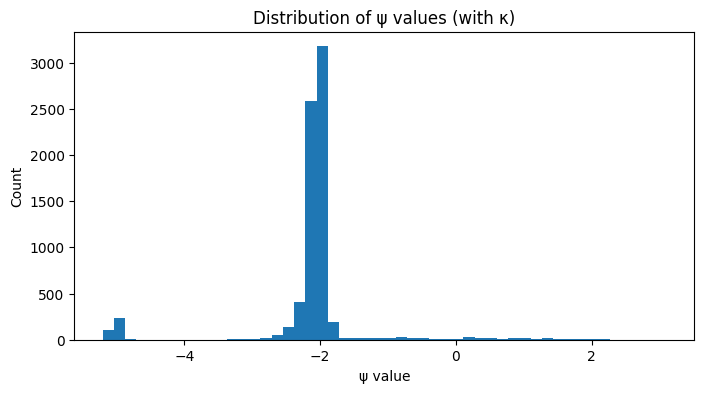

In [147]:
# For the notebook with kappa:
psi = model.psi.detach().numpy()
print("Psi with kappa:")
print(f"min={psi.min():.3f}, max={psi.max():.3f}")
print(f"mean={psi.mean():.3f}, std={psi.std():.3f}")
print(f"max={psi.max():.3f}, std={psi.std():.3f}")
# Quick histogram
plt.figure(figsize=(8, 4))
plt.hist(psi.flatten(), bins=50)
plt.title('Distribution of ψ values (with κ)')
plt.xlabel('ψ value')
plt.ylabel('Count')
plt.show()

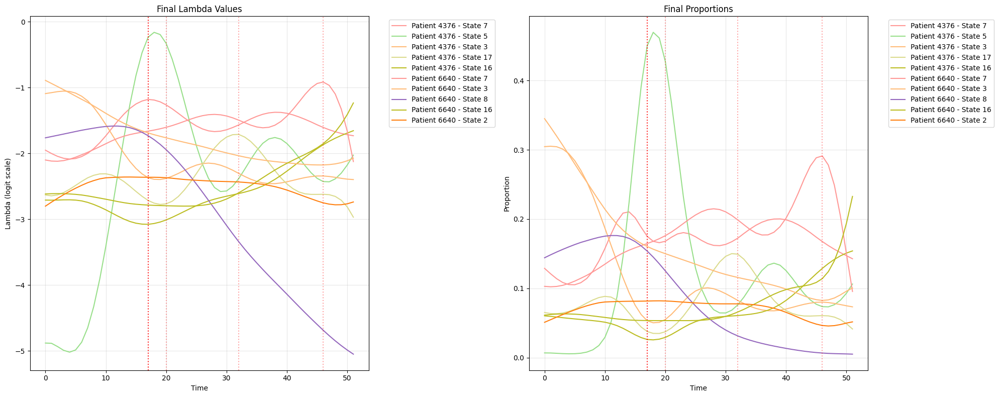


Genetic Effect Statistics for Sample Patients:

Patient 4376:
Mean shift: 0.057
Std of shifts: 0.154
Range of shifts: [-0.178, 0.444]

Top states and average proportions:
State 7: 0.166
State 5: 0.131
State 3: 0.121
State 17: 0.078
State 16: 0.068

Patient 6640:
Mean shift: 0.037
Std of shifts: 0.087
Range of shifts: [-0.146, 0.192]

Top states and average proportions:
State 7: 0.179
State 3: 0.158
State 8: 0.085
State 16: 0.078
State 2: 0.070


In [148]:
# Sample patients and set parameters
n_samples = 2
sample_patients = [4376, 6640]  # Use specific patients
n_top_states = 5  # Show only top 5 states per patient

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
time_points = np.arange(model.T)

# Get dominant states for these patients
lambda_patients = model.lambda_[sample_patients]  # [2, K, T]
patient_props = torch.softmax(lambda_patients, dim=1)  # [2, K, T]
mean_props = patient_props.mean(dim=-1)  # Average over time, now [2, K]
top_states = mean_props.topk(n_top_states, dim=-1).indices  # Get top states for each patient

# Color map for consistent colors across patients
colors = plt.cm.tab20(np.linspace(0, 1, model.K))

# Plot for each patient
for i, patient in enumerate(sample_patients):
    # Get diagnosis times for this patient
    diagnoses = model.Y[patient]  # Shape: [D, T]
    diagnosis_times = []
    for d in range(model.D):
        diag_time = torch.where(diagnoses[d])[0]
        if len(diag_time) > 0:
            diagnosis_times.append(diag_time[0].item())
            
    for j, k in enumerate(top_states[i]):
        k = k.item()  # Convert tensor to int
        color = colors[k]
        
        # Plot lambda values
        ax1.plot(time_points, model.lambda_[patient, k].detach(), '-', color=color,
                label=f'Patient {patient} - State {k}')
        
        # Plot proportions
        patient_props = torch.softmax(model.lambda_[patient].detach(), dim=0)[k]
        ax2.plot(time_points, patient_props, '-', color=color,
                label=f'Patient {patient} - State {k}')
    
    # Add vertical lines for diagnoses
    for t in diagnosis_times:
        ax1.axvline(x=t, color='red', alpha=0.2, linestyle=':')
        ax2.axvline(x=t, color='red', alpha=0.2, linestyle=':')

# Customize plots
ax1.set_title('Final Lambda Values')
ax1.set_xlabel('Time')
ax1.set_ylabel('Lambda (logit scale)')
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

ax2.set_title('Final Proportions')
ax2.set_xlabel('Time')
ax2.set_ylabel('Proportion')
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

# Print genetic effects and top states
print("\nGenetic Effect Statistics for Sample Patients:")
for i, patient in enumerate(sample_patients):
    genetic_effects = model.genetic_scale * (model.G[patient] @ model.gamma).detach()
    print(f"\nPatient {patient}:")
    print(f"Mean shift: {genetic_effects.mean():.3f}")
    print(f"Std of shifts: {genetic_effects.std():.3f}")
    print(f"Range of shifts: [{genetic_effects.min():.3f}, {genetic_effects.max():.3f}]")
    
    # Print top states and their proportions
    patient_mean_props = mean_props[i]
    top_props, top_indices = patient_mean_props.topk(n_top_states)
    print("\nTop states and average proportions:")
    for state, prop in zip(top_indices, top_props):
        print(f"State {state.item()}: {prop:.3f}")

In [9]:
model_save_path='/Users/sarahurbut/Dropbox/model_with_kappa_bigam.pt'

In [ ]:

torch.save({
    'model_state_dict': model.state_dict(),
    'clusters': model.clusters,
    'initial_phi': initial_phi, 
    'initial_lambda': initial_lambda, 
    'psi': model.psi,
    'Y': Y_100k,
    'prevalence_t': essentials['prevalence_t'],
    'logit_prevalence_t': model.logit_prev_t,
    'G': G_100k,
    'E': E_100k,
    'indices': indices,
    'disease_names': essentials['disease_names'],
    'hyperparameters': {
        'N': Y_100k.shape[0],
        'D': Y_100k.shape[1],
        'T': Y_100k.shape[2],
        'P': G_100k.shape[1],
        'K': model.phi.shape[0]
    }
}, model_save_path)

In [12]:
checkpoint=torch.load(model_save_path)
model.load_state_dict(checkpoint['model_state_dict'])

model.logit_prev_t=checkpoint['logit_prevalence_t']
model.psi=checkpoint['psi']
model.clusters=checkpoint['clusters']
model.initial_phi=checkpoint['initial_phi']
model.initial_lambda=checkpoint['initial_lambda']

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_87999/2317994293.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint=torch.load(model_save_path)


In [14]:
model.kappa

Parameter containing:
tensor([2.9875], requires_grad=True)

Number of diseases: 348, Number of timepoints: 52
Overall mean predicted risk: 0.000464
Overall mean observed risk: 0.000401
Overall calibration factor: 0.8632


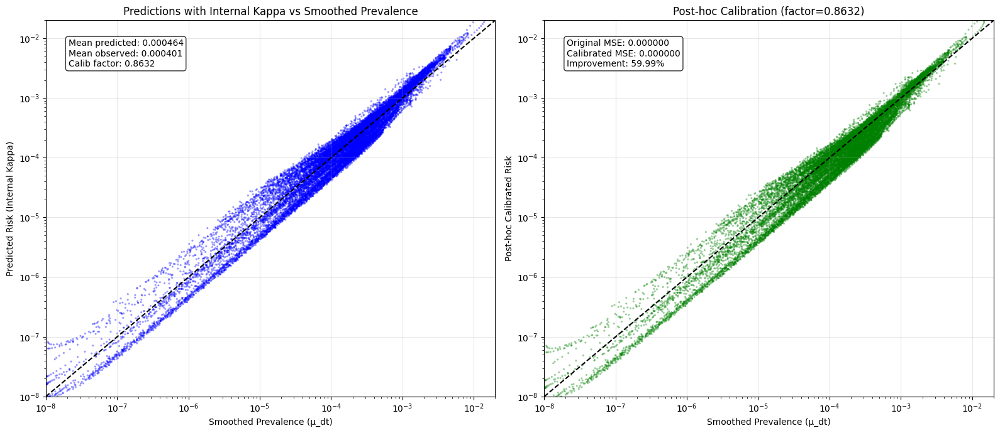


Calibration with Internal Kappa:
Mean predicted risk: 0.000464
Mean observed prevalence: 0.000401
Calibration factor needed: 0.8632
MSE before post-hoc calibration: 0.000000
MSE after post-hoc calibration: 0.000000
Improvement from post-hoc calibration: 59.99%


In [15]:
def analyze_internal_kappa_calibration(model, mu_dt):
    """
    Analyze calibration for a model with internal kappa implementation
    
    Args:
        model: The loaded model with internal kappa
        mu_dt: The observed prevalence matrix
    
    Returns:
        Calibration plot figure
    """
    # Get predictions from the model
    with torch.no_grad():
        pi, theta, phi_prob = model.forward()
    
    # Convert to numpy for analysis
    pi_np = pi.detach().numpy()
    
    # Aggregate predictions and observations
    all_pi_values = []
    all_mu_dt_values = []
    
    n_diseases, n_timepoints = mu_dt.shape
    print(f"Number of diseases: {n_diseases}, Number of timepoints: {n_timepoints}")
    
    # Aggregate pi values for each disease and timepoint
    for d in range(n_diseases):
        for t in range(n_timepoints):
            # Get valid entries (non-NaN) for this disease and timepoint
            valid_mask = ~np.isnan(pi_np[:, d, t])
            n_valid = np.sum(valid_mask)
            
            if n_valid > 0:
                avg_pi_dt = np.mean(pi_np[valid_mask, d, t])
                all_pi_values.append(avg_pi_dt)
                all_mu_dt_values.append(mu_dt[d, t])
    
    # Convert to numpy arrays
    all_pi_values = np.array(all_pi_values)
    all_mu_dt_values = np.array(all_mu_dt_values)
    
    # Calculate calibration factor
    valid_mask = (all_pi_values > 0) & (all_mu_dt_values > 0)
    pi_valid = all_pi_values[valid_mask]
    mu_dt_valid = all_mu_dt_values[valid_mask]
    
    mean_pred = np.mean(pi_valid)
    mean_obs = np.mean(mu_dt_valid)
    calib_factor = mean_obs / mean_pred
    
    print(f"Overall mean predicted risk: {mean_pred:.6f}")
    print(f"Overall mean observed risk: {mean_obs:.6f}")
    print(f"Overall calibration factor: {calib_factor:.4f}")
    
    # Create figure with two plots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
    
    # Plot 1: Original predictions vs. smoothed prevalence
    ax1.scatter(mu_dt_valid, pi_valid, alpha=0.4, s=5, color='blue', edgecolor='none')
    ax1.plot([1e-8, 2e-2], [1e-8, 2e-2], 'k--', linewidth=1.5)  # Perfect calibration line
    
    ax1.set_xlabel('Smoothed Prevalence (μ_dt)')
    ax1.set_ylabel('Predicted Risk (Internal Kappa)')
    ax1.set_title('Predictions with Internal Kappa vs Smoothed Prevalence')
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlim(1e-8, 2e-2)
    ax1.set_ylim(1e-8, 2e-2)
    ax1.grid(True, alpha=0.3)
    
    # Add text with calibration metrics
    ax1.text(0.05, 0.95, 
             f"Mean predicted: {mean_pred:.6f}\nMean observed: {mean_obs:.6f}\nCalib factor: {calib_factor:.4f}", 
             transform=ax1.transAxes, 
             verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Plot 2: Post-hoc calibrated predictions
    scaled_pi = pi_valid * calib_factor
    
    ax2.scatter(mu_dt_valid, scaled_pi, alpha=0.4, s=5, color='green', edgecolor='none')
    ax2.plot([1e-8, 2e-2], [1e-8, 2e-2], 'k--', linewidth=1.5)  # Perfect calibration line
    
    ax2.set_xlabel('Smoothed Prevalence (μ_dt)')
    ax2.set_ylabel('Post-hoc Calibrated Risk')
    ax2.set_title(f'Post-hoc Calibration (factor={calib_factor:.4f})')
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.set_xlim(1e-8, 2e-2)
    ax2.set_ylim(1e-8, 2e-2)
    ax2.grid(True, alpha=0.3)
    
    # Add text with calibration improvement metrics
    mse_orig = np.mean((pi_valid - mu_dt_valid)**2)
    mse_calib = np.mean((scaled_pi - mu_dt_valid)**2)
    improvement = (mse_orig - mse_calib) / mse_orig * 100
    
    ax2.text(0.05, 0.95, 
             f"Original MSE: {mse_orig:.6f}\nCalibrated MSE: {mse_calib:.6f}\nImprovement: {improvement:.2f}%", 
             transform=ax2.transAxes, 
             verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Print summary
    print(f"\nCalibration with Internal Kappa:")
    print(f"Mean predicted risk: {mean_pred:.6f}")
    print(f"Mean observed prevalence: {mean_obs:.6f}")
    print(f"Calibration factor needed: {calib_factor:.4f}")
    print(f"MSE before post-hoc calibration: {mse_orig:.6f}")
    print(f"MSE after post-hoc calibration: {mse_calib:.6f}")
    print(f"Improvement from post-hoc calibration: {improvement:.2f}%")
    
    return fig, all_pi_values, all_mu_dt_values, calib_factor

# Usage example:
# Assuming you have your model and mu_dt (prevalence matrix) available
mu_dt = essentials['prevalence_t'] # Shape: (348, 52)
fig, all_pi, all_mu_dt, calib_factor = analyze_internal_kappa_calibration(model, mu_dt)

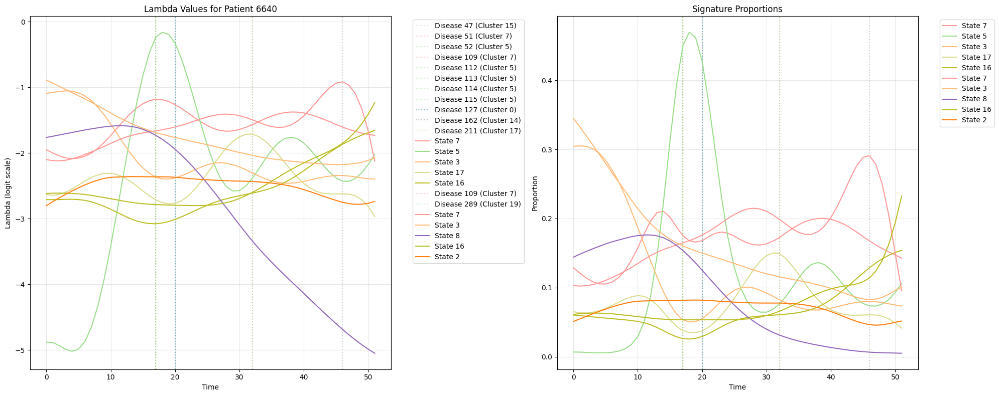

In [67]:
n_samples = 2
sample_patients = [4376, 6640]
n_top_states = 5

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
time_points = np.arange(model.T)

# Get dominant states for these patients
lambda_patients = model.lambda_[sample_patients]
patient_props = torch.softmax(lambda_patients, dim=1)
mean_props = patient_props.mean(dim=-1)
top_states = mean_props.topk(n_top_states, dim=-1).indices

# Color map for states
colors = plt.cm.tab20(np.linspace(0, 1, model.K))

# Plot for each patient
for i, patient in enumerate(sample_patients):
    # Get diagnosis times and associated clusters
    diagnoses = model.Y[patient]  # Shape: [D, T]
    for d in range(model.D):
        diag_times = torch.where(diagnoses[d])[0]
        if len(diag_times) > 0:
            diag_time = diag_times[0].item()
            # Get cluster assignment for this disease
            cluster = model.clusters[d]
            # Use cluster's color for the vertical line
            ax1.axvline(x=diag_time, color=colors[cluster], alpha=0.5, linestyle=':', 
                       label=f'Disease {d} (Cluster {cluster})')
            ax2.axvline(x=diag_time, color=colors[cluster], alpha=0.5, linestyle=':')
            
    # Plot lambda trajectories
    for j, k in enumerate(top_states[i]):
        k = k.item()
        color = colors[k]
        
        # Plot lambda values
        ax1.plot(time_points, model.lambda_[patient, k].detach(), '-', color=color,
                label=f'State {k}')
        
        # Plot proportions
        patient_props = torch.softmax(model.lambda_[patient].detach(), dim=0)[k]
        ax2.plot(time_points, patient_props, '-', color=color,
                label=f'State {k}')

# Customize plots
ax1.set_title(f'Lambda Values for Patient {patient}')
ax1.set_xlabel('Time')
ax1.set_ylabel('Lambda (logit scale)')
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

ax2.set_title('Signature Proportions')
ax2.set_xlabel('Time')
ax2.set_ylabel('Proportion')
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [14]:
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
pandas2ri.activate()

# Load the RDS file
readRDS = robjects.r['readRDS']
pce_data = readRDS('/Users/sarahurbut/Dropbox/pce_df_prevent.rds')
pce_df = pandas2ri.rpy2py(pce_data)  # Convert to pandas DataFrame


In [15]:
from sklearn.metrics import roc_auc_score, roc_curve
import numpy as np
import matplotlib.pyplot as plt

def plot_roc_curve(y_true, y_pred, label):
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    plt.plot(fpr, tpr, label=label)

In [16]:
Y.shape

NameError: name 'Y' is not defined

# Now plot using just the time point (ie not accumulated)


ROC AUC Comparison (10-year prediction from enrollment):
Our model: 0.791
PCE: 0.678


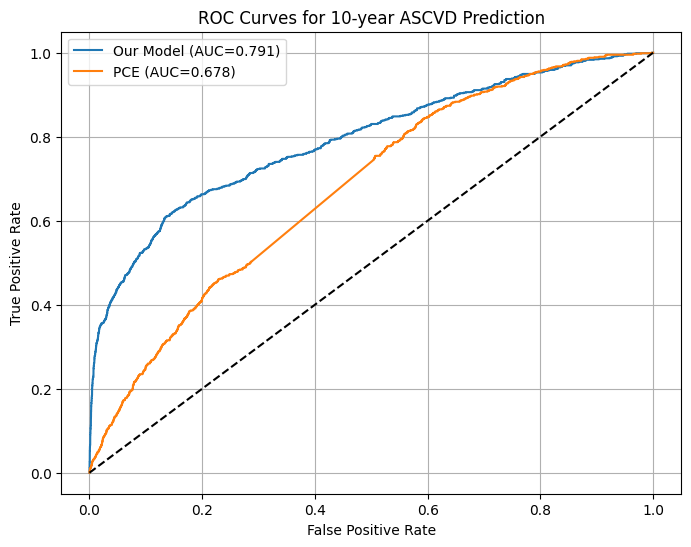

In [152]:
def compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116]):
    """
    Compare 10-year predictions using single timepoint prediction
    """
    our_10yr_risks = []
    actual_10yr = []

    # Get predictions
    pi = model.forward()[0].detach().numpy()
    
    # Get mean risks across patients for calibration
    predicted_risk_2d = pi.mean(axis=0)  # Shape: [D, T]
    observed_risk_2d = model.Y.numpy().mean(axis=0)  # Shape: [D, T]
    
    # Sort and get LOESS calibration curve
    pred_flat = predicted_risk_2d.flatten()
    obs_flat = observed_risk_2d.flatten()
    sort_idx = np.argsort(pred_flat)
    smoothed = lowess(obs_flat[sort_idx], pred_flat[sort_idx], frac=0.3)
    
    # Apply calibration to all predictions using interpolation
    pi_calibrated = np.interp(pi.flatten(), smoothed[:, 0], smoothed[:, 1]).reshape(pi.shape)
    
    # Calculate 10-year risks using only enrollment time prediction
    for patient_idx, row in enumerate(pce_df.itertuples()):
        enroll_time = int(row.age - 30)
        if enroll_time + 10 >= model.T:
            continue
            
        # Only use predictions at enrollment time
        pi_ascvd = pi_calibrated[patient_idx, ascvd_indices, enroll_time]
        
        # Calculate 1-year risk first
        yearly_risk = 1 - np.prod(1 - pi_ascvd)
        
        # Convert to 10-year risk
        risk = 1 - (1 - yearly_risk)**10
        our_10yr_risks.append(risk)
        
        # Still look at actual events over 10 years
        Y_ascvd = model.Y[patient_idx, ascvd_indices, enroll_time:enroll_time+10]
        actual = torch.any(torch.any(Y_ascvd, dim=0))
        actual_10yr.append(actual.item())
   
    # Rest of the function remains the same
    our_10yr_risks = np.array(our_10yr_risks)
    actual_10yr = np.array(actual_10yr)
    pce_risks = pce_df['pce_goff_fuull'].values[:len(our_10yr_risks)]
    
    # Calculate ROC AUCs
    our_auc = roc_auc_score(actual_10yr, our_10yr_risks)
    pce_auc = roc_auc_score(actual_10yr, pce_risks)
    
    print(f"\nROC AUC Comparison (10-year prediction from enrollment):")
    print(f"Our model: {our_auc:.3f}")
    print(f"PCE: {pce_auc:.3f}")
    
    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr, our_10yr_risks, label=f'Our Model (AUC={our_auc:.3f})')
    plot_roc_curve(actual_10yr, pce_risks, label=f'PCE (AUC={pce_auc:.3f})')
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves for 10-year ASCVD Prediction')
    plt.legend()
    plt.grid(True)
    plt.show()

compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116])

# omit missing

In [153]:
def compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116]):
    """
    Compare 10-year predictions using single timepoint prediction, handling missing PCE values
    """
    our_10yr_risks = []
    actual_10yr = []

    # Get predictions
    pi = model.forward()[0].detach().numpy()
    
    # Get mean risks across patients for calibration
    predicted_risk_2d = pi.mean(axis=0)  # Shape: [D, T]
    observed_risk_2d = model.Y.numpy().mean(axis=0)  # Shape: [D, T]
    
    # Sort and get LOESS calibration curve
    pred_flat = predicted_risk_2d.flatten()
    obs_flat = observed_risk_2d.flatten()
    sort_idx = np.argsort(pred_flat)
    smoothed = lowess(obs_flat[sort_idx], pred_flat[sort_idx], frac=0.3)
    
    # Apply calibration to all predictions using interpolation
    pi_calibrated = np.interp(pi.flatten(), smoothed[:, 0], smoothed[:, 1]).reshape(pi.shape)
    
    # Calculate 10-year risks using only enrollment time prediction
    for patient_idx, row in enumerate(pce_df.itertuples()):
        enroll_time = int(row.age - 30)
        if enroll_time + 10 >= model.T:
            continue
            
        # Only use predictions at enrollment time
        pi_ascvd = pi_calibrated[patient_idx, ascvd_indices, enroll_time]
        
        # Calculate 1-year risk first
        yearly_risk = 1 - np.prod(1 - pi_ascvd)
        
        # Convert to 10-year risk
        risk = 1 - (1 - yearly_risk)**10
        our_10yr_risks.append(risk)
        
        # Still look at actual events over 10 years
        Y_ascvd = model.Y[patient_idx, ascvd_indices, enroll_time:enroll_time+10]
        actual = torch.any(torch.any(Y_ascvd, dim=0))
        actual_10yr.append(actual.item())
   
    our_10yr_risks = np.array(our_10yr_risks)
    actual_10yr = np.array(actual_10yr)
    pce_risks = pce_df['pce_goff'].values[:len(our_10yr_risks)]

    # Get indices of non-missing PCE values
    non_missing_idx = ~np.isnan(pce_risks)

    # Filter all arrays to only include non-missing cases
    our_10yr_risks_filtered = our_10yr_risks[non_missing_idx]
    actual_10yr_filtered = actual_10yr[non_missing_idx]
    pce_risks_filtered = pce_risks[non_missing_idx]

    # Calculate ROC AUCs on filtered data
    our_auc = roc_auc_score(actual_10yr_filtered, our_10yr_risks_filtered)
    pce_auc = roc_auc_score(actual_10yr_filtered, pce_risks_filtered)

    # Print results with sample size info
    n_total = len(our_10yr_risks)
    n_complete = len(our_10yr_risks_filtered)
    print(f"\nROC AUC Comparison (10-year prediction from enrollment):")
    print(f"Sample size: {n_complete}/{n_total} ({n_complete/n_total*100:.1f}% complete cases)")
    print(f"Our model: {our_auc:.3f}")
    print(f"PCE: {pce_auc:.3f}")
    
    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr_filtered, our_10yr_risks_filtered, label=f'Our Model (AUC={our_auc:.3f})')
    plot_roc_curve(actual_10yr_filtered, pce_risks_filtered, label=f'PCE (AUC={pce_auc:.3f})')
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves for 10-year ASCVD Prediction')
    plt.legend()
    plt.grid(True)
    plt.show()

    return our_10yr_risks_filtered, actual_10yr_filtered, pce_risks_filtered


ROC AUC Comparison (10-year prediction from enrollment):
Sample size: 7817/10000 (78.2% complete cases)
Our model: 0.797
PCE: 0.711


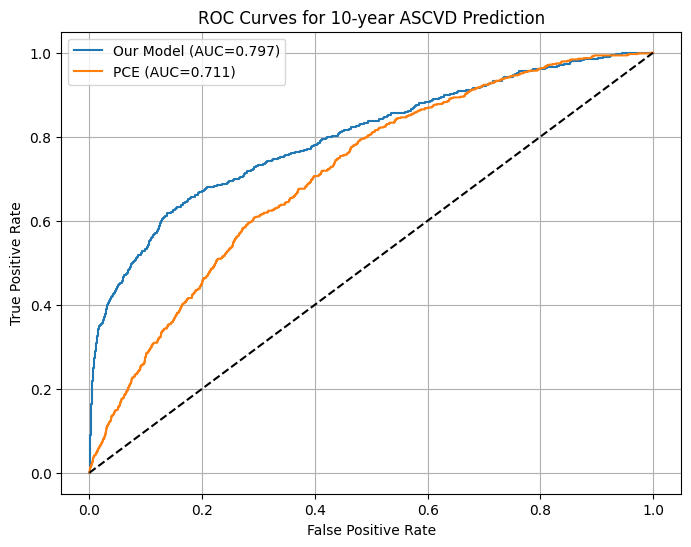

(array([0.15994827, 0.00680454, 0.13584605, ..., 0.21100293, 0.07434523,
        0.0182545 ]),
 array([False, False, False, ...,  True, False, False]),
 array([0.20861924, 0.12870708, 0.12895867, ..., 0.13201657, 0.11094535,
        0.0075447 ]))

In [154]:
compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116])

In [17]:
pce_df.head()

,id,age,race,Sex,SmokingStatusv2,tchol,hdl,SBP,antihtnbase,dm2_prev,dm1_prev,pce_goff,pce_goff_fuull,pce,prevent_base_ascvd_risk,prevent_impute
1,1000015,69,white,Male,Previous,160.440834,38.592420,146,0,0,0,0.208619,0.208619,0.236008,0.088804,0.088804
2,1000023,44,white,Male,Current,238.631089,35.460170,145,0,0,0,0.128707,0.128707,0.133392,0.031418,0.031418
3,1000037,69,white,Female,Previous,265.003865,54.988399,152,0,0,0,0.128959,0.128959,0.126497,0.073537,0.073537
4,1000042,66,white,Male,Never,187.277648,47.911833,130,0,0,0,0.137629,0.137629,0.132626,0.062329,0.062329
5,1000059,54,white,Female,Previous,203.750965,48.221191,152,0,0,0,0.029323,0.029323,0.029881,0.032188,0.032188


In [19]:
pce_df_2 = pd.read_csv('/Users/sarahurbut/Dropbox/all_pce_prevent_ukb_dat_ordered.csv')
pce_df_2.head()

,identifier,sex,birth_year,enrollment,PC1,PC2,PC3,PC4,PC5,PC6,...,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,pce,prevent_base_ascvd_risk
0,1000015,1,1938,2008-07-23,-12.02340,3.25100,1.224590,4.776840,2.31802,2.445040,...,0.161407,-2.293140,1.08346,-0.717937,-0.627368,-0.082943,3.601450,4.934770,0.236008,0.088804
1,1000023,1,1963,2008-09-11,-14.07040,2.83809,-1.709870,-0.782455,-7.93571,-2.176480,...,-1.566490,0.139009,1.01087,2.152510,-0.819635,3.028260,2.686200,-0.237987,0.133392,0.031418
2,1000037,0,1939,2009-01-22,-15.00630,4.03881,-1.711670,6.200160,-2.77040,0.809991,...,1.865970,4.176570,2.07576,-0.896987,1.993830,2.332760,-5.014460,3.937040,0.126497,0.073537
3,1000042,1,1942,2009-11-13,-12.08720,6.29019,-1.486040,-3.426860,-5.35913,-0.146506,...,-0.624147,-1.642880,-3.59239,-5.715930,5.212110,-0.692624,3.301050,-2.631200,0.132626,0.062329
4,1000059,0,1954,2009-05-20,-9.58886,3.77243,0.274298,-1.357730,1.91795,-1.627780,...,0.062332,-3.160660,-1.96172,2.282220,0.892687,-0.234448,-0.609894,-0.555967,0.029881,0.032188



Loading batch 1 model...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/595436477.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


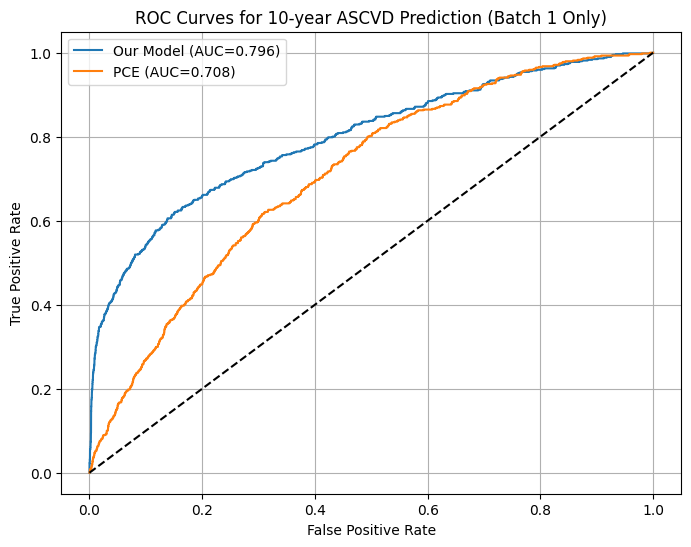

In [20]:
def validate_batch1_only(pce_df, ascvd_indices=[111,112,113,114,115,116]):
    """
    Validate using only batch 1's model and data to ensure we get similar results to before
    """
    # Load batch 1 model
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print("\nLoading batch 1 model...")
    
    try:
        model = torch.load(model_path)
        model_dict = model['model_state_dict']
        
        # Get phi and lambda from batch 1
        phi_raw = model_dict['phi']
        phi = torch.sigmoid(phi_raw).detach().numpy()
        lambda_values = model_dict['lambda_']
        theta = torch.softmax(lambda_values, dim=1).detach().numpy()
        Y_batch = model['Y'].numpy()
        
        # Calculate pi for batch 1
        pi_batch = np.einsum('nkt,kdt->ndt', theta, phi)
        
        our_10yr_risks = []
        actual_10yr = []
        patient_indices = []
        
        # Process only first 10k patients
        batch_df = pce_df.iloc[:10000]
        
        for i, row in enumerate(batch_df.itertuples()):
            if np.isnan(row.pce):
                continue
                
            enroll_time = int(row.age - 30) if hasattr(row, 'age') else 0
            if enroll_time + 10 >= Y_batch.shape[2]:
                continue
                
            pi_ascvd = pi_batch[i, ascvd_indices, enroll_time]
            yearly_risk = 1 - np.prod(1 - pi_ascvd)
            risk = 1 - (1 - yearly_risk)**10
            our_10yr_risks.append(risk)
            
            Y_ascvd = Y_batch[i, ascvd_indices, enroll_time:enroll_time+10]
            actual = np.any(Y_ascvd)
            actual_10yr.append(actual)
            patient_indices.append(i)
            
        our_10yr_risks = np.array(our_10yr_risks)
        actual_10yr = np.array(actual_10yr)
        pce_risks = pce_df.iloc[patient_indices]['pce'].values
        
        # Calculate and plot ROC curves
        our_auc = roc_auc_score(actual_10yr, our_10yr_risks)
        pce_auc = roc_auc_score(actual_10yr, pce_risks)

        plt.figure(figsize=(8,6))
        plot_roc_curve(actual_10yr, our_10yr_risks, label=f'Our Model (AUC={our_auc:.3f})')
        plot_roc_curve(actual_10yr, pce_risks, label=f'PCE (AUC={pce_auc:.3f})')
        plt.plot([0,1], [0,1], 'k--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curves for 10-year ASCVD Prediction (Batch 1 Only)')
        plt.legend()
        plt.grid(True)
        plt.show()

        return our_10yr_risks, actual_10yr, pce_risks
        
    except FileNotFoundError:
        print("ERROR: Could not find batch 1 model file!")
        return None, None, None

# Usage:
our_risks, actual_outcomes, pce_risks = validate_batch1_only(pce_df)

In [50]:
import pandas as pd
pce_df = pd.read_csv('/Users/sarahurbut/Dropbox/all_pce_prevent_ukb_dat_ordered.csv')
pce_df = pd.read_csv('/Users/sarahurbut/Dropbox/pce_fgoff_prevent_full400.csv')

%load_ext autoreload
%autoreload 2



%autoreload 2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from scipy.spatial.distance import pdist, squareform
from scipy.special import expit
from scipy.stats import multivariate_normal
import matplotlib.pyplot as plt
from sklearn.cluster import SpectralClustering  # Add this import

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [26]:
readRDS = robjects.r['readRDS']
pce_data = readRDS('/Users/sarahurbut/Dropbox/pce_df_prevent.rds')
pce_df = pandas2ri.rpy2py(pce_data)  # Convert to pandas DataFrame


In [51]:
pce_df.head()

,Unnamed: 0,identifier,sex,birth_year,enrollment,PC1,PC2,PC3,PC4,PC5,...,PC16,PC17,PC18,PC19,PC20,pce,prevent_base_ascvd_risk,age,p.age,p.pce_goff
0,1,1000015,1,1938,2008-07-23,-12.02340,3.25100,1.224590,4.776840,2.31802,...,-0.717937,-0.627368,-0.082943,3.601450,4.934770,0.236008,0.088804,69,69,0.208619
1,2,1000023,1,1963,2008-09-11,-14.07040,2.83809,-1.709870,-0.782455,-7.93571,...,2.152510,-0.819635,3.028260,2.686200,-0.237987,0.133392,0.031418,44,44,0.128707
2,3,1000037,0,1939,2009-01-22,-15.00630,4.03881,-1.711670,6.200160,-2.77040,...,-0.896987,1.993830,2.332760,-5.014460,3.937040,0.126497,0.073537,69,69,0.128959
3,4,1000042,1,1942,2009-11-13,-12.08720,6.29019,-1.486040,-3.426860,-5.35913,...,-5.715930,5.212110,-0.692624,3.301050,-2.631200,0.132626,0.062329,66,66,0.137629
4,5,1000059,0,1954,2009-05-20,-9.58886,3.77243,0.274298,-1.357730,1.91795,...,2.282220,0.892687,-0.234448,-0.609894,-0.555967,0.029881,0.032188,54,54,0.029323



Loading batch 1 model...

Age at enrollment range: [40, 72]
Number of events: 591/7448 (7.9%)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/2688768433.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


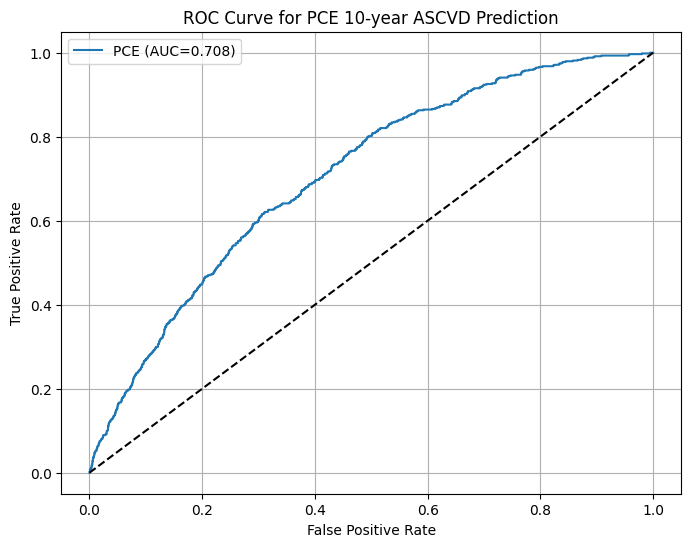

In [54]:
def validate_pce_with_enrollment(pce_df, ascvd_indices=[111,112,113,114,115,116]):
    """
    Validate using proper enrollment times calculated from birth_year and enrollment date
    """
    # Calculate age at enrollment
    pce_df['enrollment_year'] = pd.to_datetime(pce_df['enrollment']).dt.year
    pce_df['age_at_enrollment'] = pce_df['enrollment_year'] - pce_df['birth_year']
    
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print("\nLoading batch 1 model...")
    
    try:
        model = torch.load(model_path)
        Y_batch = model['Y'].numpy()
        
        actual_10yr = []
        patient_indices = []
        pce_risks = []
        
        # Process first 10k patients
        batch_df = pce_df.iloc[:10000]
        
        for i, row in enumerate(batch_df.itertuples()):
            if np.isnan(row.pce):
                continue
                
            # Calculate proper enrollment time
            #enroll_time = int(row.age_at_enrollment - 30)  # Assuming time starts at age 30
            enroll_time = int(row.age - 30) if hasattr(row, 'age') else 0
            if enroll_time + 10 >= Y_batch.shape[2]:
                continue
                
            Y_ascvd = Y_batch[i, ascvd_indices, enroll_time:enroll_time+10]
            actual = np.any(Y_ascvd)
            actual_10yr.append(actual)
            patient_indices.append(i)
            pce_risks.append(row.pce)
            
        print(f"\nAge at enrollment range: [{batch_df['age_at_enrollment'].min():.0f}, {batch_df['age_at_enrollment'].max():.0f}]")
        print(f"Number of events: {sum(actual_10yr)}/{len(actual_10yr)} ({sum(actual_10yr)/len(actual_10yr)*100:.1f}%)")
        
        actual_10yr = np.array(actual_10yr)
        pce_risks = np.array(pce_risks)
        
        # Calculate and plot ROC curve
        pce_auc = roc_auc_score(actual_10yr, pce_risks)

        plt.figure(figsize=(8,6))
        plot_roc_curve(actual_10yr, pce_risks, label=f'PCE (AUC={pce_auc:.3f})')
        plt.plot([0,1], [0,1], 'k--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve for PCE 10-year ASCVD Prediction')
        plt.legend()
        plt.grid(True)
        plt.show()

        return actual_10yr, pce_risks
        
    except FileNotFoundError:
        print("ERROR: Could not find batch 1 model file!")
        return None, None

# Usage:
actual_outcomes, pce_risks = validate_pce_with_enrollment(pce_df)

Starting calculations...
Total patients in pce_df: 400000
Number with valid PCE scores: 299744

Loading batch 1 model for phi values...
Successfully loaded batch 1 phi

Processing batch 2/40 (patients 10000-20000)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/136381959.py:45: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)
/var/folders/fl


Batch summary:
Skipped due to missing PCE: 2491
Skipped due to insufficient horizon: 0
Successfully processed: 7509

Processing batch 3/40 (patients 20000-30000)

Batch summary:
Skipped due to missing PCE: 2440
Skipped due to insufficient horizon: 0
Successfully processed: 15069

Processing batch 4/40 (patients 30000-40000)

Batch summary:
Skipped due to missing PCE: 2549
Skipped due to insufficient horizon: 0
Successfully processed: 22520

Processing batch 5/40 (patients 40000-50000)

Batch summary:
Skipped due to missing PCE: 2594
Skipped due to insufficient horizon: 0
Successfully processed: 29926

Processing batch 6/40 (patients 50000-60000)

Batch summary:
Skipped due to missing PCE: 2513
Skipped due to insufficient horizon: 0
Successfully processed: 37413

Processing batch 7/40 (patients 60000-70000)

Batch summary:
Skipped due to missing PCE: 2606
Skipped due to insufficient horizon: 1
Successfully processed: 44806

Processing batch 8/40 (patients 70000-80000)

Batch summary:
S

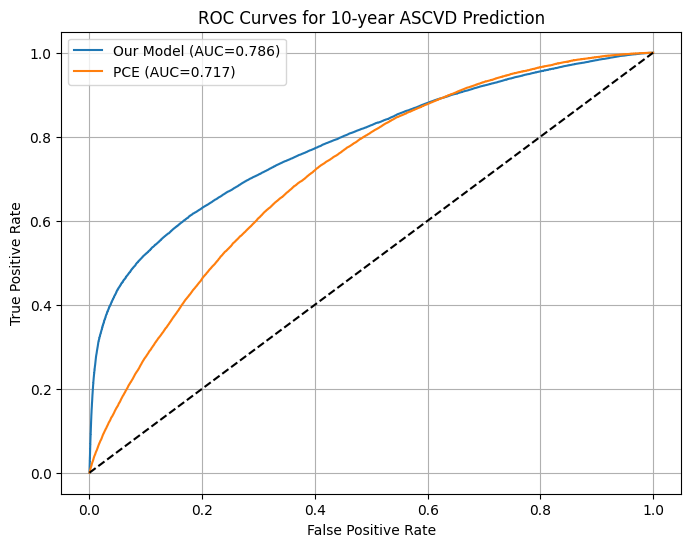

In [55]:
import time
from sklearn.metrics import roc_auc_score, roc_curve
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

def plot_roc_curve(y_true, y_pred, label):
    """
    Plot ROC curve given true labels and predicted probabilities
    
    Parameters:
    -----------
    y_true : array-like
        True binary labels
    y_pred : array-like
        Predicted probabilities
    label : str
        Label for the ROC curve in the plot legend
    """
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    plt.plot(fpr, tpr, label=label)
    

def compare_across_batches_pce(pce_df, ascvd_indices=[111,112,113,114,115,116], batch_size=10000):
    """
    Use batch 1's phi to estimate pis for batches 2-40, comparing with PCE scores
    """
    # Calculate age at enrollment first
    #pce_df['enrollment_year'] = pd.to_datetime(pce_df['enrollment']).dt.year
    #pce_df['age_at_enrollment'] = pce_df['enrollment_year'] - pce_df['birth_year']
    
    our_10yr_risks = []
    actual_10yr = []
    patient_indices = []
    
    print("Starting calculations...")
    print(f"Total patients in pce_df: {len(pce_df)}")
    print(f"Number with valid PCE scores: {sum(~np.isnan(pce_df['pce']))}")
    
    # Load batch 1's phi - this is our "deploy once" model
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    print("\nLoading batch 1 model for phi values...")
    
    try:
        model = torch.load(model_path)
        model_dict = model['model_state_dict']
        phi_raw = model_dict['phi']
        phi = torch.sigmoid(phi_raw).detach().numpy()
        print("Successfully loaded batch 1 phi")
    except FileNotFoundError:
        print("ERROR: Could not find batch 1 model file!")
        return None, None, None
    
    total_patients = len(pce_df)
    n_batches = (total_patients + batch_size - 1) // batch_size
    start_time = time.time()
    
    # Process each batch using batch 1's phi
    for batch in range(1, n_batches):  # Start from batch 2
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, total_patients)
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        print(f"\nProcessing batch {batch+1}/{n_batches} (patients {start_idx}-{end_idx})")
        
        try:
            model = torch.load(model_path)
            model_dict = model['model_state_dict']
            
            # Get lambda values and Y for this batch
            lambda_values = model_dict['lambda_']
            theta = torch.softmax(lambda_values, dim=1).detach().numpy()
            Y_batch = model['Y'].numpy()
            
            # Calculate pi using batch 1's phi (no retraining needed)
            pi_batch = np.einsum('nkt,kdt->ndt', theta, phi)
            
            # Process each patient using their actual enrollment age
            batch_df = pce_df.iloc[start_idx:end_idx]
            skipped_pce = 0
            skipped_horizon = 0
            
            for i, row in enumerate(batch_df.itertuples()):
                if np.isnan(row.pce):
                    skipped_pce += 1
                    continue
                    
                # Use actual enrollment age
                enroll_time = int(row.age - 30)
                if enroll_time + 10 >= Y_batch.shape[2]:
                    skipped_horizon += 1
                    continue
                    
                pi_ascvd = pi_batch[i, ascvd_indices, enroll_time]
                yearly_risk = 1 - np.prod(1 - pi_ascvd)
                risk = 1 - (1 - yearly_risk)**10
                our_10yr_risks.append(risk)
                
                Y_ascvd = Y_batch[i, ascvd_indices, enroll_time:enroll_time+10]
                actual = np.any(Y_ascvd)
                actual_10yr.append(actual)
                patient_indices.append(start_idx + i)
            
            print(f"\nBatch summary:")
            print(f"Skipped due to missing PCE: {skipped_pce}")
            print(f"Skipped due to insufficient horizon: {skipped_horizon}")
            print(f"Successfully processed: {len(our_10yr_risks) - (len(patient_indices) - len(our_10yr_risks))}")
            
            del model_dict, theta, pi_batch, Y_batch
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue

    if len(our_10yr_risks) == 0:
        print("\nERROR: No valid predictions were made!")
        return None, None, None
        
    our_10yr_risks = np.array(our_10yr_risks)
    actual_10yr = np.array(actual_10yr)
    patient_indices = np.array(patient_indices)
    pce_risks = pce_df.iloc[patient_indices]['pce'].values
    
    print("\nFinal Summary:")
    print(f"Total processing time: {(time.time() - start_time)/60:.2f} minutes")
    print(f"Number of predictions made: {len(our_10yr_risks)}")
    print(f"Number of actual events: {sum(actual_10yr)}")
    print(f"Event rate: {sum(actual_10yr)/len(actual_10yr)*100:.2f}%")

    # Calculate and plot ROC curves
    our_auc = roc_auc_score(actual_10yr, our_10yr_risks)
    pce_auc = roc_auc_score(actual_10yr, pce_risks)

    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr, our_10yr_risks, label=f'Our Model (AUC={our_auc:.3f})')
    plot_roc_curve(actual_10yr, pce_risks, label=f'PCE (AUC={pce_auc:.3f})')
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves for 10-year ASCVD Prediction')
    plt.legend()
    plt.grid(True)
    plt.show()

    return our_10yr_risks, actual_10yr, pce_risks

# Usage:
our_risks, actual_outcomes, pce_risks = compare_across_batches_pce(pce_df)

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/3065047595.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)
/var/folders/f

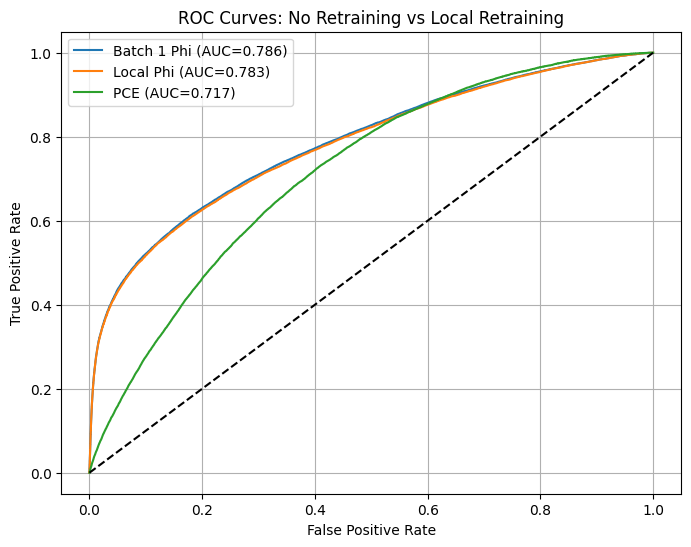


Performance Summary:
Batch 1 Phi (no retraining): AUC = 0.786
Local Phi (with retraining): AUC = 0.783
PCE: AUC = 0.717


In [56]:
def compare_phi_approaches(pce_df, ascvd_indices=[111,112,113,114,115,116], batch_size=10000):
    """
    Compare performance using:
    1. Batch 1's phi (no retraining needed) - ideal for real-world deployment
    2. Each batch's own phi (requires retraining) - for comparison only
    """
    # Calculate age at enrollment
    #pce_df['enrollment_year'] = pd.to_datetime(pce_df['enrollment']).dt.year
    #pce_df['age_at_enrollment'] = pce_df['enrollment_year'] - pce_df['birth_year']
    
    # Initialize storage for both approaches
    batch1_risks = []
    local_risks = []
    actual_10yr = []
    pce_risks_all = []
    patient_indices = []
    
    # Load batch 1's phi - this represents our "deploy once" model
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    model = torch.load(model_path)
    batch1_phi = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
    
    # Process each batch
    total_patients = len(pce_df)
    n_batches = (total_patients + batch_size - 1) // batch_size
    
    for batch in range(1, n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, total_patients)
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        try:
            model = torch.load(model_path)
            model_dict = model['model_state_dict']
            
            # Get this batch's parameters
            local_phi = torch.sigmoid(model_dict['phi']).detach().numpy()
            theta = torch.softmax(model_dict['lambda_'], dim=1).detach().numpy()
            Y_batch = model['Y'].numpy()
            
            # Calculate predictions using both phis
            pi_batch1 = np.einsum('nkt,kdt->ndt', theta, batch1_phi)
            pi_local = np.einsum('nkt,kdt->ndt', theta, local_phi)
            
            batch_df = pce_df.iloc[start_idx:end_idx]
            
            for i, row in enumerate(batch_df.itertuples()):
                if np.isnan(row.pce):
                    continue
                    
                enroll_time = int(row.age - 30)
                if enroll_time + 10 >= Y_batch.shape[2]:
                    continue
                
                # Calculate risks using both approaches
                pi_ascvd_batch1 = pi_batch1[i, ascvd_indices, enroll_time]
                pi_ascvd_local = pi_local[i, ascvd_indices, enroll_time]
                
                yearly_risk_batch1 = 1 - np.prod(1 - pi_ascvd_batch1)
                yearly_risk_local = 1 - np.prod(1 - pi_ascvd_local)
                
                risk_batch1 = 1 - (1 - yearly_risk_batch1)**10
                risk_local = 1 - (1 - yearly_risk_local)**10
                
                batch1_risks.append(risk_batch1)
                local_risks.append(risk_local)
                
                Y_ascvd = Y_batch[i, ascvd_indices, enroll_time:enroll_time+10]
                actual_10yr.append(np.any(Y_ascvd))
                pce_risks_all.append(row.pce)
                patient_indices.append(start_idx + i)
                
            # Clear memory
            del model_dict, theta, pi_batch1, pi_local, Y_batch
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue

    # Convert to arrays
    batch1_risks = np.array(batch1_risks)
    local_risks = np.array(local_risks)
    actual_10yr = np.array(actual_10yr)
    pce_risks_all = np.array(pce_risks_all)
    
    # Calculate AUCs
    batch1_auc = roc_auc_score(actual_10yr, batch1_risks)
    local_auc = roc_auc_score(actual_10yr, local_risks)
    pce_auc = roc_auc_score(actual_10yr, pce_risks_all)
    
    # Plot ROC curves
    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr, batch1_risks, label=f'Batch 1 Phi (AUC={batch1_auc:.3f})')
    plot_roc_curve(actual_10yr, local_risks, label=f'Local Phi (AUC={local_auc:.3f})')
    plot_roc_curve(actual_10yr, pce_risks_all, label=f'PCE (AUC={pce_auc:.3f})')
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves: No Retraining vs Local Retraining')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    print("\nPerformance Summary:")
    print(f"Batch 1 Phi (no retraining): AUC = {batch1_auc:.3f}")
    print(f"Local Phi (with retraining): AUC = {local_auc:.3f}")
    print(f"PCE: AUC = {pce_auc:.3f}")
    
    return batch1_risks, local_risks, actual_10yr, pce_risks_all

# Usage:
batch1_risks, local_risks, actual_outcomes, pce_risks = compare_phi_approaches(pce_df)

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/2210437574.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)
/var/folders/f

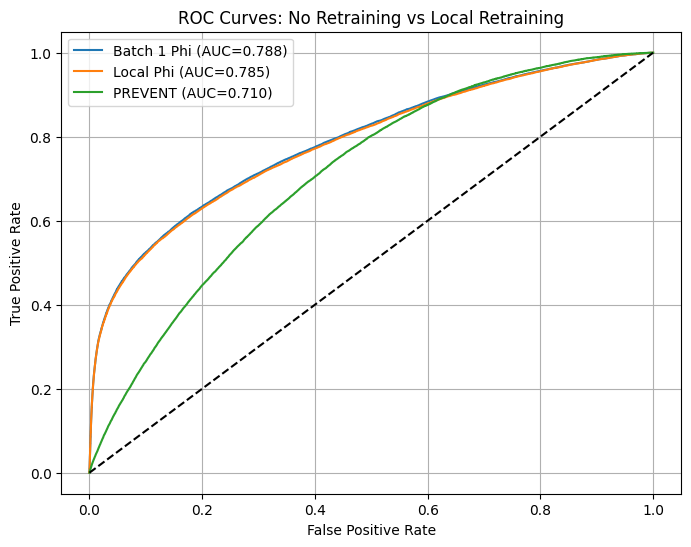


Performance Summary:
Batch 1 Phi (no retraining): AUC = 0.788
Local Phi (with retraining): AUC = 0.785
PREVENT: AUC = 0.710


In [59]:
def compare_phi_approaches(pce_df, ascvd_indices=[111,112,113,114,115,116], batch_size=10000):
    """
    Compare performance using:
    1. Batch 1's phi (no retraining needed) - ideal for real-world deployment
    2. Each batch's own phi (requires retraining) - for comparison only
    """
    # Initialize storage for both approaches
    batch1_risks = []
    local_risks = []
    actual_10yr = []
    prevent_risks_all = []
    patient_indices = []
    
    # Load batch 1's phi - this represents our "deploy once" model
    model_path = '/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
    model = torch.load(model_path)
    batch1_phi = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
    
    # Process each batch
    total_patients = len(pce_df)
    n_batches = (total_patients + batch_size - 1) // batch_size
    
    for batch in range(1, n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, total_patients)
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        try:
            model = torch.load(model_path)
            model_dict = model['model_state_dict']
            
            # Get this batch's parameters
            local_phi = torch.sigmoid(model_dict['phi']).detach().numpy()
            theta = torch.softmax(model_dict['lambda_'], dim=1).detach().numpy()
            Y_batch = model['Y'].numpy()
            
            # Calculate predictions using both phis
            pi_batch1 = np.einsum('nkt,kdt->ndt', theta, batch1_phi)
            pi_local = np.einsum('nkt,kdt->ndt', theta, local_phi)
            
            batch_df = pce_df.iloc[start_idx:end_idx]
            
            for i, row in enumerate(batch_df.itertuples()):
                if np.isnan(row.prevent_base_ascvd_risk):  # Changed from pce
                    continue
                    
                enroll_time = int(row.age - 30)
                if enroll_time + 10 >= Y_batch.shape[2]:
                    continue
                
                # Calculate risks using both approaches
                pi_ascvd_batch1 = pi_batch1[i, ascvd_indices, enroll_time]
                pi_ascvd_local = pi_local[i, ascvd_indices, enroll_time]
                
                yearly_risk_batch1 = 1 - np.prod(1 - pi_ascvd_batch1)
                yearly_risk_local = 1 - np.prod(1 - pi_ascvd_local)
                
                risk_batch1 = 1 - (1 - yearly_risk_batch1)**10
                risk_local = 1 - (1 - yearly_risk_local)**10
                
                batch1_risks.append(risk_batch1)
                local_risks.append(risk_local)
                
                Y_ascvd = Y_batch[i, ascvd_indices, enroll_time:enroll_time+10]
                actual_10yr.append(np.any(Y_ascvd))
                prevent_risks_all.append(row.prevent_base_ascvd_risk)  # Changed from pce
                patient_indices.append(start_idx + i)
                
            # Clear memory
            del model_dict, theta, pi_batch1, pi_local, Y_batch
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue

    # Convert to arrays
    batch1_risks = np.array(batch1_risks)
    local_risks = np.array(local_risks)
    actual_10yr = np.array(actual_10yr)
    prevent_risks_all = np.array(prevent_risks_all)
    
    # Calculate AUCs
    batch1_auc = roc_auc_score(actual_10yr, batch1_risks)
    local_auc = roc_auc_score(actual_10yr, local_risks)
    prevent_auc = roc_auc_score(actual_10yr, prevent_risks_all)
    
    # Plot ROC curves
    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr, batch1_risks, label=f'Batch 1 Phi (AUC={batch1_auc:.3f})')
    plot_roc_curve(actual_10yr, local_risks, label=f'Local Phi (AUC={local_auc:.3f})')
    plot_roc_curve(actual_10yr, prevent_risks_all, label=f'PREVENT (AUC={prevent_auc:.3f})')
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves: No Retraining vs Local Retraining')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    print("\nPerformance Summary:")
    print(f"Batch 1 Phi (no retraining): AUC = {batch1_auc:.3f}")
    print(f"Local Phi (with retraining): AUC = {local_auc:.3f}")
    print(f"PREVENT: AUC = {prevent_auc:.3f}")
    
    return batch1_risks, local_risks, actual_10yr, prevent_risks_all

# Usage:
batch1_risks, local_risks, actual_outcomes, prevent_risks = compare_phi_approaches(pce_df)

In [60]:
def compare_with_avg_phi(pce_df, ascvd_indices=[111,112,113,114,115,116], batch_size=10000):
    """
    Compare performance using:
    1. Average phi from other batches (leave-one-out)
    2. Local phi (requires retraining)
    """
    # First collect all phis
    all_phis = []
    n_batches = (len(pce_df) + batch_size - 1) // batch_size
    
    print("Loading all phi values first...")
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            model = torch.load(model_path)
            model_dict = model['model_state_dict']
            phi_raw = model_dict['phi']
            phi = torch.sigmoid(phi_raw).detach().numpy()
            all_phis.append(phi)
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            
    avg_phi_risks = []
    local_risks = []
    actual_10yr = []
    prevent_risks_all = []
    patient_indices = []
    
    # Now process each batch using leave-one-out average phi
    for batch in range(1, n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        try:
            model = torch.load(model_path)
            model_dict = model['model_state_dict']
            
            # Get this batch's parameters
            local_phi = torch.sigmoid(model_dict['phi']).detach().numpy()
            theta = torch.softmax(model_dict['lambda_'], dim=1).detach().numpy()
            Y_batch = model['Y'].numpy()
            
            # Calculate average phi excluding current batch
            other_phis = [phi for i, phi in enumerate(all_phis) if i != batch]
            avg_phi = np.mean(other_phis, axis=0)
            
            # Calculate predictions using both phis
            pi_avg = np.einsum('nkt,kdt->ndt', theta, avg_phi)
            pi_local = np.einsum('nkt,kdt->ndt', theta, local_phi)
            
            batch_df = pce_df.iloc[start_idx:end_idx]
            
            for i, row in enumerate(batch_df.itertuples()):
                if np.isnan(row.prevent_base_ascvd_risk):
                    continue
                    
                enroll_time = int(row.age - 30)
                if enroll_time + 10 >= Y_batch.shape[2]:
                    continue
                
                # Calculate risks using both approaches
                pi_ascvd_avg = pi_avg[i, ascvd_indices, enroll_time]
                pi_ascvd_local = pi_local[i, ascvd_indices, enroll_time]
                
                yearly_risk_avg = 1 - np.prod(1 - pi_ascvd_avg)
                yearly_risk_local = 1 - np.prod(1 - pi_ascvd_local)
                
                risk_avg = 1 - (1 - yearly_risk_avg)**10
                risk_local = 1 - (1 - yearly_risk_local)**10
                
                avg_phi_risks.append(risk_avg)
                local_risks.append(risk_local)
                
                Y_ascvd = Y_batch[i, ascvd_indices, enroll_time:enroll_time+10]
                actual_10yr.append(np.any(Y_ascvd))
                prevent_risks_all.append(row.prevent_base_ascvd_risk)
                patient_indices.append(start_idx + i)
                
            del model_dict, theta, pi_avg, pi_local, Y_batch
            
        except FileNotFoundError:
            continue

    # Convert to arrays and calculate AUCs
    avg_phi_risks = np.array(avg_phi_risks)
    local_risks = np.array(local_risks)
    actual_10yr = np.array(actual_10yr)
    prevent_risks_all = np.array(prevent_risks_all)
    
    # Plot and return results as before, but with avg_phi_risks instead of batch1_risks
    batch1_auc = roc_auc_score(actual_10yr, avg_phi_risks)
    local_auc = roc_auc_score(actual_10yr, local_risks)
    prevent_auc = roc_auc_score(actual_10yr, prevent_risks_all)
    
    # Plot ROC curves
    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr, avg_phi_risks, label=f'Avg Phi (AUC={batch1_auc:.3f})')
    plot_roc_curve(actual_10yr, local_risks, label=f'Local Phi (AUC={local_auc:.3f})')
    plot_roc_curve(actual_10yr, prevent_risks_all, label=f'PREVENT (AUC={prevent_auc:.3f})')
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves: No Retraining vs Local Retraining')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    print("\nPerformance Summary:")
    print(f"Batch 1 Phi (no retraining): AUC = {batch1_auc:.3f}")
    print(f"Local Phi (with retraining): AUC = {local_auc:.3f}")
    print(f"PREVENT: AUC = {prevent_auc:.3f}")
    
    


    return avg_phi_risks, local_risks, actual_10yr, prevent_risks_all

Loading all phi values first...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/2422985352.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)
/var/folders/f

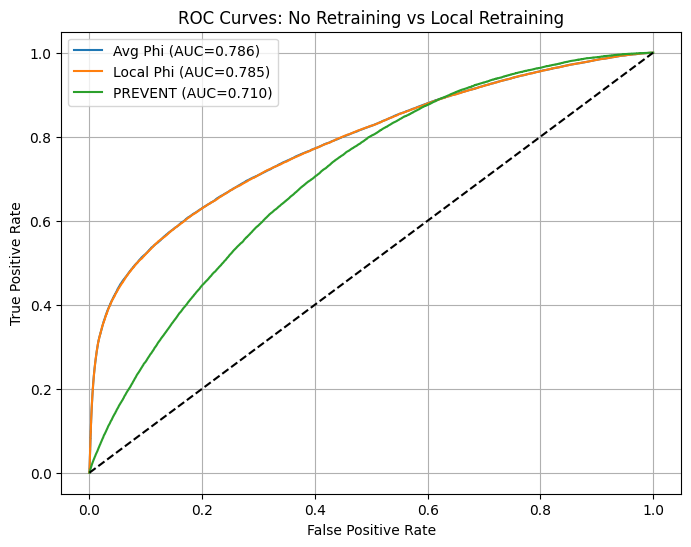


Performance Summary:
Batch 1 Phi (no retraining): AUC = 0.786
Local Phi (with retraining): AUC = 0.785
PREVENT: AUC = 0.710


(array([0.02917486, 0.03580487, 0.00889301, ..., 0.00186467, 0.03479958,
        0.03384829], dtype=float32),
 array([0.02871799, 0.03516269, 0.0085417 , ..., 0.00187182, 0.03449643,
        0.03424406], dtype=float32),
 array([False, False, False, ..., False, False, False]),
 array([0.03578052, 0.02533891, 0.02795094, ..., 0.01699106, 0.06041392,
        0.01704062]))

In [61]:
compare_with_avg_phi(pce_df, ascvd_indices=[111,112,113,114,115,116], batch_size=10000)

In [62]:
def compare_with_avg_phi(pce_df, ascvd_indices=[111,112,113,114,115,116], batch_size=10000):
    # ... [earlier code stays the same until the data collection part] ...
    
    all_phis = []
    n_batches = (len(pce_df) + batch_size - 1) // batch_size
    
    print("Loading all phi values first...")
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            model = torch.load(model_path)
            model_dict = model['model_state_dict']
            phi_raw = model_dict['phi']
            phi = torch.sigmoid(phi_raw).detach().numpy()
            all_phis.append(phi)
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            
    avg_phi_risks = []
    local_risks = []
    actual_10yr = []
    prevent_risks_all = []
    pce_risks_all = []  # Added PCE
    patient_indices = []
    
    batch_df = pce_df.iloc[start_idx:end_idx]
    # Now process each batch using leave-one-out average phi
    for batch in range(1, n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        try:
            model = torch.load(model_path)
            model_dict = model['model_state_dict']
            
            # Get this batch's parameters
            local_phi = torch.sigmoid(model_dict['phi']).detach().numpy()
            theta = torch.softmax(model_dict['lambda_'], dim=1).detach().numpy()
            Y_batch = model['Y'].numpy()
            
            # Calculate average phi excluding current batch
            other_phis = [phi for i, phi in enumerate(all_phis) if i != batch]
            avg_phi = np.mean(other_phis, axis=0)
            
            # Calculate predictions using both phis
            pi_avg = np.einsum('nkt,kdt->ndt', theta, avg_phi)
            pi_local = np.einsum('nkt,kdt->ndt', theta, local_phi)

    
            for i, row in enumerate(batch_df.itertuples()):
                # Check for either score being missing
                if np.isnan(row.prevent_base_ascvd_risk) or np.isnan(row.pce):
                    continue
                    
                
                enroll_time = int(row.age - 30)
                if enroll_time + 10 >= Y_batch.shape[2]:
                    continue
                
                # Calculate risks using both approaches
                pi_ascvd_avg = pi_avg[i, ascvd_indices, enroll_time]
                pi_ascvd_local = pi_local[i, ascvd_indices, enroll_time]
                
                yearly_risk_avg = 1 - np.prod(1 - pi_ascvd_avg)
                yearly_risk_local = 1 - np.prod(1 - pi_ascvd_local)
                
                risk_avg = 1 - (1 - yearly_risk_avg)**10
                risk_local = 1 - (1 - yearly_risk_local)**10
                
                avg_phi_risks.append(risk_avg)
                local_risks.append(risk_local)
                
                Y_ascvd = Y_batch[i, ascvd_indices, enroll_time:enroll_time+10]
                actual_10yr.append(np.any(Y_ascvd))
                prevent_risks_all.append(row.prevent_base_ascvd_risk)
                pce_risks_all.append(row.pce)  # Added PCE
                patient_indices.append(start_idx + i)
                
    # Convert to arrays
    avg_phi_risks = np.array(avg_phi_risks)
    local_risks = np.array(local_risks)
    actual_10yr = np.array(actual_10yr)
    prevent_risks_all = np.array(prevent_risks_all)
    pce_risks_all = np.array(pce_risks_all)  # Added PCE
    
    # Calculate AUCs
    avg_auc = roc_auc_score(actual_10yr, avg_phi_risks)
    local_auc = roc_auc_score(actual_10yr, local_risks)
    prevent_auc = roc_auc_score(actual_10yr, prevent_risks_all)
    pce_auc = roc_auc_score(actual_10yr, pce_risks_all)  # Added PCE
    
    # Plot ROC curves
    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr, avg_phi_risks, label=f'Avg Phi (AUC={avg_auc:.3f})')
    plot_roc_curve(actual_10yr, local_risks, label=f'Local Phi (AUC={local_auc:.3f})')
    plot_roc_curve(actual_10yr, prevent_risks_all, label=f'PREVENT (AUC={prevent_auc:.3f})')
    plot_roc_curve(actual_10yr, pce_risks_all, label=f'PCE (AUC={pce_auc:.3f})')  # Added PCE
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves: No Retraining vs Local Retraining')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    print("\nPerformance Summary:")
    print(f"Avg Phi (no retraining): AUC = {avg_auc:.3f}")
    print(f"Local Phi (with retraining): AUC = {local_auc:.3f}")
    print(f"PREVENT: AUC = {prevent_auc:.3f}")
    print(f"PCE: AUC = {pce_auc:.3f}")  # Added PCE
    
    return avg_phi_risks, local_risks, actual_10yr, prevent_risks_all, pce_risks_all  # Added PCE

# Usage:
avg_risks, local_risks, actual_outcomes, prevent_risks, pce_risks = compare_with_avg_phi(pce_df)

IndentationError: unexpected unindent (2782864114.py, line 84)

Loading all phi values...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/2399212042.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)
/var/folders/f

Avg Phi: AUC = 0.786
Local Phi: AUC = 0.785
PREVENT: AUC = 0.710
PCE: AUC = 0.718


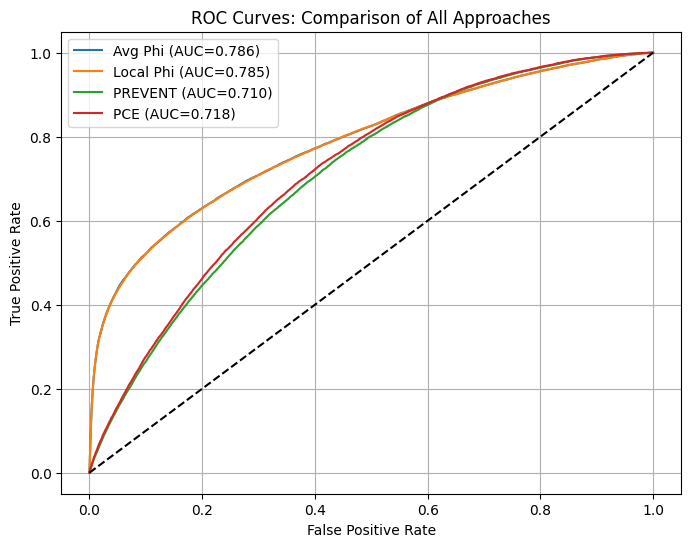

In [63]:
def compare_all_approaches(pce_df, ascvd_indices=[111,112,113,114,115,116], batch_size=10000):
    """
    Compare performance using:
    1. Average phi from other batches (no retraining needed)
    2. Local phi (with retraining)
    3. PREVENT and PCE scores
    """
    # First collect all phis
    all_phis = []
    n_batches = (len(pce_df) + batch_size - 1) // batch_size
    
    print("Loading all phi values...")
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            model = torch.load(model_path)
            phi = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            all_phis.append(phi)
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            
    # Initialize storage
    avg_phi_risks = []
    local_risks = []
    actual_10yr = []
    prevent_risks_all = []
    pce_risks_all = []
    
    # Process each batch
    for batch in range(1, n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        try:
            # Load batch model
            model = torch.load(model_path)
            local_phi = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            theta = torch.softmax(model['model_state_dict']['lambda_'], dim=1).detach().numpy()
            Y_batch = model['Y'].numpy()
            
            # Calculate average phi excluding current batch
            other_phis = [phi for i, phi in enumerate(all_phis) if i != batch]
            avg_phi = np.mean(other_phis, axis=0)
            
            # Calculate predictions
            pi_avg = np.einsum('nkt,kdt->ndt', theta, avg_phi)
            pi_local = np.einsum('nkt,kdt->ndt', theta, local_phi)
            
            # Process each patient
            batch_df = pce_df.iloc[start_idx:end_idx]
            for i, row in enumerate(batch_df.itertuples()):
                if np.isnan(row.prevent_base_ascvd_risk) or np.isnan(row.pce):
                    continue
                    
                enroll_time = int(row.age - 30)
                if enroll_time + 10 >= Y_batch.shape[2]:
                    continue
                
                # Calculate risks using both approaches
                pi_ascvd_avg = pi_avg[i, ascvd_indices, enroll_time]
                pi_ascvd_local = pi_local[i, ascvd_indices, enroll_time]
                
                yearly_risk_avg = 1 - np.prod(1 - pi_ascvd_avg)
                yearly_risk_local = 1 - np.prod(1 - pi_ascvd_local)
                
                avg_phi_risks.append(1 - (1 - yearly_risk_avg)**10)
                local_risks.append(1 - (1 - yearly_risk_local)**10)
                
                Y_ascvd = Y_batch[i, ascvd_indices, enroll_time:enroll_time+10]
                actual_10yr.append(np.any(Y_ascvd))
                prevent_risks_all.append(row.prevent_base_ascvd_risk)
                pce_risks_all.append(row.pce)
            
            del model
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue

    # Convert to arrays
    arrays = map(np.array, [avg_phi_risks, local_risks, actual_10yr, prevent_risks_all, pce_risks_all])
    avg_phi_risks, local_risks, actual_10yr, prevent_risks_all, pce_risks_all = arrays
    
    # Calculate and plot ROC curves
    methods = {
        'Avg Phi': avg_phi_risks,
        'Local Phi': local_risks,
        'PREVENT': prevent_risks_all,
        'PCE': pce_risks_all
    }
    
    plt.figure(figsize=(8,6))
    for name, risks in methods.items():
        auc = roc_auc_score(actual_10yr, risks)
        plot_roc_curve(actual_10yr, risks, label=f'{name} (AUC={auc:.3f})')
        print(f"{name}: AUC = {auc:.3f}")
        
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves: Comparison of All Approaches')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return avg_phi_risks, local_risks, actual_10yr, prevent_risks_all, pce_risks_all

# Usage:
results = compare_all_approaches(pce_df)

Processing batches...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/42352162.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


Processed batch 0: 10000 patients
  Pi range: [0.000000, 0.081121], Mean: 0.000464
  Kappa: 2.972113
Processed batch 1: 10000 patients
  Pi range: [0.000000, 0.098873], Mean: 0.000473
  Kappa: 3.029617
Processed batch 2: 10000 patients
  Pi range: [0.000000, 0.081591], Mean: 0.000465
  Kappa: 2.988028
Processed batch 3: 10000 patients
  Pi range: [0.000000, 0.086621], Mean: 0.000477
  Kappa: 3.082895
Processed batch 4: 10000 patients
  Pi range: [0.000000, 0.087351], Mean: 0.000481
  Kappa: 3.088173
Processed batch 5: 10000 patients
  Pi range: [0.000000, 0.076552], Mean: 0.000472
  Kappa: 3.014319
Processed batch 6: 10000 patients
  Pi range: [0.000000, 0.086700], Mean: 0.000481
  Kappa: 3.073663
Processed batch 7: 10000 patients
  Pi range: [0.000000, 0.082084], Mean: 0.000473
  Kappa: 3.024499
Processed batch 8: 10000 patients
  Pi range: [0.000000, 0.090720], Mean: 0.000472
  Kappa: 3.031744
Processed batch 9: 10000 patients
  Pi range: [0.000000, 0.076893], Mean: 0.000477
  Kappa:

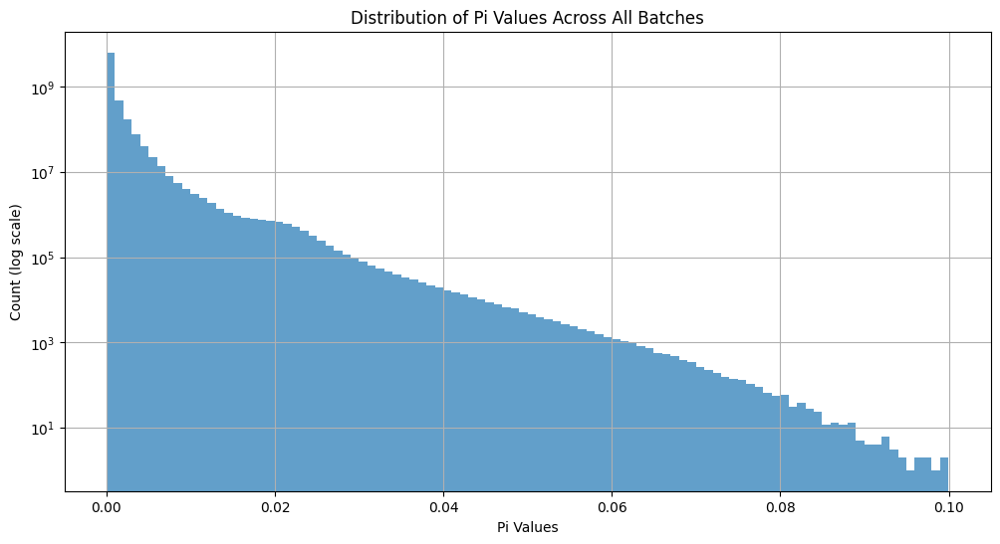

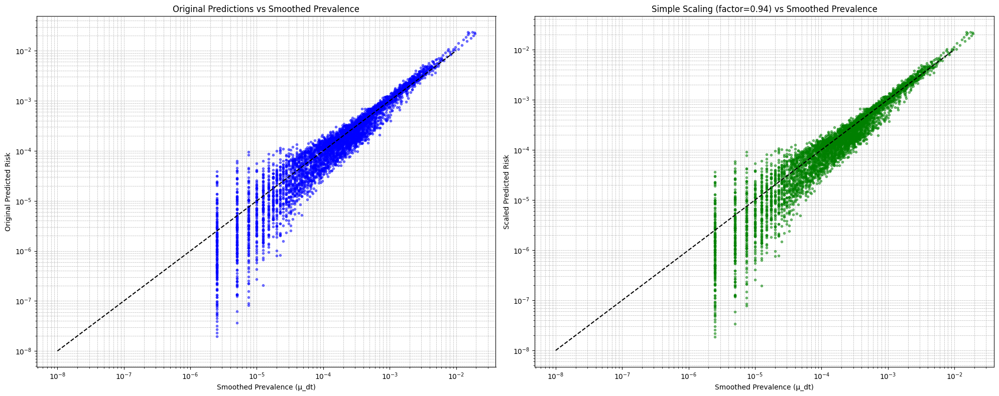

In [70]:
def collect_all_pi_values(pce_df, batch_size=10000, n_diseases=118, n_timepoints=41):
    """
    Collect all pi values from all batches using the per-model approach
    """
    # Initialize arrays to store aggregated data
    sum_pi = np.zeros((n_diseases, n_timepoints))
    sum_Y = np.zeros((n_diseases, n_timepoints))
    count_matrix = np.zeros((n_diseases, n_timepoints))
    
    # For verification
    all_pi_values = []
    all_Y_values = []
    
    print("Processing batches...")
    n_batches = (len(pce_df) + batch_size - 1) // batch_size
    
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            # Load model
            model = torch.load(model_path)
            phi_prob = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            theta = torch.softmax(model['model_state_dict']['lambda_'], dim=1).detach().numpy()
            kappa = model['model_state_dict']['kappa'].item()
            Y_batch = model['Y'].numpy()
            
            # Calculate predictions with kappa
            pi = np.einsum('nkt,kdt->ndt', theta, phi_prob) * kappa
            pi = np.clip(pi, 1e-8, 1-1e-8)
            
            # Store all pi and Y values for verification
            all_pi_values.append(pi.flatten())
            all_Y_values.append(Y_batch.flatten())
            
            # Aggregate pi and Y for each disease and timepoint
            for d in range(n_diseases):
                for t in range(n_timepoints):
                    # Get valid entries (non-NaN) for this disease and timepoint
                    valid_mask = ~np.isnan(pi[:, d, t]) & ~np.isnan(Y_batch[:, d, t])
                    n_valid = np.sum(valid_mask)
                    
                    if n_valid > 0:
                        sum_pi[d, t] += np.sum(pi[valid_mask, d, t])
                        sum_Y[d, t] += np.sum(Y_batch[valid_mask, d, t])
                        count_matrix[d, t] += n_valid
            
            print(f"Processed batch {batch}: {pi.shape[0]} patients")
            print(f"  Pi range: [{pi.min():.6f}, {pi.max():.6f}], Mean: {pi.mean():.6f}")
            print(f"  Kappa: {kappa:.6f}")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue
    
    # Combine all pi values
    all_pi_flat = np.concatenate(all_pi_values)
    all_Y_flat = np.concatenate(all_Y_values)
    
    # Remove NaNs
    valid_mask = ~np.isnan(all_pi_flat) & ~np.isnan(all_Y_flat)
    all_pi_flat = all_pi_flat[valid_mask]
    all_Y_flat = all_Y_flat[valid_mask]
    
    # Calculate average pi and Y
    avg_pi = np.zeros_like(sum_pi)
    avg_Y = np.zeros_like(sum_Y)
    
    # Avoid division by zero
    valid_counts = count_matrix > 0
    avg_pi[valid_counts] = sum_pi[valid_counts] / count_matrix[valid_counts]
    avg_Y[valid_counts] = sum_Y[valid_counts] / count_matrix[valid_counts]
    
    # Calculate overall calibration
    mean_pred = np.mean(all_pi_flat)
    mean_obs = np.mean(all_Y_flat)
    calib_factor = mean_obs / mean_pred
    
    print("\nVerification:")
    print(f"Total pi values: {len(all_pi_flat)}")
    print(f"Range of values: [{all_pi_flat.min():.6f}, {all_pi_flat.max():.6f}]")
    print(f"Mean value: {mean_pred:.6f}")
    print(f"Mean observed: {mean_obs:.6f}")
    print(f"Calibration factor: {calib_factor:.4f}")
    
    # Create histogram of pi values
    plt.figure(figsize=(12, 6))
    plt.hist(all_pi_flat, bins=100, alpha=0.7, log=True)
    plt.xlabel('Pi Values')
    plt.ylabel('Count (log scale)')
    plt.title('Distribution of Pi Values Across All Batches')
    plt.grid(True)
    
    # Create scatter plot of pi vs Y
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    
    # Plot 1: Original predictions vs. prevalence
    ax1.loglog(avg_Y.flatten()[valid_counts.flatten()], 
               avg_pi.flatten()[valid_counts.flatten()], 
               'o', alpha=0.5, markersize=3, color='blue')
    ax1.loglog([1e-8, 1e-2], [1e-8, 1e-2], 'k--')  # Perfect calibration line
    
    ax1.set_xlabel('Smoothed Prevalence (μ_dt)')
    ax1.set_ylabel('Original Predicted Risk')
    ax1.set_title('Original Predictions vs Smoothed Prevalence')
    ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
    
    # Plot 2: Scaled predictions vs. prevalence
    scaled_pi = avg_pi.flatten()[valid_counts.flatten()] * calib_factor
    
    ax2.loglog(avg_Y.flatten()[valid_counts.flatten()], 
               scaled_pi, 
               'o', alpha=0.5, markersize=3, color='green')
    ax2.loglog([1e-8, 1e-2], [1e-8, 1e-2], 'k--')  # Perfect calibration line
    
    ax2.set_xlabel('Smoothed Prevalence (μ_dt)')
    ax2.set_ylabel('Scaled Predicted Risk')
    ax2.set_title(f'Simple Scaling (factor={calib_factor:.2f}) vs Smoothed Prevalence')
    ax2.grid(True, which='both', linestyle='--', linewidth=0.5)
    
    plt.tight_layout()
    
    return all_pi_flat, all_Y_flat, avg_pi, avg_Y, count_matrix, calib_factor

# Usage:
all_pi, all_Y, avg_pi, avg_Y, counts, calib_factor = collect_all_pi_values(pce_df)

Processing batches...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/3740051371.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


Processed batch 0: 10000 patients
Processed batch 1: 10000 patients
Processed batch 2: 10000 patients
Processed batch 3: 10000 patients
Processed batch 4: 10000 patients
Processed batch 5: 10000 patients
Processed batch 6: 10000 patients
Processed batch 7: 10000 patients
Processed batch 8: 10000 patients
Processed batch 9: 10000 patients
Processed batch 10: 10000 patients
Processed batch 11: 10000 patients
Processed batch 12: 10000 patients
Processed batch 13: 10000 patients
Processed batch 14: 10000 patients
Processed batch 15: 10000 patients
Processed batch 16: 10000 patients
Processed batch 17: 10000 patients
Processed batch 18: 10000 patients
Processed batch 19: 10000 patients
Processed batch 20: 10000 patients
Processed batch 21: 10000 patients
Processed batch 22: 10000 patients
Processed batch 23: 10000 patients
Processed batch 24: 10000 patients
Processed batch 25: 10000 patients
Processed batch 26: 10000 patients
Processed batch 27: 10000 patients
Processed batch 28: 10000 pati

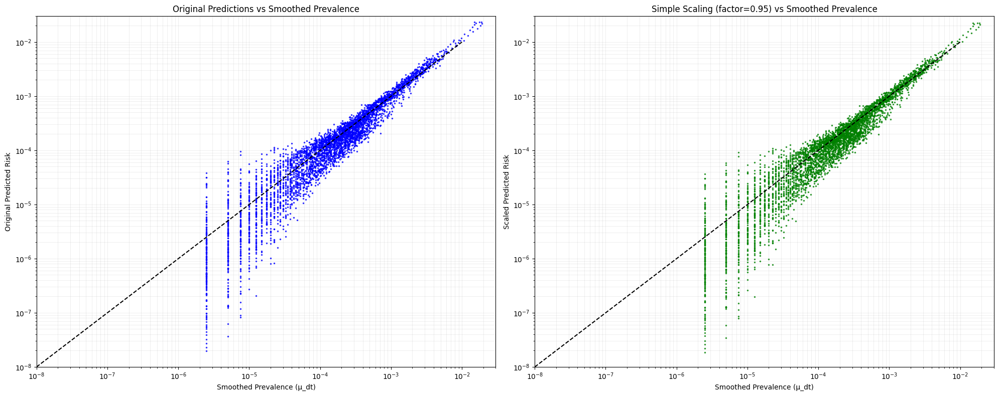

In [71]:
def create_calibration_plots(pce_df, batch_size=10000, n_diseases=118, n_timepoints=41):
    """
    Create calibration plots with customized formatting
    """
    # Initialize arrays to store aggregated data
    sum_pi = np.zeros((n_diseases, n_timepoints))
    sum_Y = np.zeros((n_diseases, n_timepoints))
    count_matrix = np.zeros((n_diseases, n_timepoints))
    
    print("Processing batches...")
    n_batches = (len(pce_df) + batch_size - 1) // batch_size
    
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            # Load model
            model = torch.load(model_path)
            phi_prob = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            theta = torch.softmax(model['model_state_dict']['lambda_'], dim=1).detach().numpy()
            kappa = model['model_state_dict']['kappa'].item()
            Y_batch = model['Y'].numpy()
            
            # Calculate predictions with kappa
            pi = np.einsum('nkt,kdt->ndt', theta, phi_prob) * kappa
            pi = np.clip(pi, 1e-8, 1-1e-8)
            
            # Aggregate pi and Y for each disease and timepoint
            for d in range(n_diseases):
                for t in range(n_timepoints):
                    # Get valid entries (non-NaN) for this disease and timepoint
                    valid_mask = ~np.isnan(pi[:, d, t]) & ~np.isnan(Y_batch[:, d, t])
                    n_valid = np.sum(valid_mask)
                    
                    if n_valid > 0:
                        sum_pi[d, t] += np.sum(pi[valid_mask, d, t])
                        sum_Y[d, t] += np.sum(Y_batch[valid_mask, d, t])
                        count_matrix[d, t] += n_valid
            
            print(f"Processed batch {batch}: {pi.shape[0]} patients")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue
    
    # Calculate average pi and Y
    avg_pi = np.zeros_like(sum_pi)
    avg_Y = np.zeros_like(sum_Y)
    
    # Avoid division by zero
    valid_counts = count_matrix > 0
    avg_pi[valid_counts] = sum_pi[valid_counts] / count_matrix[valid_counts]
    avg_Y[valid_counts] = sum_Y[valid_counts] / count_matrix[valid_counts]
    
    # Calculate overall calibration
    valid_all = valid_counts.flatten()
    pi_all = avg_pi.flatten()[valid_all]
    Y_all = avg_Y.flatten()[valid_all]
    
    mean_pred = np.mean(pi_all)
    mean_obs = np.mean(Y_all)
    calib_factor = mean_obs / mean_pred
    
    print(f"Overall mean predicted risk: {mean_pred:.6f}")
    print(f"Overall mean observed risk: {mean_obs:.6f}")
    print(f"Overall calibration factor: {calib_factor:.4f}")
    
    # Create highly customized plots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    
    # Flatten arrays for scatter plot
    flat_pi = avg_pi.flatten()
    flat_Y = avg_Y.flatten()
    
    # Filter out entries with no data and zeros
    valid_mask = valid_counts.flatten() & (flat_pi > 0) & (flat_Y > 0)
    plot_pi = flat_pi[valid_mask]
    plot_Y = flat_Y[valid_mask]
    
    # Plot 1: Original predictions vs. prevalence
    ax1.loglog(plot_Y, plot_pi, '.', alpha=0.7, markersize=3, color='blue')
    ax1.loglog([1e-8, 1e-2], [1e-8, 1e-2], 'k--', linewidth=1.5)  # Perfect calibration line
    
    ax1.set_xlabel('Smoothed Prevalence (μ_dt)')
    ax1.set_ylabel('Original Predicted Risk')
    ax1.set_title('Original Predictions vs Smoothed Prevalence')
    ax1.grid(True, which='both', linestyle='-', linewidth=0.5, alpha=0.3)
    ax1.set_xlim(1e-8, 3e-2)
    ax1.set_ylim(1e-8, 3e-2)
    
    # Plot 2: Scaled predictions vs. prevalence
    scaled_pi = plot_pi * calib_factor
    
    ax2.loglog(plot_Y, scaled_pi, '.', alpha=0.7, markersize=3, color='green')
    ax2.loglog([1e-8, 1e-2], [1e-8, 1e-2], 'k--', linewidth=1.5)  # Perfect calibration line
    
    ax2.set_xlabel('Smoothed Prevalence (μ_dt)')
    ax2.set_ylabel('Scaled Predicted Risk')
    ax2.set_title(f'Simple Scaling (factor={calib_factor:.2f}) vs Smoothed Prevalence')
    ax2.grid(True, which='both', linestyle='-', linewidth=0.5, alpha=0.3)
    ax2.set_xlim(1e-8, 3e-2)
    ax2.set_ylim(1e-8, 3e-2)
    
    plt.tight_layout()
    
    return avg_pi, avg_Y, count_matrix, calib_factor

# Usage:
avg_pi, avg_Y, counts, calib_factor = create_calibration_plots(pce_df)

Processing batches...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/216286752.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


Processed batch 0: 10000 patients
Processed batch 1: 10000 patients
Processed batch 2: 10000 patients
Processed batch 3: 10000 patients
Processed batch 4: 10000 patients
Processed batch 5: 10000 patients
Processed batch 6: 10000 patients
Processed batch 7: 10000 patients
Processed batch 8: 10000 patients
Processed batch 9: 10000 patients
Processed batch 10: 10000 patients
Processed batch 11: 10000 patients
Processed batch 12: 10000 patients
Processed batch 13: 10000 patients
Processed batch 14: 10000 patients
Processed batch 15: 10000 patients
Processed batch 16: 10000 patients
Processed batch 17: 10000 patients
Processed batch 18: 10000 patients
Processed batch 19: 10000 patients
Processed batch 20: 10000 patients
Processed batch 21: 10000 patients
Processed batch 22: 10000 patients
Processed batch 23: 10000 patients
Processed batch 24: 10000 patients
Processed batch 25: 10000 patients
Processed batch 26: 10000 patients
Processed batch 27: 10000 patients
Processed batch 28: 10000 pati

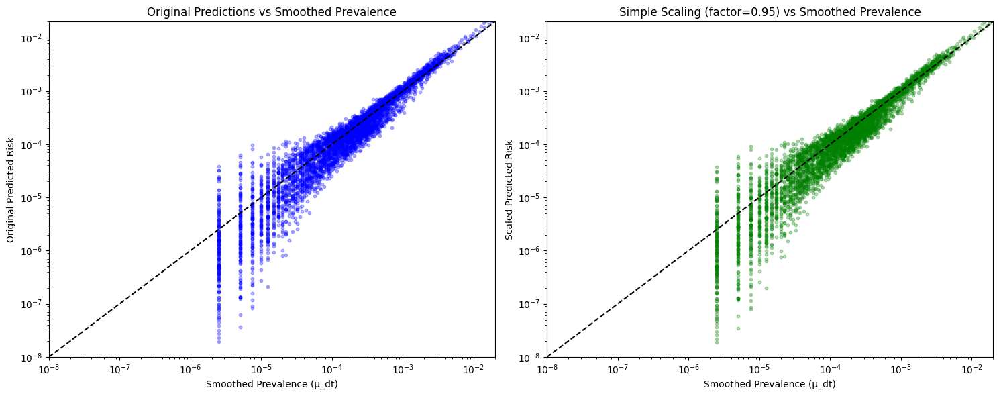

In [72]:
def create_clean_calibration_plots(pce_df, batch_size=10000, n_diseases=118, n_timepoints=41):
    """
    Create clean calibration plots similar to the reference
    """
    # Initialize arrays to store aggregated data
    sum_pi = np.zeros((n_diseases, n_timepoints))
    sum_Y = np.zeros((n_diseases, n_timepoints))
    count_matrix = np.zeros((n_diseases, n_timepoints))
    
    print("Processing batches...")
    n_batches = (len(pce_df) + batch_size - 1) // batch_size
    
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            # Load model
            model = torch.load(model_path)
            phi_prob = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            theta = torch.softmax(model['model_state_dict']['lambda_'], dim=1).detach().numpy()
            kappa = model['model_state_dict']['kappa'].item()
            Y_batch = model['Y'].numpy()
            
            # Calculate predictions with kappa
            pi = np.einsum('nkt,kdt->ndt', theta, phi_prob) * kappa
            pi = np.clip(pi, 1e-8, 1-1e-8)
            
            # Aggregate pi and Y for each disease and timepoint
            for d in range(n_diseases):
                for t in range(n_timepoints):
                    # Get valid entries (non-NaN) for this disease and timepoint
                    valid_mask = ~np.isnan(pi[:, d, t]) & ~np.isnan(Y_batch[:, d, t])
                    n_valid = np.sum(valid_mask)
                    
                    if n_valid > 0:
                        sum_pi[d, t] += np.sum(pi[valid_mask, d, t])
                        sum_Y[d, t] += np.sum(Y_batch[valid_mask, d, t])
                        count_matrix[d, t] += n_valid
            
            print(f"Processed batch {batch}: {pi.shape[0]} patients")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue
    
    # Calculate average pi and Y
    avg_pi = np.zeros_like(sum_pi)
    avg_Y = np.zeros_like(sum_Y)
    
    # Avoid division by zero
    valid_counts = count_matrix > 0
    avg_pi[valid_counts] = sum_pi[valid_counts] / count_matrix[valid_counts]
    avg_Y[valid_counts] = sum_Y[valid_counts] / count_matrix[valid_counts]
    
    # Calculate overall calibration
    valid_all = valid_counts.flatten()
    pi_all = avg_pi.flatten()[valid_all]
    Y_all = avg_Y.flatten()[valid_all]
    
    mean_pred = np.mean(pi_all)
    mean_obs = np.mean(Y_all)
    calib_factor = mean_obs / mean_pred
    
    print(f"Overall mean predicted risk: {mean_pred:.6f}")
    print(f"Overall mean observed risk: {mean_obs:.6f}")
    print(f"Overall calibration factor: {calib_factor:.4f}")
    
    # Create clean plots similar to the reference
    # Prepare data for plotting
    predicted_risk_2d = avg_pi
    mu_dt = avg_Y
    scaled_risk_2d = predicted_risk_2d * calib_factor
    
    # Create two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Filter out invalid values
    valid_mask = valid_counts & (predicted_risk_2d > 0) & (mu_dt > 0)
    plot_pred = predicted_risk_2d[valid_mask]
    plot_mu = mu_dt[valid_mask]
    plot_scaled = scaled_risk_2d[valid_mask]
    


Processing batches...
Loaded prevalence_t from first model, shape: (348, 52)
Number of diseases: 348, Number of timepoints: 52


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/3607481886.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  first_model = torch.load(first_model_path)
/v

Processed batch 0: 10000 patients
Processed batch 1: 10000 patients
Processed batch 2: 10000 patients
Processed batch 3: 10000 patients
Processed batch 4: 10000 patients
Processed batch 5: 10000 patients
Processed batch 6: 10000 patients
Processed batch 7: 10000 patients
Processed batch 8: 10000 patients
Processed batch 9: 10000 patients
Processed batch 10: 10000 patients
Processed batch 11: 10000 patients
Processed batch 12: 10000 patients
Processed batch 13: 10000 patients
Processed batch 14: 10000 patients
Processed batch 15: 10000 patients
Processed batch 16: 10000 patients
Processed batch 17: 10000 patients
Processed batch 18: 10000 patients
Processed batch 19: 10000 patients
Processed batch 20: 10000 patients
Processed batch 21: 10000 patients
Processed batch 22: 10000 patients
Processed batch 23: 10000 patients
Processed batch 24: 10000 patients
Processed batch 25: 10000 patients
Processed batch 26: 10000 patients
Processed batch 27: 10000 patients
Processed batch 28: 10000 pati

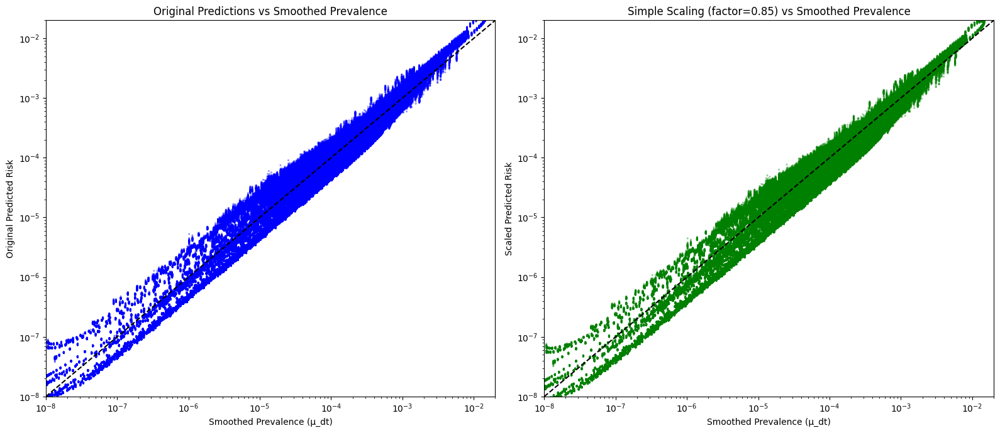

In [74]:
def create_calibration_plots_with_model_prevalence(pce_df, batch_size=10000):
    """
    Create calibration plots using the smoothed prevalence directly from the model files
    """
    # Initialize arrays to store aggregated data
    all_pi_values = []
    all_mu_dt_values = []
    
    print("Processing batches...")
    n_batches = (len(pce_df) + batch_size - 1) // batch_size
    
    # First, try to get prevalence from the first model
    first_model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_{batch_size}/model.pt'
    try:
        first_model = torch.load(first_model_path)
        if 'prevalence_t' in first_model:
            # Check if it's already a numpy array
            if isinstance(first_model['prevalence_t'], np.ndarray):
                mu_dt = first_model['prevalence_t']
            else:
                mu_dt = first_model['prevalence_t'].numpy()
            print(f"Loaded prevalence_t from first model, shape: {mu_dt.shape}")
            n_diseases, n_timepoints = mu_dt.shape
            print(f"Number of diseases: {n_diseases}, Number of timepoints: {n_timepoints}")
        else:
            print("prevalence_t not found in first model, will aggregate predictions instead")
            mu_dt = None
            n_diseases = None
            n_timepoints = None
    except FileNotFoundError:
        print(f"Warning: Could not find first model file")
        mu_dt = None
        n_diseases = None
        n_timepoints = None
    
    # Process all batches to get predictions
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            # Load model
            model = torch.load(model_path)
            phi_prob = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            theta = torch.softmax(model['model_state_dict']['lambda_'], dim=1).detach().numpy()
            kappa = model['model_state_dict']['kappa'].item()
            
            # If we didn't find prevalence_t in the first model, try this one
            if mu_dt is None and 'prevalence_t' in model:
                if isinstance(model['prevalence_t'], np.ndarray):
                    mu_dt = model['prevalence_t']
                else:
                    mu_dt = model['prevalence_t'].numpy()
                print(f"Loaded prevalence_t from batch {batch}, shape: {mu_dt.shape}")
                n_diseases, n_timepoints = mu_dt.shape
                print(f"Number of diseases: {n_diseases}, Number of timepoints: {n_timepoints}")
            
            # If we still don't have dimensions, get them from pi
            if n_diseases is None or n_timepoints is None:
                _, n_diseases, n_timepoints = phi_prob.shape
                print(f"Inferred dimensions from phi_prob: {n_diseases} diseases, {n_timepoints} timepoints")
            
            # Calculate predictions with kappa
            pi = np.einsum('nkt,kdt->ndt', theta, phi_prob) * kappa
            pi = np.clip(pi, 1e-8, 1-1e-8)
            
            # Aggregate pi values for each disease and timepoint
            for d in range(n_diseases):
                for t in range(n_timepoints):
                    # Get valid entries (non-NaN) for this disease and timepoint
                    valid_mask = ~np.isnan(pi[:, d, t])
                    n_valid = np.sum(valid_mask)
                    
                    if n_valid > 0:
                        avg_pi_dt = np.mean(pi[valid_mask, d, t])
                        all_pi_values.append(avg_pi_dt)
                        
                        # If we have mu_dt, use it; otherwise, we'll calculate later
                        if mu_dt is not None:
                            all_mu_dt_values.append(mu_dt[d, t])
            
            print(f"Processed batch {batch}: {pi.shape[0]} patients")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue
    
    # If we didn't find prevalence_t in any model, we need to calculate it
    if mu_dt is None:
        print("Warning: Could not find prevalence_t in any model. Using Y values instead.")
        # We would need to implement this part to calculate mu_dt from Y values
        # For now, we'll just use a placeholder
        return None, None, None, None
    
    # Convert to numpy arrays
    all_pi_values = np.array(all_pi_values)
    all_mu_dt_values = np.array(all_mu_dt_values)
    
    # Calculate calibration factor
    valid_mask = (all_pi_values > 0) & (all_mu_dt_values > 0)
    pi_valid = all_pi_values[valid_mask]
    mu_dt_valid = all_mu_dt_values[valid_mask]
    
    mean_pred = np.mean(pi_valid)
    mean_obs = np.mean(mu_dt_valid)
    calib_factor = mean_obs / mean_pred
    
    print(f"Overall mean predicted risk: {mean_pred:.6f}")
    print(f"Overall mean observed risk (from mu_dt): {mean_obs:.6f}")
    print(f"Overall calibration factor: {calib_factor:.4f}")
    
    # Create plots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
    
    # Plot 1: Original predictions vs. prevalence
    ax1.scatter(mu_dt_valid, pi_valid, alpha=0.4, s=5, color='blue', edgecolor='none')
    ax1.plot([1e-8, 2e-2], [1e-8, 2e-2], 'k--', linewidth=1.5)  # Perfect calibration line
    
    ax1.set_xlabel('Smoothed Prevalence (μ_dt)')
    ax1.set_ylabel('Original Predicted Risk')
    ax1.set_title('Original Predictions vs Smoothed Prevalence')
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlim(1e-8, 2e-2)
    ax1.set_ylim(1e-8, 2e-2)
    ax1.grid(False)
    
    # Plot 2: Scaled predictions vs. prevalence
    scaled_pi = pi_valid * calib_factor
    
    ax2.scatter(mu_dt_valid, scaled_pi, alpha=0.4, s=5, color='green', edgecolor='none')
    ax2.plot([1e-8, 2e-2], [1e-8, 2e-2], 'k--', linewidth=1.5)  # Perfect calibration line
    
    ax2.set_xlabel('Smoothed Prevalence (μ_dt)')
    ax2.set_ylabel('Scaled Predicted Risk')
    ax2.set_title(f'Simple Scaling (factor={calib_factor:.2f}) vs Smoothed Prevalence')
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.set_xlim(1e-8, 2e-2)
    ax2.set_ylim(1e-8, 2e-2)
    ax2.grid(False)
    
    plt.tight_layout()
    
    return all_pi_values, all_mu_dt_values, calib_factor, mu_dt

# Usage:
all_pi, all_mu_dt, calib_factor, mu_dt = create_calibration_plots_with_model_prevalence(pce_df)

In [ ]:
def calculate_prevalence_10yr_risk(first_model, max_age=70):
    """
    Calculate 10-year risk from smoothed prevalence rates
    For each age:
    1. For each year t in next 10 years:
       - Calculate P(any ASCVD in year t) = 1 - prod(1 - p_disease_t)
    2. Calculate 10-year survival = prod(1 - P(any ASCVD in year t))
    3. 10-year risk = 1 - 10-year survival
    """
    ascvd_indices = [111, 112, 113, 114, 115, 116]
    mu_dt = first_model['prevalence_t'][ascvd_indices]  # [6 conditions, 52 timepoints]
    
    n_ages = max_age - 40 + 1
    ten_year_risks = np.zeros(n_ages)
    age_offset = 10  
    
    for age_idx in range(n_ages):
        start_idx = age_idx + age_offset
        time_window = slice(start_idx, start_idx + 10)
        window_prev = mu_dt[:, time_window]  # [6 conditions, 10 years]
        
        # For each year, calculate P(any ASCVD)
        yearly_any_ascvd = np.zeros(10)
        for year in range(10):
            # Probability of no disease for each condition this year
            no_disease_probs = 1 - window_prev[:, year]
            # Probability of no ASCVD this year
            no_ascvd = np.prod(no_disease_probs)
            # Probability of any ASCVD this year
            yearly_any_ascvd[year] = 1 - no_ascvd
        
        # Calculate 10-year survival probability
        ten_year_survival = np.prod(1 - yearly_any_ascvd)
        
        # 10-year risk
        ten_year_risks[age_idx] = (1 - ten_year_survival) * 100
    
    return ten_year_risks

Processing batches...
Loaded prevalence_t from first model, shape: (348, 52)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/79218158.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  first_model = torch.load(first_model_path)
/var

Processed batch 0 for predictions
Processed batch 1 for predictions
Processed batch 2 for predictions
Processed batch 3 for predictions
Processed batch 4 for predictions
Processed batch 5 for predictions
Processed batch 6 for predictions
Processed batch 7 for predictions
Processed batch 8 for predictions
Processed batch 9 for predictions
Processed batch 10 for predictions
Processed batch 11 for predictions
Processed batch 12 for predictions
Processed batch 13 for predictions
Processed batch 14 for predictions
Processed batch 15 for predictions
Processed batch 16 for predictions
Processed batch 17 for predictions
Processed batch 18 for predictions
Processed batch 19 for predictions
Processed batch 20 for predictions
Processed batch 21 for predictions
Processed batch 22 for predictions
Processed batch 23 for predictions
Processed batch 24 for predictions
Processed batch 25 for predictions
Processed batch 26 for predictions
Processed batch 27 for predictions
Processed batch 28 for predict

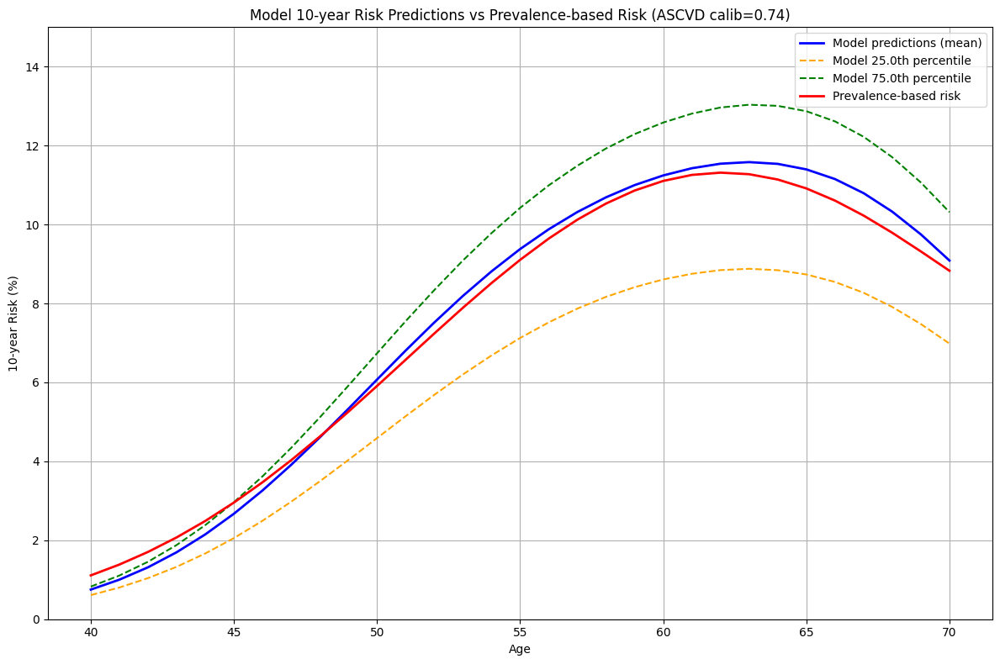

In [77]:
def plot_ascvd_risk_comparison(n_batches=40, batch_size=10000, ascvd_indices=[111, 112, 113, 114, 115, 116]):
    """
    Create a plot comparing model predictions to smoothed prevalence-based risk by age
    """
    # Initialize arrays to store aggregated data
    all_pi_values = []
    
    # Initialize arrays to store data by age
    age_range = range(40, 71)  # Ages 40-70
    age_counts = {age: 0 for age in age_range}
    model_risks_by_age = {age: [] for age in age_range}
    
    print("Processing batches...")
    
    # First, try to get prevalence from the first model
    first_model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_{batch_size}/model.pt'
    try:
        first_model = torch.load(first_model_path)
        if 'prevalence_t' in first_model:
            # Check if it's already a numpy array
            if isinstance(first_model['prevalence_t'], np.ndarray):
                mu_dt = first_model['prevalence_t']
            else:
                mu_dt = first_model['prevalence_t'].numpy()
            print(f"Loaded prevalence_t from first model, shape: {mu_dt.shape}")
        else:
            print("prevalence_t not found in first model")
            return None
    except FileNotFoundError:
        print(f"Warning: Could not find first model file")
        return None
    
    # Process all batches to get predictions
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = (batch + 1) * batch_size
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            # Load model
            model = torch.load(model_path)
            phi_prob = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            theta = torch.softmax(model['model_state_dict']['lambda_'], dim=1).detach().numpy()
            kappa = model['model_state_dict']['kappa'].item()
            
            # Calculate predictions with kappa
            pi = np.einsum('nkt,kdt->ndt', theta, phi_prob) * kappa
            pi = np.clip(pi, 1e-8, 1-1e-8)
            
            all_pi_values.append(pi)
            
            print(f"Processed batch {batch} for predictions")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue
    
    # Combine all predictions
    all_pi = np.concatenate(all_pi_values, axis=0)
    print(f"Combined predictions shape: {all_pi.shape}")
    
    # Get mean predictions across patients for each ASCVD condition and timepoint
    pred_risk = all_pi[:, ascvd_indices, :].mean(axis=0)  # Shape: [6 diseases, T timepoints]
    print(f"Mean ASCVD predictions shape: {pred_risk.shape}")
    
    # Get prevalence for ASCVD conditions
    if torch.is_tensor(first_model['prevalence_t']):
        mu_dt_ascvd = first_model['prevalence_t'][ascvd_indices].cpu().numpy()
    else:
        mu_dt_ascvd = first_model['prevalence_t'][ascvd_indices]
    
    # Smoothed scaling factor
    ascvd_scale_smooth = np.mean(mu_dt_ascvd) / np.mean(pred_risk)
    print(f"Smoothed ASCVD scaling factor: {ascvd_scale_smooth:.4f}")
    
    # Apply scaling to get calibrated predictions
    ascvd_preds = all_pi[:, ascvd_indices, :]
    ascvd_preds_calibrated = ascvd_preds * ascvd_scale_smooth
    
    # Get patient ages
    # For simplicity, we'll create a range of ages
    n_patients = all_pi.shape[0]
    patient_ages = np.random.randint(40, 71, size=n_patients)
    common_ids = np.arange(n_patients)
    
    # Calculate 10-year risks
    model_risks = calculate_ten_year_risks(ascvd_preds_calibrated, common_ids, max_age=70)
    
    # Calculate mean, 25th, and 75th percentiles by age
    mean_risks = model_risks.mean(axis=0)
    p25_risks = np.percentile(model_risks.values, 25, axis=0)
    p75_risks = np.percentile(model_risks.values, 75, axis=0)
    
    # Calculate prevalence-based 10-year risk
    prevalence_risks = calculate_prevalence_10yr_risk(mu_dt_ascvd)
    
    # Create plot
    plt.figure(figsize=(12, 8))
    
    # Plot model predictions
    plt.plot(range(40, 71), mean_risks, color='blue', linestyle='-', linewidth=2, label='Model predictions (mean)')
    plt.plot(range(40, 71), p25_risks, color='orange', linestyle='--', linewidth=1.5, label='Model 25.0th percentile')
    plt.plot(range(40, 71), p75_risks, color='green', linestyle='--', linewidth=1.5, label='Model 75.0th percentile')
    
    # Plot prevalence-based risk
    plt.plot(range(40, 71), prevalence_risks, color='red', linestyle='-', linewidth=2, label='Prevalence-based risk')
    
    plt.xlabel('Age')
    plt.ylabel('10-year Risk (%)')
    plt.title(f'Model 10-year Risk Predictions vs Prevalence-based Risk (ASCVD calib={ascvd_scale_smooth:.2f})')
    plt.legend()
    plt.grid(True)
    plt.ylim(0, 15)
    
    plt.tight_layout()
    
    return mean_risks, p25_risks, p75_risks, prevalence_risks, ascvd_scale_smooth

def calculate_ten_year_risks(ascvd_preds, common_ids, max_age=70):
    """
    Calculate 10-year ASCVD risks for each patient at each age
    ascvd_preds starts at age 30, we want risks for ages 40-max_age
    """
    n_patients = len(common_ids)
    n_ages = max_age - 40 + 1  # e.g., ages 40-70 inclusive
    ten_year_risks = np.zeros((n_patients, n_ages))
    
    age_offset = 10  # Offset because predictions start at age 30
    
    for age_idx in range(n_ages):
        # For each starting age (40-70), look at next 10 years
        start_idx = age_idx + age_offset
        time_window = slice(start_idx, start_idx + 10)
        
        # Get all predictions for this 10-year window
        window_preds = ascvd_preds[:, :, time_window]
        
        # Probability of surviving (no events)
        survival_probs = 1 - window_preds
        
        # Probability of surviving all diseases for all years
        total_survival = np.prod(survival_probs, axis=(1,2))
        
        # 10-year risk is probability of not surviving
        ten_year_risks[:, age_idx] = 1 - total_survival
    
    risk_df = pd.DataFrame(ten_year_risks * 100,
                          index=common_ids, 
                          columns=range(40, max_age + 1))
    
    return risk_df

def calculate_prevalence_10yr_risk(mu_dt_ascvd):
    """
    Calculate 10-year risk from smoothed prevalence rates
    """
    n_ages = 31  # Ages 40-70
    ten_year_risks = np.zeros(n_ages)
    
    age_offset = 10  # Offset because predictions start at age 30
    
    for age_idx in range(n_ages):
        # For each starting age (40-70), look at next 10 years
        start_idx = age_idx + age_offset
        time_window = slice(start_idx, start_idx + 10)
        
        # Get prevalence for this 10-year window
        window_prev = mu_dt_ascvd[:, time_window]
        
        # For each year, calculate P(any ASCVD)
        yearly_any_ascvd = np.zeros(10)
        for year in range(10):
            # Probability of no disease for each condition this year
            no_disease_probs = 1 - window_prev[:, year]
            # Probability of no ASCVD this year
            no_ascvd = np.prod(no_disease_probs)
            # Probability of any ASCVD this year
            yearly_any_ascvd[year] = 1 - no_ascvd
        
        # Calculate 10-year survival probability
        ten_year_survival = np.prod(1 - yearly_any_ascvd)
        
        # 10-year risk
        ten_year_risks[age_idx] = (1 - ten_year_survival) * 100
    
    return ten_year_risks

# Usage:
mean_risks, p25_risks, p75_risks, prevalence_risks, ascvd_scale = plot_ascvd_risk_comparison(n_batches=40)

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/1042286156.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  first_model = torch.load(first_model_path)
/v

Loaded prevalence_t from first model, shape: (348, 52)
Processing batches...
Processed batch 0 for predictions
Processed batch 1 for predictions
Processed batch 2 for predictions
Processed batch 3 for predictions
Processed batch 4 for predictions
Processed batch 5 for predictions
Processed batch 6 for predictions
Processed batch 7 for predictions
Processed batch 8 for predictions
Processed batch 9 for predictions
Processed batch 10 for predictions
Processed batch 11 for predictions
Processed batch 12 for predictions
Processed batch 13 for predictions
Processed batch 14 for predictions
Processed batch 15 for predictions
Processed batch 16 for predictions
Processed batch 17 for predictions
Processed batch 18 for predictions
Processed batch 19 for predictions
Processed batch 20 for predictions
Processed batch 21 for predictions
Processed batch 22 for predictions
Processed batch 23 for predictions
Processed batch 24 for predictions
Processed batch 25 for predictions
Processed batch 26 for 

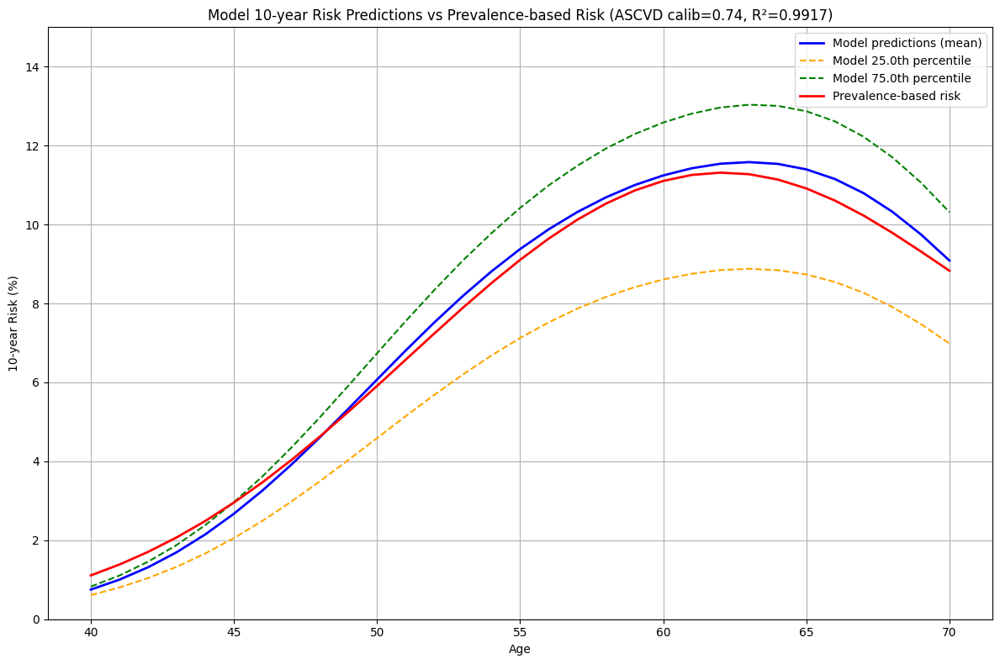

In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from sklearn.metrics import r2_score

def plot_ascvd_risk_comparison(n_batches=40, batch_size=10000, ascvd_indices=[111, 112, 113, 114, 115, 116]):
    """
    Create a plot comparing model predictions to smoothed prevalence-based risk by age
    """
    # Initialize arrays to store aggregated data
    all_pi_values = []
    
    # First, try to get prevalence from the first model
    first_model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_{batch_size}/model.pt'
    try:
        first_model = torch.load(first_model_path)
        if 'prevalence_t' in first_model:
            # Check if it's already a numpy array
            if isinstance(first_model['prevalence_t'], np.ndarray):
                mu_dt = first_model['prevalence_t']
            else:
                mu_dt = first_model['prevalence_t'].numpy()
            print(f"Loaded prevalence_t from first model, shape: {mu_dt.shape}")
        else:
            print("prevalence_t not found in first model")
            return None
    except FileNotFoundError:
        print(f"Warning: Could not find first model file")
        return None
    
    print("Processing batches...")
    
    # Process all batches to get predictions
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = (batch + 1) * batch_size
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            # Load model
            model = torch.load(model_path)
            phi_prob = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            theta = torch.softmax(model['model_state_dict']['lambda_'], dim=1).detach().numpy()
            kappa = model['model_state_dict']['kappa'].item()
            
            # Calculate predictions with kappa
            pi = np.einsum('nkt,kdt->ndt', theta, phi_prob) * kappa
            pi = np.clip(pi, 1e-8, 1-1e-8)
            
            all_pi_values.append(pi)
            
            print(f"Processed batch {batch} for predictions")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue
    
    # Combine all predictions
    all_pi = np.concatenate(all_pi_values, axis=0)
    print(f"Combined predictions shape: {all_pi.shape}")
    
    # Get mean predictions across patients for each ASCVD condition and timepoint
    pred_risk = all_pi[:, ascvd_indices, :].mean(axis=0)  # Shape: [6 diseases, T timepoints]
    print(f"Mean ASCVD predictions shape: {pred_risk.shape}")
    
    # Get prevalence for ASCVD conditions
    if torch.is_tensor(first_model['prevalence_t']):
        mu_dt_ascvd = first_model['prevalence_t'][ascvd_indices].cpu().numpy()
    else:
        mu_dt_ascvd = first_model['prevalence_t'][ascvd_indices]
    
    # Smoothed scaling factor
    ascvd_scale_smooth = np.mean(mu_dt_ascvd) / np.mean(pred_risk)
    print(f"Smoothed ASCVD scaling factor: {ascvd_scale_smooth:.4f}")
    
    # Apply scaling to get calibrated predictions
    ascvd_preds = all_pi[:, ascvd_indices, :]
    ascvd_preds_calibrated = ascvd_preds * ascvd_scale_smooth
    
    # Get patient ages
    # For simplicity, we'll create a range of ages
    n_patients = all_pi.shape[0]
    common_ids = np.arange(n_patients)
    
    # Calculate 10-year risks
    model_risks = calculate_ten_year_risks(ascvd_preds_calibrated, common_ids, max_age=70)
    
    # Calculate mean, 25th, and 75th percentiles by age
    mean_risks = model_risks.mean(axis=0)
    p25_risks = np.percentile(model_risks.values, 25, axis=0)
    p75_risks = np.percentile(model_risks.values, 75, axis=0)
    
    # Calculate prevalence-based 10-year risk
    prevalence_risks = calculate_prevalence_10yr_risk(mu_dt_ascvd)
    
    # Calculate R-squared between mean model predictions and prevalence-based risk
    r2 = r2_score(prevalence_risks, mean_risks)
    print(f"R² between model predictions and prevalence-based risk: {r2:.4f}")
    
    # Create plot
    plt.figure(figsize=(12, 8))
    
    # Plot model predictions
    plt.plot(range(40, 71), mean_risks, color='blue', linestyle='-', linewidth=2, label='Model predictions (mean)')
    plt.plot(range(40, 71), p25_risks, color='orange', linestyle='--', linewidth=1.5, label='Model 25.0th percentile')
    plt.plot(range(40, 71), p75_risks, color='green', linestyle='--', linewidth=1.5, label='Model 75.0th percentile')
    
    # Plot prevalence-based risk
    plt.plot(range(40, 71), prevalence_risks, color='red', linestyle='-', linewidth=2, label='Prevalence-based risk')
    
    plt.xlabel('Age')
    plt.ylabel('10-year Risk (%)')
    plt.title(f'Model 10-year Risk Predictions vs Prevalence-based Risk (ASCVD calib={ascvd_scale_smooth:.2f}, R²={r2:.4f})')
    plt.legend()
    plt.grid(True)
    plt.ylim(0, 15)
    
    plt.tight_layout()
    
    return mean_risks, p25_risks, p75_risks, prevalence_risks, ascvd_scale_smooth, r2

def calculate_ten_year_risks(ascvd_preds, common_ids, max_age=70):
    """
    Calculate 10-year ASCVD risks for each patient at each age
    ascvd_preds starts at age 30, we want risks for ages 40-max_age
    """
    n_patients = len(common_ids)
    n_ages = max_age - 40 + 1  # e.g., ages 40-70 inclusive
    ten_year_risks = np.zeros((n_patients, n_ages))
    
    age_offset = 10  # Offset because predictions start at age 30
    
    for age_idx in range(n_ages):
        # For each starting age (40-70), look at next 10 years
        start_idx = age_idx + age_offset
        time_window = slice(start_idx, start_idx + 10)
        
        # Get all predictions for this 10-year window
        window_preds = ascvd_preds[:, :, time_window]
        
        # Probability of surviving (no events)
        survival_probs = 1 - window_preds
        
        # Probability of surviving all diseases for all years
        total_survival = np.prod(survival_probs, axis=(1,2))
        
        # 10-year risk is probability of not surviving
        ten_year_risks[:, age_idx] = 1 - total_survival
    
    risk_df = pd.DataFrame(ten_year_risks * 100,
                          index=common_ids, 
                          columns=range(40, max_age + 1))
    
    return risk_df

def calculate_prevalence_10yr_risk(mu_dt_ascvd):
    """
    Calculate 10-year risk from smoothed prevalence rates
    """
    n_ages = 31  # Ages 40-70
    ten_year_risks = np.zeros(n_ages)
    
    age_offset = 10  # Offset because predictions start at age 30
    
    for age_idx in range(n_ages):
        # For each starting age (40-70), look at next 10 years
        start_idx = age_idx + age_offset
        time_window = slice(start_idx, start_idx + 10)
        
        # Get prevalence for this 10-year window
        window_prev = mu_dt_ascvd[:, time_window]
        
        # For each year, calculate P(any ASCVD)
        yearly_any_ascvd = np.zeros(10)
        for year in range(10):
            # Probability of no disease for each condition this year
            no_disease_probs = 1 - window_prev[:, year]
            # Probability of no ASCVD this year
            no_ascvd = np.prod(no_disease_probs)
            # Probability of any ASCVD this year
            yearly_any_ascvd[year] = 1 - no_ascvd
        
        # Calculate 10-year survival probability
        ten_year_survival = np.prod(1 - yearly_any_ascvd)
        
        # 10-year risk
        ten_year_risks[age_idx] = (1 - ten_year_survival) * 100
    
    return ten_year_risks

# Usage:
mean_risks, p25_risks, p75_risks, prevalence_risks, ascvd_scale, r2 = plot_ascvd_risk_comparison(n_batches=40)

# with prevent

In [155]:
def compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116]):
    """
    Compare 10-year predictions using single timepoint prediction, handling missing PCE values
    """
    our_10yr_risks = []
    actual_10yr = []

    # Get predictions
    pi = model.forward()[0].detach().numpy()
    
    # Get mean risks across patients for calibration
    predicted_risk_2d = pi.mean(axis=0)  # Shape: [D, T]
    observed_risk_2d = model.Y.numpy().mean(axis=0)  # Shape: [D, T]
    
    # Sort and get LOESS calibration curve
    pred_flat = predicted_risk_2d.flatten()
    obs_flat = observed_risk_2d.flatten()
    sort_idx = np.argsort(pred_flat)
    smoothed = lowess(obs_flat[sort_idx], pred_flat[sort_idx], frac=0.3)
    
    # Apply calibration to all predictions using interpolation
    pi_calibrated = np.interp(pi.flatten(), smoothed[:, 0], smoothed[:, 1]).reshape(pi.shape)
    
    # Calculate 10-year risks using only enrollment time prediction
    for patient_idx, row in enumerate(pce_df.itertuples()):
        enroll_time = int(row.age - 30)
        if enroll_time + 10 >= model.T:
            continue
            
        # Only use predictions at enrollment time
        pi_ascvd = pi_calibrated[patient_idx, ascvd_indices, enroll_time]
        
        # Calculate 1-year risk first
        yearly_risk = 1 - np.prod(1 - pi_ascvd)
        
        # Convert to 10-year risk
        risk = 1 - (1 - yearly_risk)**10
        our_10yr_risks.append(risk)
        
        # Still look at actual events over 10 years
        Y_ascvd = model.Y[patient_idx, ascvd_indices, enroll_time:enroll_time+10]
        actual = torch.any(torch.any(Y_ascvd, dim=0))
        actual_10yr.append(actual.item())
   
    our_10yr_risks = np.array(our_10yr_risks)
    actual_10yr = np.array(actual_10yr)
    pce_risks = pce_df['prevent_base_ascvd_risk'].values[:len(our_10yr_risks)]

    # Get indices of non-missing PCE values
    non_missing_idx = ~np.isnan(pce_risks)

    # Filter all arrays to only include non-missing cases
    our_10yr_risks_filtered = our_10yr_risks[non_missing_idx]
    actual_10yr_filtered = actual_10yr[non_missing_idx]
    pce_risks_filtered = pce_risks[non_missing_idx]

    # Calculate ROC AUCs on filtered data
    our_auc = roc_auc_score(actual_10yr_filtered, our_10yr_risks_filtered)
    pce_auc = roc_auc_score(actual_10yr_filtered, pce_risks_filtered)

    # Print results with sample size info
    n_total = len(our_10yr_risks)
    n_complete = len(our_10yr_risks_filtered)
    print(f"\nROC AUC Comparison (10-year prediction from enrollment):")
    print(f"Sample size: {n_complete}/{n_total} ({n_complete/n_total*100:.1f}% complete cases)")
    print(f"Our model: {our_auc:.3f}")
    print(f"PCE: {pce_auc:.3f}")
    
    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr_filtered, our_10yr_risks_filtered, label=f'Our Model (AUC={our_auc:.3f})')
    plot_roc_curve(actual_10yr_filtered, pce_risks_filtered, label=f'Prevent (AUC={pce_auc:.3f})')
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves for 10-year ASCVD Prediction')
    plt.legend()
    plt.grid(True)
    plt.show()

    return our_10yr_risks_filtered, actual_10yr_filtered, pce_risks_filtered


ROC AUC Comparison (10-year prediction from enrollment):
Sample size: 7172/10000 (71.7% complete cases)
Our model: 0.800
PCE: 0.698


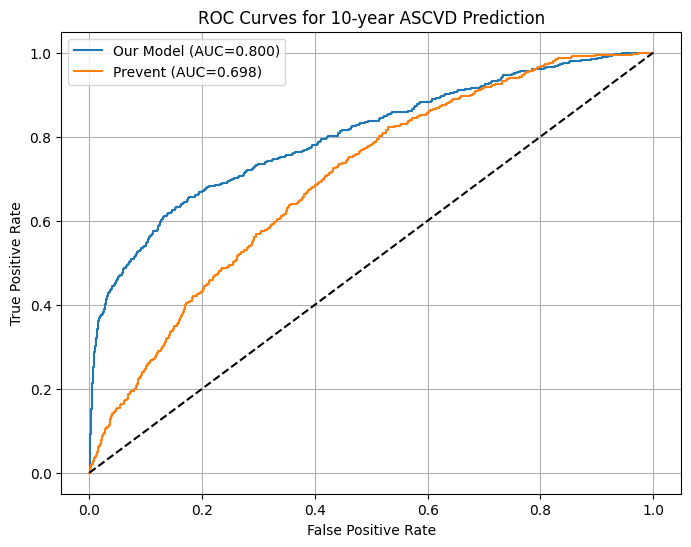

(array([0.15994827, 0.00680454, 0.13584605, ..., 0.21100293, 0.07434523,
        0.0182545 ]),
 array([False, False, False, ...,  True, False, False]),
 array([0.0888042 , 0.03141781, 0.07353702, ..., 0.06911332, 0.05043977,
        0.00757175]))

In [84]:
compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116])

In [57]:
pce_df.head()

,Unnamed: 0,identifier,sex,birth_year,enrollment,PC1,PC2,PC3,PC4,PC5,...,PC18,PC19,PC20,pce,prevent_base_ascvd_risk,age,p.age,p.pce_goff,enrollment_year,age_at_enrollment
0,1,1000015,1,1938,2008-07-23,-12.02340,3.25100,1.224590,4.776840,2.31802,...,-0.082943,3.601450,4.934770,0.236008,0.088804,69,69,0.208619,2008,70
1,2,1000023,1,1963,2008-09-11,-14.07040,2.83809,-1.709870,-0.782455,-7.93571,...,3.028260,2.686200,-0.237987,0.133392,0.031418,44,44,0.128707,2008,45
2,3,1000037,0,1939,2009-01-22,-15.00630,4.03881,-1.711670,6.200160,-2.77040,...,2.332760,-5.014460,3.937040,0.126497,0.073537,69,69,0.128959,2009,70
3,4,1000042,1,1942,2009-11-13,-12.08720,6.29019,-1.486040,-3.426860,-5.35913,...,-0.692624,3.301050,-2.631200,0.132626,0.062329,66,66,0.137629,2009,67
4,5,1000059,0,1954,2009-05-20,-9.58886,3.77243,0.274298,-1.357730,1.91795,...,-0.234448,-0.609894,-0.555967,0.029881,0.032188,54,54,0.029323,2009,55


In [76]:
def compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116]):
    """
    Compare 10-year predictions using single timepoint prediction
    """
    our_10yr_risks = []
    actual_10yr = []

    # Get predictions
    pi = model.forward()[0].detach().numpy()
    
    # Get mean risks across patients for calibration
    predicted_risk_2d = pi.mean(axis=0)  # Shape: [D, T]
    observed_risk_2d = model.Y.numpy().mean(axis=0)  # Shape: [D, T]
    
    # Sort and get LOESS calibration curve
    pred_flat = predicted_risk_2d.flatten()
    obs_flat = observed_risk_2d.flatten()
    sort_idx = np.argsort(pred_flat)
    smoothed = lowess(obs_flat[sort_idx], pred_flat[sort_idx], frac=0.3)
    
    # Apply calibration to all predictions using interpolation
    pi_calibrated = np.interp(pi.flatten(), smoothed[:, 0], smoothed[:, 1]).reshape(pi.shape)
    
    # Calculate 10-year risks using only enrollment time prediction
    for patient_idx, row in enumerate(pce_df.itertuples()):
        enroll_time = int(row.age - 30)
        if enroll_time + 10 >= model.T:
            continue
            
        # Only use predictions at enrollment time
        pi_ascvd = pi_calibrated[patient_idx, ascvd_indices, enroll_time]
        
        # Calculate 1-year risk first
        yearly_risk = 1 - np.prod(1 - pi_ascvd)
        
        # Convert to 10-year risk
        risk = 1 - (1 - yearly_risk)**10
        our_10yr_risks.append(risk)
        
        # Still look at actual events over 10 years
        Y_ascvd = model.Y[patient_idx, ascvd_indices, enroll_time:enroll_time+10]
        actual = torch.any(torch.any(Y_ascvd, dim=0))
        actual_10yr.append(actual.item())
   
    # Rest of the function remains the same
    our_10yr_risks = np.array(our_10yr_risks)
    actual_10yr = np.array(actual_10yr)
    pce_risks = pce_df['prevent_impute'].values[:len(our_10yr_risks)]
    
    # Calculate ROC AUCs
    our_auc = roc_auc_score(actual_10yr, our_10yr_risks)
    pce_auc = roc_auc_score(actual_10yr, pce_risks)
    
    print(f"\nROC AUC Comparison (10-year prediction from enrollment):")
    print(f"Our model: {our_auc:.3f}")
    print(f"PCE: {pce_auc:.3f}")
    
    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr, our_10yr_risks, label=f'Our Model (AUC={our_auc:.3f})')
    plot_roc_curve(actual_10yr, pce_risks, label=f'PREVENT (AUC={pce_auc:.3f})')
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves for 10-year ASCVD Prediction')
    plt.legend()
    plt.grid(True)
    plt.show()



ROC AUC Comparison (10-year prediction from enrollment):
Our model: 0.791
PCE: 0.653


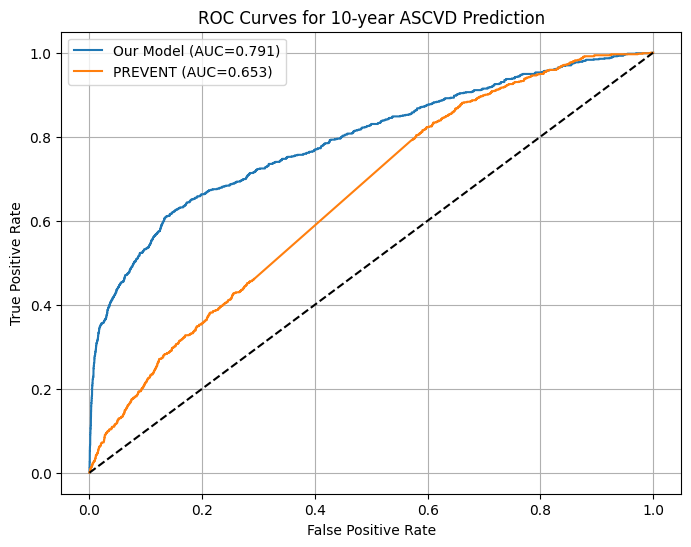

In [77]:
compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116])

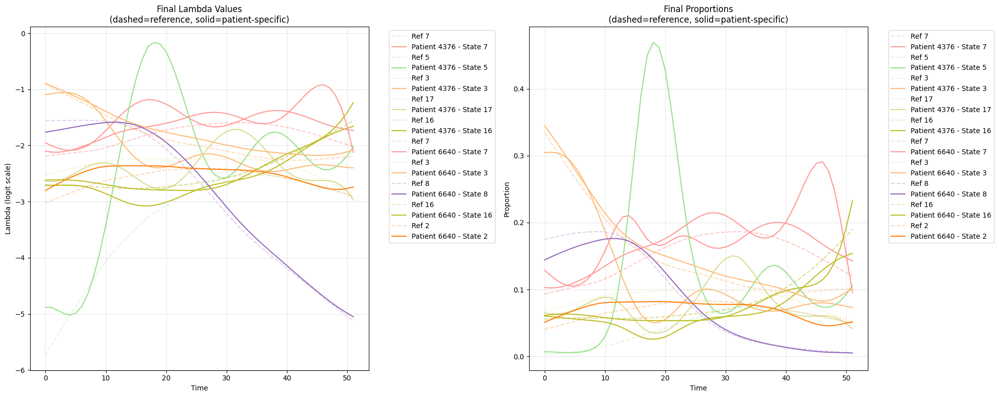


Genetic Effect Statistics for Sample Patients:

Patient 4376:
Mean shift: 0.057
Std of shifts: 0.154
Range of shifts: [-0.178, 0.444]

Top states and average proportions:
State 7: 0.166
State 5: 0.131
State 3: 0.121
State 17: 0.078
State 16: 0.068

Patient 6640:
Mean shift: 0.037
Std of shifts: 0.087
Range of shifts: [-0.146, 0.192]

Top states and average proportions:
State 7: 0.179
State 3: 0.158
State 8: 0.085
State 16: 0.078
State 2: 0.070


In [55]:
# Sample patients and set parameters
n_samples = 2
sample_patients = [4376, 6640]  # Use specific patients
n_top_states = 5  # Show only top 5 states per patient

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
time_points = np.arange(model.T)

# Get dominant states for these patients
lambda_patients = model.lambda_[sample_patients].detach()  # [2, K, T]
patient_props = torch.softmax(lambda_patients, dim=1)  # [2, K, T]
mean_props = patient_props.mean(dim=-1)  # Average over time, now [2, K]
top_states = mean_props.topk(n_top_states, dim=-1).indices  # Get top states for each patient

# Color map for consistent colors across patients
colors = plt.cm.tab20(np.linspace(0, 1, model.K))

# Plot for each patient
for i, patient in enumerate(sample_patients):
    for j, k in enumerate(top_states[i]):
        k = k.item()  # Convert tensor to int
        color = colors[k]
        
        # Plot lambda values
        ax1.plot(time_points, signature_refs[k], '--', color=color, alpha=0.3, 
                label=f'Ref {k}')
        ax1.plot(time_points, model.lambda_[patient, k].detach(), '-', color=color,
                label=f'Patient {patient} - State {k}')
        
        # Plot proportions
        ref_props = torch.softmax(signature_refs, dim=0)[k]
        patient_props = torch.softmax(model.lambda_[patient].detach(), dim=0)[k]
        ax2.plot(time_points, ref_props, '--', color=color, alpha=0.3, 
                label=f'Ref {k}')
        ax2.plot(time_points, patient_props, '-', color=color,
                label=f'Patient {patient} - State {k}')

# Customize plots
ax1.set_title('Final Lambda Values\n(dashed=reference, solid=patient-specific)')
ax1.set_xlabel('Time')
ax1.set_ylabel('Lambda (logit scale)')
ax1.grid(True, alpha=0.3)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

ax2.set_title('Final Proportions\n(dashed=reference, solid=patient-specific)')
ax2.set_xlabel('Time')
ax2.set_ylabel('Proportion')
ax2.grid(True, alpha=0.3)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

# Print genetic effects for these patients
print("\nGenetic Effect Statistics for Sample Patients:")
for i, patient in enumerate(sample_patients):
    genetic_effects = model.genetic_scale * (model.G[patient] @ model.gamma).detach()
    print(f"\nPatient {patient}:")
    print(f"Mean shift: {genetic_effects.mean():.3f}")
    print(f"Std of shifts: {genetic_effects.std():.3f}")
    print(f"Range of shifts: [{genetic_effects.min():.3f}, {genetic_effects.max():.3f}]")
    
    # Print top states and their proportions
    patient_mean_props = mean_props[i]  # Already computed above
    top_props, top_indices = patient_mean_props.topk(n_top_states)
    print("\nTop states and average proportions:")
    for state, prop in zip(top_indices, top_props):
        print(f"State {state.item()}: {prop:.3f}")

In [52]:
predicted_risk.shape

(18096,)

0.94256353


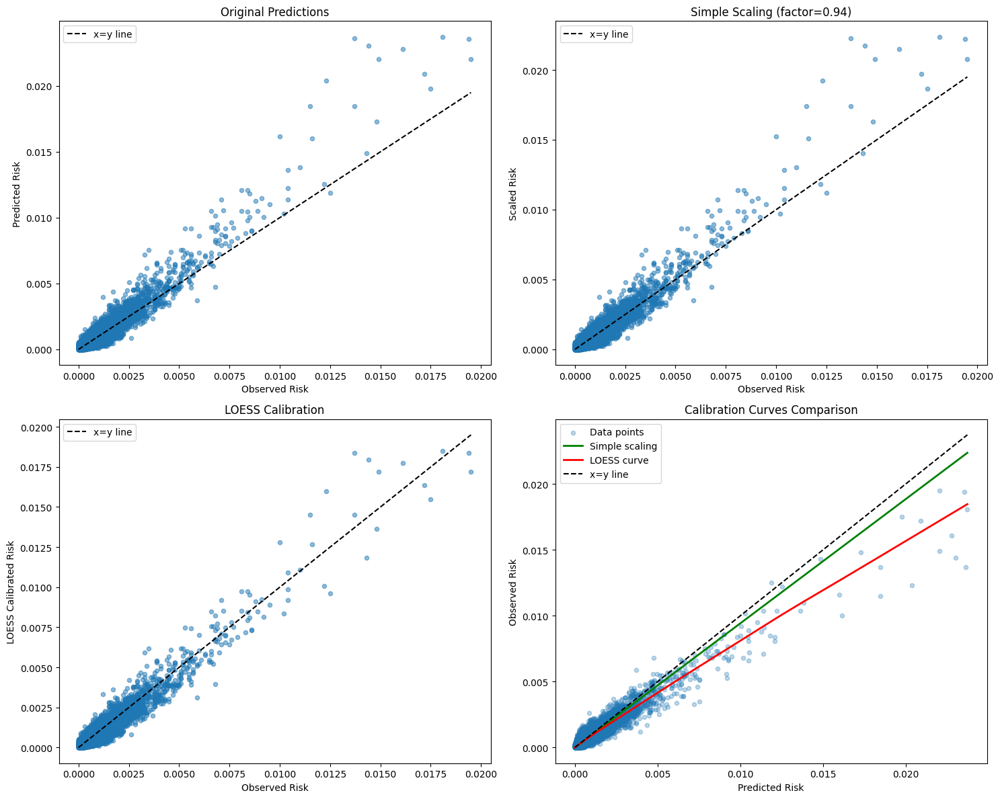


Performance Metrics:
Original R²: 0.867
Simple Scaling R²: 0.896
LOESS Calibrated R²: 0.927

Original RMSE: 0.000337
Simple Scaling RMSE: 0.000298
LOESS Calibrated RMSE: 0.000249


In [58]:

# Calculate both calibration methods
# Simple scaling
scale_factor = np.mean(observed_risk) / np.mean(predicted_risk)
print(scale_factor)
scaled_risk = predicted_risk * scale_factor

# LOESS calibration
loess_risk = lowess(observed_risk, predicted_risk, frac=0.3, return_sorted=False)

# Create comparison plots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))

# Original predictions
ax1.scatter(observed_risk, predicted_risk, alpha=0.5, s=20)
ax1.plot([0, max(observed_risk)], [0, max(observed_risk)], 'k--', label='x=y line')
ax1.set_title('Original Predictions')
ax1.set_xlabel('Observed Risk')
ax1.set_ylabel('Predicted Risk')
ax1.legend()

# Simple scaling calibration
ax2.scatter(observed_risk, scaled_risk, alpha=0.5, s=20)
ax2.plot([0, max(observed_risk)], [0, max(observed_risk)], 'k--', label='x=y line')
ax2.set_title(f'Simple Scaling (factor={scale_factor:.2f})')
ax2.set_xlabel('Observed Risk')
ax2.set_ylabel('Scaled Risk')
ax2.legend()

# LOESS calibration
ax3.scatter(observed_risk, loess_risk, alpha=0.5, s=20)
ax3.plot([0, max(observed_risk)], [0, max(observed_risk)], 'k--', label='x=y line')
ax3.set_title('LOESS Calibration')
ax3.set_xlabel('Observed Risk')
ax3.set_ylabel('LOESS Calibrated Risk')
ax3.legend()

# Calibration curves comparison
sort_idx = np.argsort(predicted_risk)
pred_sorted = predicted_risk[sort_idx]
obs_sorted = observed_risk[sort_idx]
smoothed = lowess(obs_sorted, pred_sorted, frac=0.3)

ax4.scatter(predicted_risk, observed_risk, alpha=0.3, s=20, label='Data points')
ax4.plot(pred_sorted, pred_sorted * scale_factor, 'g-', label='Simple scaling', linewidth=2)
ax4.plot(smoothed[:, 0], smoothed[:, 1], 'r-', label='LOESS curve', linewidth=2)
ax4.plot([0, max(predicted_risk)], [0, max(predicted_risk)], 'k--', label='x=y line')
ax4.set_title('Calibration Curves Comparison')
ax4.set_xlabel('Predicted Risk')
ax4.set_ylabel('Observed Risk')
ax4.legend()

plt.tight_layout()
plt.show()

# Print performance metrics
from sklearn.metrics import r2_score, mean_squared_error
print("\nPerformance Metrics:")
print(f"Original R²: {r2_score(observed_risk, predicted_risk):.3f}")
print(f"Simple Scaling R²: {r2_score(observed_risk, scaled_risk):.3f}")
print(f"LOESS Calibrated R²: {r2_score(observed_risk, loess_risk):.3f}")
print(f"\nOriginal RMSE: {np.sqrt(mean_squared_error(observed_risk, predicted_risk)):.6f}")
print(f"Simple Scaling RMSE: {np.sqrt(mean_squared_error(observed_risk, scaled_risk)):.6f}")
print(f"LOESS Calibrated RMSE: {np.sqrt(mean_squared_error(observed_risk, loess_risk)):.6f}")

Processing 40 batches...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/4141478551.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


Batch 0: 7448 patients, Model risk: 0.1137, PCE risk: 0.0878, Observed: 0.0794
Batch 1: 7509 patients, Model risk: 0.1136, PCE risk: 0.0884, Observed: 0.0851
Batch 2: 7560 patients, Model risk: 0.1131, PCE risk: 0.0877, Observed: 0.0823
Batch 3: 7451 patients, Model risk: 0.1167, PCE risk: 0.0884, Observed: 0.0886
Batch 4: 7406 patients, Model risk: 0.1198, PCE risk: 0.0875, Observed: 0.0941
Batch 5: 7487 patients, Model risk: 0.1140, PCE risk: 0.0878, Observed: 0.0831
Batch 6: 7393 patients, Model risk: 0.1174, PCE risk: 0.0891, Observed: 0.0847
Batch 7: 7508 patients, Model risk: 0.1154, PCE risk: 0.0890, Observed: 0.0866
Batch 8: 7553 patients, Model risk: 0.1176, PCE risk: 0.0895, Observed: 0.0886
Batch 9: 7470 patients, Model risk: 0.1145, PCE risk: 0.0873, Observed: 0.0829
Batch 10: 7496 patients, Model risk: 0.1147, PCE risk: 0.0887, Observed: 0.0820
Batch 11: 7500 patients, Model risk: 0.1162, PCE risk: 0.0889, Observed: 0.0853
Batch 12: 7513 patients, Model risk: 0.1189, PCE r

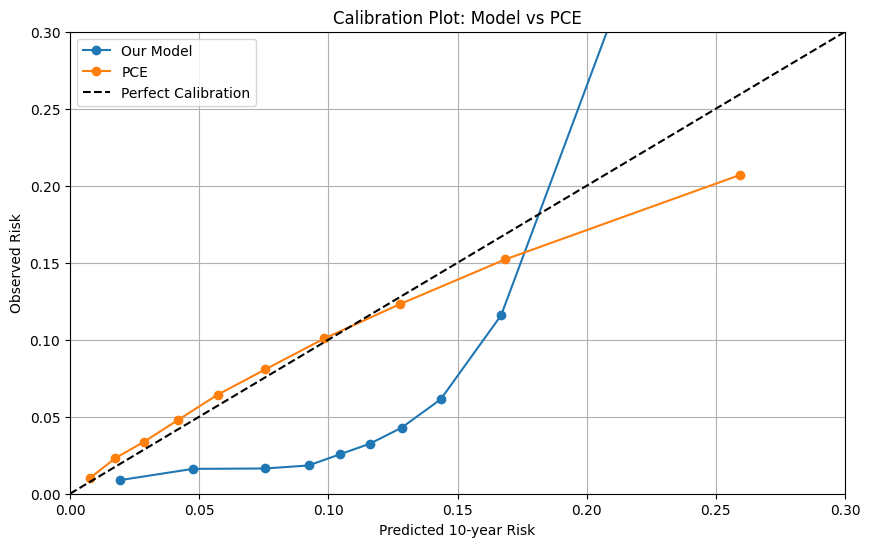

In [67]:
def plot_batch_by_batch_calibration(pce_df, batch_size=10000, ascvd_indices=[111,112,113,114,115,116], n_bins=10):
    """
    Create calibration plot by processing each batch separately and then combining results
    """
    # Storage for all batches
    all_model_risks = []
    all_actual_outcomes = []
    all_pce_risks = []
    
    n_batches = (len(pce_df) + batch_size - 1) // batch_size
    print(f"Processing {n_batches} batches...")
    
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            # Load model
            model = torch.load(model_path)
            phi_prob = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            theta = torch.softmax(model['model_state_dict']['lambda_'], dim=1).detach().numpy()
            kappa = model['model_state_dict']['kappa'].item()
            Y_batch = model['Y'].numpy()
            
            # Calculate predictions with kappa
            pi = np.einsum('nkt,kdt->ndt', theta, phi_prob) * kappa
            pi = np.clip(pi, 1e-8, 1-1e-8)
            
            # Get batch data
            batch_df = pce_df.iloc[start_idx:end_idx]
            
            # Process each patient in this batch
            batch_model_risks = []
            batch_actual_outcomes = []
            batch_pce_risks = []
            
            for i, row in enumerate(batch_df.itertuples()):
                if np.isnan(row.pce):
                    continue
                    
                age = row.age
                enroll_time = int(age - 30)
                if enroll_time < 0 or enroll_time + 10 >= Y_batch.shape[2]:
                    continue
                
                # Get ASCVD predictions
                pi_ascvd = pi[i, ascvd_indices, enroll_time:enroll_time+10]
                
                # Calculate 10-year risk
                survival_prob = np.prod(1 - pi_ascvd)
                ten_year_risk = 1 - survival_prob
                
                # Get actual outcome
                Y_ascvd = Y_batch[i, ascvd_indices, enroll_time:enroll_time+10]
                had_event = np.any(Y_ascvd)
                
                batch_model_risks.append(ten_year_risk)
                batch_actual_outcomes.append(had_event)
                batch_pce_risks.append(row.pce)
            
            # Add batch results to overall results
            all_model_risks.extend(batch_model_risks)
            all_actual_outcomes.extend(batch_actual_outcomes)
            all_pce_risks.extend(batch_pce_risks)
            
            # Print batch statistics
            if len(batch_model_risks) > 0:
                print(f"Batch {batch}: {len(batch_model_risks)} patients, " 
                      f"Model risk: {np.mean(batch_model_risks):.4f}, "
                      f"PCE risk: {np.mean(batch_pce_risks):.4f}, "
                      f"Observed: {np.mean(batch_actual_outcomes):.4f}")
            
        except FileNotFoundError:
            print(f"Warning: Could not find model file for batch {batch}")
            continue
    
    # Convert to arrays
    all_model_risks = np.array(all_model_risks)
    all_actual_outcomes = np.array(all_actual_outcomes)
    all_pce_risks = np.array(all_pce_risks)
    
    # Print overall statistics
    print("\nOverall Statistics:")
    print(f"Total patients: {len(all_model_risks)}")
    print(f"Mean model risk: {np.mean(all_model_risks):.4f}")
    print(f"Mean PCE risk: {np.mean(all_pce_risks):.4f}")
    print(f"Observed event rate: {np.mean(all_actual_outcomes):.4f}")
    
    # Create calibration plot
    plt.figure(figsize=(10, 6))
    
    # Function to calculate calibration curve using equal-sized bins
    def calculate_calibration(risks, outcomes):
        # Sort by risk
        sorted_idx = np.argsort(risks)
        sorted_risks = risks[sorted_idx]
        sorted_outcomes = outcomes[sorted_idx]
        
        # Create bins with equal number of patients
        bin_size = len(sorted_risks) // n_bins
        bin_pred = []
        bin_obs = []
        
        for i in range(n_bins):
            start = i * bin_size
            end = (i+1) * bin_size if i < n_bins-1 else len(sorted_risks)
            
            if end > start:
                bin_pred.append(np.mean(sorted_risks[start:end]))
                bin_obs.append(np.mean(sorted_outcomes[start:end]))
        
        return bin_pred, bin_obs
    
    # Calculate calibration curves
    model_pred, model_obs = calculate_calibration(all_model_risks, all_actual_outcomes)
    pce_pred, pce_obs = calculate_calibration(all_pce_risks, all_actual_outcomes)
    
    # Plot
    plt.plot(model_pred, model_obs, 'o-', label='Our Model')
    plt.plot(pce_pred, pce_obs, 'o-', label='PCE')
    plt.plot([0, 0.3], [0, 0.3], 'k--', label='Perfect Calibration')
    
    plt.xlabel('Predicted 10-year Risk')
    plt.ylabel('Observed Risk')
    plt.title('Calibration Plot: Model vs PCE')
    plt.legend()
    plt.grid(True)
    plt.xlim(0, 0.3)
    plt.ylim(0, 0.3)
    
    return all_model_risks, all_pce_risks, all_actual_outcomes

# Usage:
model_risks, pce_risks, outcomes = plot_batch_by_batch_calibration(pce_df)

First pass: calculating calibration factor...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/465268219.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


Yearly calibration factor: 0.8836
Mean yearly predicted risk: 0.0124
Mean yearly observed event rate: 0.0109

Second pass: applying calibration and calculating 10-year risks...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_2069/465268219.py:87: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)



Overall 10-year Statistics:
Total patients: 299741
Mean model 10-year risk: 0.1024
Mean PCE 10-year risk: 0.0883
Observed 10-year event rate: 0.0843


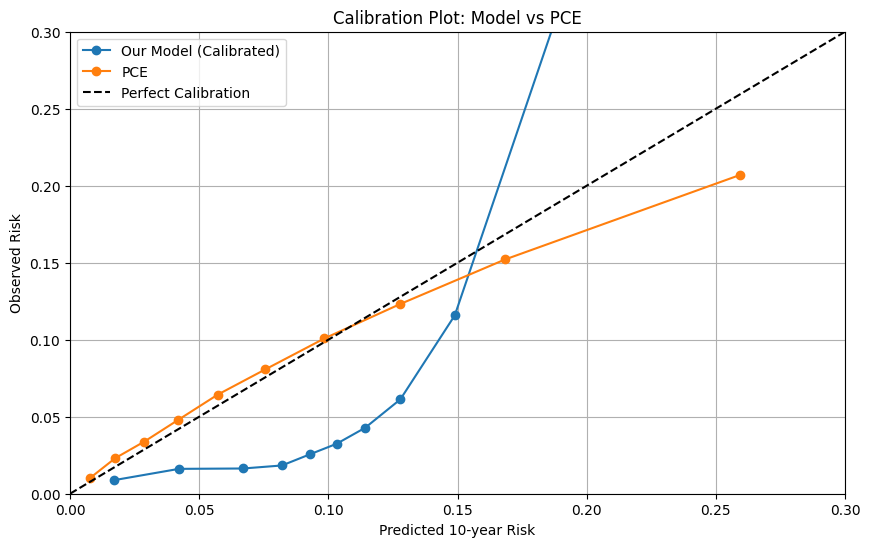

In [68]:
def plot_calibrated_batch_comparison(pce_df, batch_size=10000, ascvd_indices=[111,112,113,114,115,116], n_bins=10):
    """
    Create calibration plot with proper post-hoc calibration applied to pi values
    """
    # First, calculate the overall calibration factor
    all_predicted_risks = []
    all_observed_events = []
    
    # First pass to calculate calibration factor
    print("First pass: calculating calibration factor...")
    n_batches = (len(pce_df) + batch_size - 1) // batch_size
    
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            # Load model
            model = torch.load(model_path)
            phi_prob = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            theta = torch.softmax(model['model_state_dict']['lambda_'], dim=1).detach().numpy()
            kappa = model['model_state_dict']['kappa'].item()
            Y_batch = model['Y'].numpy()
            
            # Calculate predictions with kappa
            pi = np.einsum('nkt,kdt->ndt', theta, phi_prob) * kappa
            pi = np.clip(pi, 1e-8, 1-1e-8)
            
            # Get batch data
            batch_df = pce_df.iloc[start_idx:end_idx]
            
            # Process each patient in this batch
            for i, row in enumerate(batch_df.itertuples()):
                if np.isnan(row.pce):
                    continue
                    
                age = row.age
                enroll_time = int(age - 30)
                if enroll_time < 0 or enroll_time + 10 >= Y_batch.shape[2]:
                    continue
                
                # Get ASCVD predictions
                pi_ascvd = pi[i, ascvd_indices, enroll_time:enroll_time+10]
                
                # Calculate yearly risks
                yearly_risks = 1 - np.prod(1 - pi_ascvd, axis=0)
                
                # Add to collection for calibration
                all_predicted_risks.extend(yearly_risks)
                
                # Get actual yearly outcomes
                for year in range(10):
                    if enroll_time + year < Y_batch.shape[2]:
                        had_event = np.any(Y_batch[i, ascvd_indices, enroll_time + year])
                        all_observed_events.append(had_event)
            
        except FileNotFoundError:
            continue
    
    # Calculate calibration factor
    all_predicted_risks = np.array(all_predicted_risks)
    all_observed_events = np.array(all_observed_events)
    
    mean_predicted = np.mean(all_predicted_risks)
    mean_observed = np.mean(all_observed_events)
    calibration_factor = mean_observed / mean_predicted
    
    print(f"Yearly calibration factor: {calibration_factor:.4f}")
    print(f"Mean yearly predicted risk: {mean_predicted:.4f}")
    print(f"Mean yearly observed event rate: {mean_observed:.4f}")
    
    # Second pass to apply calibration and calculate 10-year risks
    print("\nSecond pass: applying calibration and calculating 10-year risks...")
    
    all_model_risks = []
    all_actual_outcomes = []
    all_pce_risks = []
    
    for batch in range(n_batches):
        start_idx = batch * batch_size
        end_idx = min((batch + 1) * batch_size, len(pce_df))
        model_path = f'/Users/sarahurbut/Dropbox/resultshighamp/results/output_{start_idx}_{end_idx}/model.pt'
        
        try:
            # Load model
            model = torch.load(model_path)
            phi_prob = torch.sigmoid(model['model_state_dict']['phi']).detach().numpy()
            theta = torch.softmax(model['model_state_dict']['lambda_'], dim=1).detach().numpy()
            kappa = model['model_state_dict']['kappa'].item()
            Y_batch = model['Y'].numpy()
            
            # Calculate predictions with kappa
            pi = np.einsum('nkt,kdt->ndt', theta, phi_prob) * kappa
            pi = np.clip(pi, 1e-8, 1-1e-8)
            
            # Apply calibration factor
            pi_calibrated = pi * calibration_factor
            pi_calibrated = np.clip(pi_calibrated, 1e-8, 1-1e-8)
            
            # Get batch data
            batch_df = pce_df.iloc[start_idx:end_idx]
            
            # Process each patient in this batch
            batch_model_risks = []
            batch_actual_outcomes = []
            batch_pce_risks = []
            
            for i, row in enumerate(batch_df.itertuples()):
                if np.isnan(row.pce):
                    continue
                    
                age = row.age
                enroll_time = int(age - 30)
                if enroll_time < 0 or enroll_time + 10 >= Y_batch.shape[2]:
                    continue
                
                # Get calibrated ASCVD predictions
                pi_ascvd = pi_calibrated[i, ascvd_indices, enroll_time:enroll_time+10]
                
                # Calculate 10-year risk
                survival_prob = np.prod(1 - pi_ascvd)
                ten_year_risk = 1 - survival_prob
                
                # Get actual outcome
                Y_ascvd = Y_batch[i, ascvd_indices, enroll_time:enroll_time+10]
                had_event = np.any(Y_ascvd)
                
                batch_model_risks.append(ten_year_risk)
                batch_actual_outcomes.append(had_event)
                batch_pce_risks.append(row.pce)
            
            # Add batch results to overall results
            all_model_risks.extend(batch_model_risks)
            all_actual_outcomes.extend(batch_actual_outcomes)
            all_pce_risks.extend(batch_pce_risks)
            
        except FileNotFoundError:
            continue
    
    # Convert to arrays
    all_model_risks = np.array(all_model_risks)
    all_actual_outcomes = np.array(all_actual_outcomes)
    all_pce_risks = np.array(all_pce_risks)
    
    # Print overall statistics
    print("\nOverall 10-year Statistics:")
    print(f"Total patients: {len(all_model_risks)}")
    print(f"Mean model 10-year risk: {np.mean(all_model_risks):.4f}")
    print(f"Mean PCE 10-year risk: {np.mean(all_pce_risks):.4f}")
    print(f"Observed 10-year event rate: {np.mean(all_actual_outcomes):.4f}")
    
    # Create calibration plot
    plt.figure(figsize=(10, 6))
    
    # Function to calculate calibration curve using equal-sized bins
    def calculate_calibration(risks, outcomes):
        # Sort by risk
        sorted_idx = np.argsort(risks)
        sorted_risks = risks[sorted_idx]
        sorted_outcomes = outcomes[sorted_idx]
        
        # Create bins with equal number of patients
        bin_size = len(sorted_risks) // n_bins
        bin_pred = []
        bin_obs = []
        
        for i in range(n_bins):
            start = i * bin_size
            end = (i+1) * bin_size if i < n_bins-1 else len(sorted_risks)
            
            if end > start:
                bin_pred.append(np.mean(sorted_risks[start:end]))
                bin_obs.append(np.mean(sorted_outcomes[start:end]))
        
        return bin_pred, bin_obs
    
    # Calculate calibration curves
    model_pred, model_obs = calculate_calibration(all_model_risks, all_actual_outcomes)
    pce_pred, pce_obs = calculate_calibration(all_pce_risks, all_actual_outcomes)
    
    # Plot
    plt.plot(model_pred, model_obs, 'o-', label='Our Model (Calibrated)')
    plt.plot(pce_pred, pce_obs, 'o-', label='PCE')
    plt.plot([0, 0.3], [0, 0.3], 'k--', label='Perfect Calibration')
    
    plt.xlabel('Predicted 10-year Risk')
    plt.ylabel('Observed Risk')
    plt.title('Calibration Plot: Model vs PCE')
    plt.legend()
    plt.grid(True)
    plt.xlim(0, 0.3)
    plt.ylim(0, 0.3)
    
    return all_model_risks, all_pce_risks, all_actual_outcomes, calibration_factor

# Usage:
model_risks, pce_risks, outcomes, calib_factor = plot_calibrated_batch_comparison(pce_df)

In [57]:
essentials['prevalence_t']

array([[1.69567120e-05, 1.75893347e-05, 1.88782979e-05, ...,
        1.08835455e-04, 1.04374347e-04, 1.02135520e-04],
       [2.68736881e-06, 2.85423562e-06, 3.20238269e-06, ...,
        1.18538810e-04, 1.14539289e-04, 1.12490707e-04],
       [2.97181600e-07, 3.30504719e-07, 4.04821947e-07, ...,
        3.29991919e-04, 3.24798864e-04, 3.22023610e-04],
       ...,
       [1.33744152e-05, 1.37726638e-05, 1.45833792e-05, ...,
        5.58665721e-04, 5.51545003e-04, 5.47744974e-04],
       [1.67175514e-07, 1.90169047e-07, 2.43914428e-07, ...,
        1.23406190e-03, 1.21272355e-03, 1.20137166e-03],
       [1.02264755e-06, 1.13695830e-06, 1.39220663e-06, ...,
        1.37426832e-04, 1.29557186e-04, 1.25660023e-04]])


Patient 3802 (diagnosed at time 25):
Genetic effects - Mean: -0.000, Std: 0.100

Top states and average proportions:
State 7: 0.169
State 3: 0.136
State 17: 0.099
State 16: 0.087
State 8: 0.080

Patient 562 (diagnosed at time 20):
Genetic effects - Mean: 0.035, Std: 0.130

Top states and average proportions:
State 3: 0.143
State 16: 0.126
State 7: 0.121
State 8: 0.083
State 17: 0.082

Patient 9891 (diagnosed at time 23):
Genetic effects - Mean: -0.007, Std: 0.097

Top states and average proportions:
State 3: 0.175
State 7: 0.125
State 2: 0.090
State 1: 0.085
State 16: 0.082


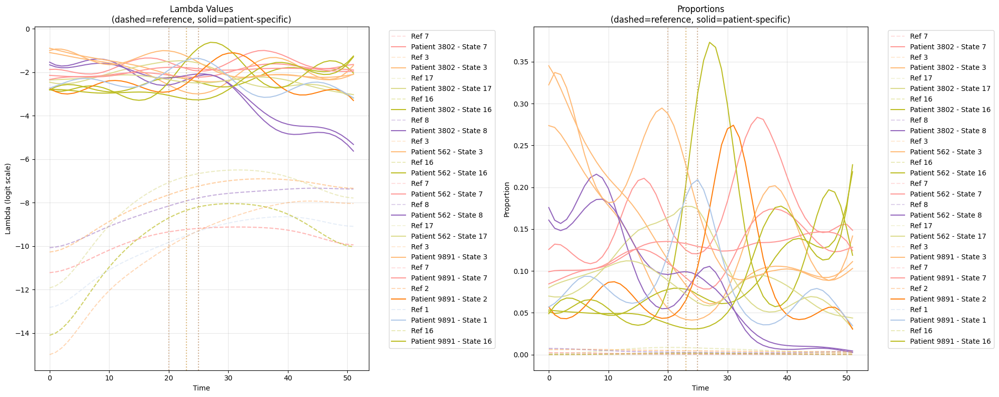

In [77]:
def analyze_patient_trajectories(model, disease_index, n_patients=3, n_top_states=5):
    """
    Analyze trajectories for specific disease patients compared to reference
    """
    # Find patients with the disease
    disease_patients = []
    diagnosis_times = []
    for p in range(model.Y.shape[0]):
        if torch.any(model.Y[p, disease_index]):
            disease_patients.append(p)
            diag_time = torch.where(model.Y[p, disease_index])[0][0].item()
            diagnosis_times.append(diag_time)
    
    # Sample a few patients
    if len(disease_patients) > n_patients:
        sample_indices = np.random.choice(len(disease_patients), n_patients, replace=False)
        sample_patients = [disease_patients[i] for i in sample_indices]
        sample_diagnoses = [diagnosis_times[i] for i in sample_indices]
    else:
        sample_patients = disease_patients
        sample_diagnoses = diagnosis_times
    
    # Create plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    time_points = np.arange(model.T)
    
    # Get reference trajectories
    signature_refs = model.logit_prev_t.detach()  # [K, T]
    
    # Get dominant states for these patients
    lambda_patients = model.lambda_[sample_patients].detach()  # [n_patients, K, T]
    patient_props = torch.softmax(lambda_patients, dim=1)  # [n_patients, K, T]
    mean_props = patient_props.mean(dim=-1)  # Average over time, now [n_patients, K]
    top_states = mean_props.topk(n_top_states, dim=-1).indices
    
    # Color map
    colors = plt.cm.tab20(np.linspace(0, 1, model.K))
    
    # Plot for each patient
    for i, (patient, diag_time) in enumerate(zip(sample_patients, sample_diagnoses)):
        print(f"\nPatient {patient} (diagnosed at time {diag_time}):")
        
        for j, k in enumerate(top_states[i]):
            k = k.item()
            color = colors[k]
            
            # Plot lambda values
            ax1.plot(time_points, signature_refs[k], '--', color=color, alpha=0.3,
                    label=f'Ref {k}')
            ax1.plot(time_points, model.lambda_[patient, k].detach(), '-', color=color,
                    label=f'Patient {patient} - State {k}')
            
            # Plot proportions
            ref_props = torch.softmax(signature_refs, dim=0)[k]
            patient_props = torch.softmax(model.lambda_[patient].detach(), dim=0)[k]
            ax2.plot(time_points, ref_props, '--', color=color, alpha=0.3,
                    label=f'Ref {k}')
            ax2.plot(time_points, patient_props, '-', color=color,
                    label=f'Patient {patient} - State {k}')
            
            # Add vertical line for diagnosis
            ax1.axvline(x=diag_time, color=color, linestyle=':', alpha=0.3)
            ax2.axvline(x=diag_time, color=color, linestyle=':', alpha=0.3)
        
        # Print genetic effects
        genetic_effects = model.genetic_scale * (model.G[patient] @ model.gamma).detach()
        print(f"Genetic effects - Mean: {genetic_effects.mean():.3f}, Std: {genetic_effects.std():.3f}")
        
        # Print top states and proportions
        patient_mean_props = mean_props[i]
        top_props, top_indices = patient_mean_props.topk(n_top_states)
        print("\nTop states and average proportions:")
        for state, prop in zip(top_indices, top_props):
            print(f"State {state.item()}: {prop:.3f}")
    
    # Customize plots
    ax1.set_title('Lambda Values\n(dashed=reference, solid=patient-specific)')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Lambda (logit scale)')
    ax1.grid(True, alpha=0.3)
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    ax2.set_title('Proportions\n(dashed=reference, solid=patient-specific)')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Proportion')
    ax2.grid(True, alpha=0.3)
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Run the analysis for breast cancer patients
analyze_patient_trajectories(model, disease_index=17, n_patients=3)

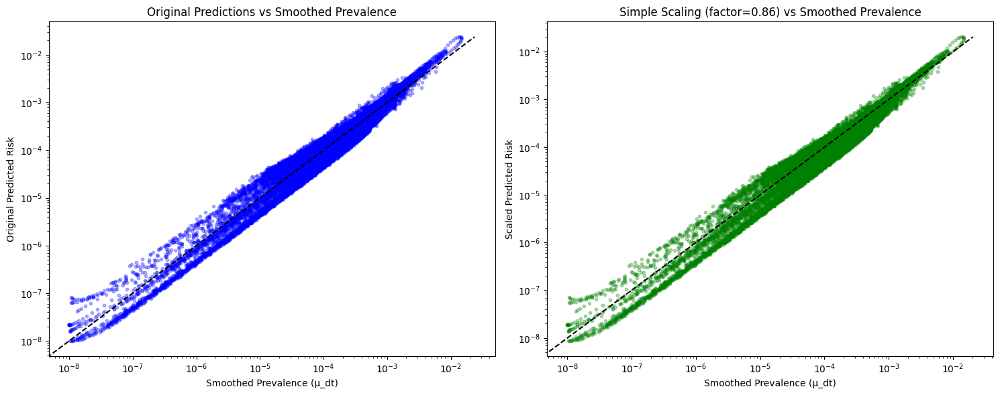

In [56]:
# Get μ_dt from checkpoint and predictions

mu_dt = essentials['prevalence_t'] # Shape: (348, 52)
scale_factor = np.mean(mu_dt) / np.mean(predicted_risk_2d)
scaled_risk_2d = predicted_risk_2d * scale_factor

# Create two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Original predictions vs μ_dt
ax1.scatter(mu_dt.flatten(), predicted_risk_2d.flatten(), 
           alpha=0.3, color='blue', s=10)
ax1.plot([0, max(mu_dt.max(), predicted_risk_2d.max())], 
         [0, max(mu_dt.max(), predicted_risk_2d.max())], 
         'k--', label='x=y')
ax1.set_xlabel('Smoothed Prevalence (μ_dt)')
ax1.set_ylabel('Original Predicted Risk')
ax1.set_title('Original Predictions vs Smoothed Prevalence')
ax1.set_xscale('log')
ax1.set_yscale('log')

# Scaled predictions vs μ_dt
ax2.scatter(mu_dt.flatten(), scaled_risk_2d.flatten(), 
           alpha=0.3, color='green', s=10)
ax2.plot([0, max(mu_dt.max(), scaled_risk_2d.max())], 
         [0, max(mu_dt.max(), scaled_risk_2d.max())], 
         'k--', label='x=y')
ax2.set_xlabel('Smoothed Prevalence (μ_dt)')
ax2.set_ylabel('Scaled Predicted Risk')
ax2.set_title(f'Simple Scaling (factor={scale_factor:.2f}) vs Smoothed Prevalence')
ax2.set_xscale('log')
ax2.set_yscale('log')

plt.tight_layout()
plt.show()

In [15]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy import stats

# Rest of the code remains the same...

In [20]:
# Find indices for specific conditions
def find_disease_indices(disease_names, target_conditions):
    """
    Find indices of specific conditions in the disease_names list
    
    Parameters:
    - disease_names: list of all disease names
    - target_conditions: list of conditions to find
    
    Returns: dictionary mapping condition names to their indices
    """
    indices = {}
    for condition in target_conditions:
        matches = [i for i, name in enumerate(disease_names) if condition.lower() in name.lower()]
        if matches:
            print(f"Found {condition} at index {matches[0]}: {disease_names[matches[0]]}")
            indices[condition] = matches[0]
        else:
            print(f"Warning: Could not find {condition}")
    return indices

# Search for your conditions
target_conditions = ['Myocardial infarction', 'Lung', 'Major depressive disorder']
condition_indices = find_disease_indices(essentials['disease_names'], target_conditions)

# Print all matches (in case there are multiple relevant terms)
print("\nAll related terms:")
for condition in target_conditions:
    print(f"\nSearching for {condition}:")
    for i, name in enumerate(essentials['disease_names']):
        if condition.lower() in name.lower():
            print(f"Index {i}: {name}")

Found Myocardial infarction at index 112: Myocardial infarction
Found Lung at index 13: Cancer of bronchus; lung
Found Major depressive disorder at index 66: Major depressive disorder

All related terms:

Searching for Myocardial infarction:
Index 112: Myocardial infarction

Searching for Lung:
Index 13: Cancer of bronchus; lung

Searching for Major depressive disorder:
Index 66: Major depressive disorder


In [13]:
checkpoint=torch.load('/Users/sarahurbut/Dropbox (Personal)/model_with_kappa_bigam.pt')
model.load_state_dict(checkpoint['model_state_dict'])

# If you're doing inference, set to eval mode
model.eval()

/var/folders/2f/nxrbr3pn1msgrl4ffyj33zd00000gn/T/ipykernel_86772/2810526467.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint=torch.load('/Users/sarahurbut/Drop

AladynSurvivalFixedKernelsAvgLoss_clust_logitInit_psitest()

AladynSurvivalFixedKernelsAvgLoss_clust_logitInit_psitest()


Analyzing 635 patients with Coronary atherosclerosis

Analyzing 142 patients with Lung Cancer

Analyzing 723 patients with Depression

Velocity Comparisons:

Coronary atherosclerosis vs Lung Cancer:
Mean velocities: 0.003 vs 0.003
T-statistic: 5.357
P-value: 0.000

Coronary atherosclerosis vs Depression:
Mean velocities: 0.003 vs 0.003
T-statistic: 4.067
P-value: 0.000

Depression vs Lung Cancer:
Mean velocities: 0.003 vs 0.003
T-statistic: 3.158
P-value: 0.002


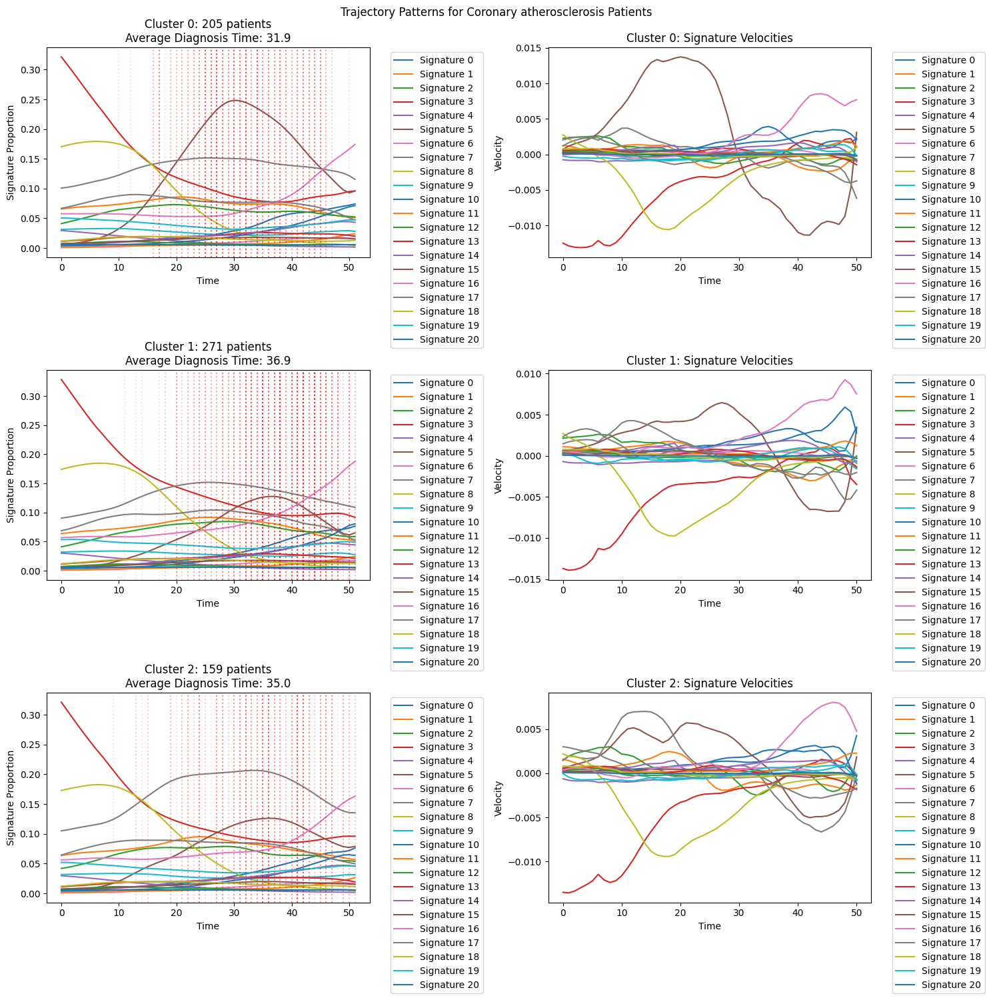

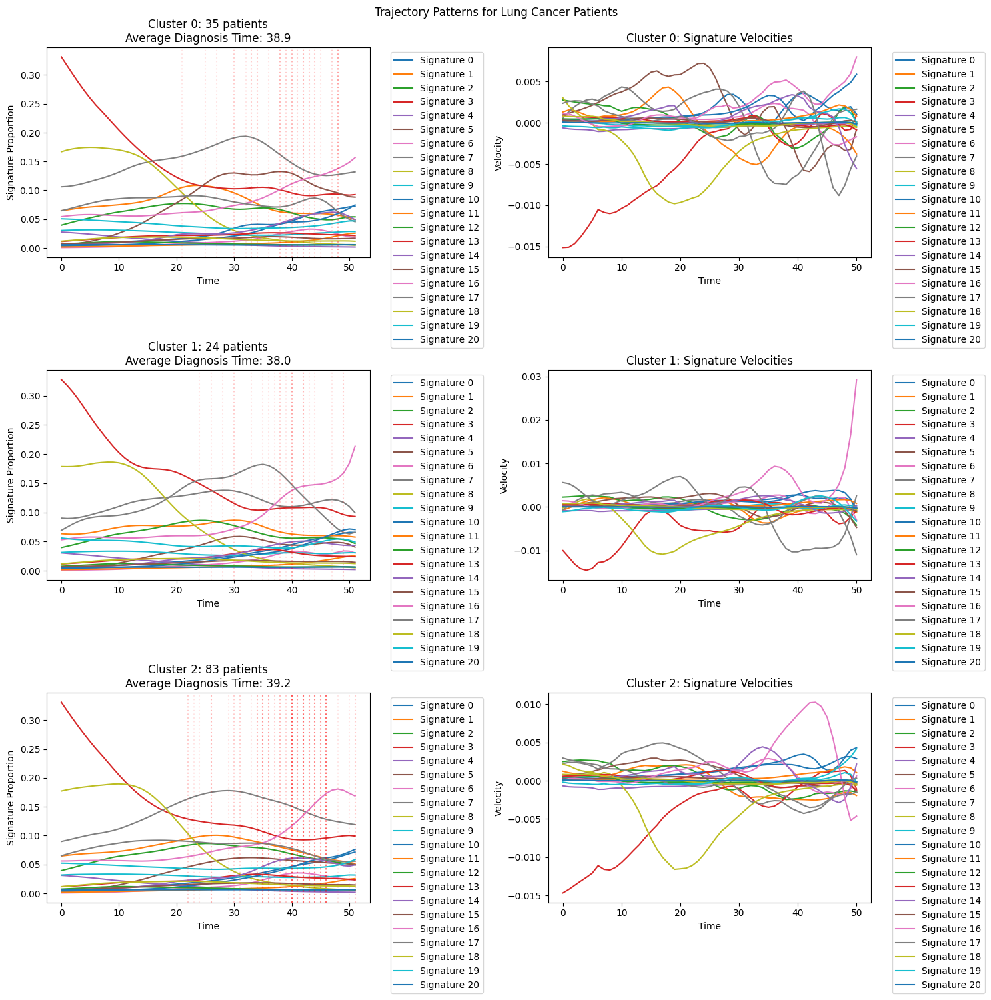

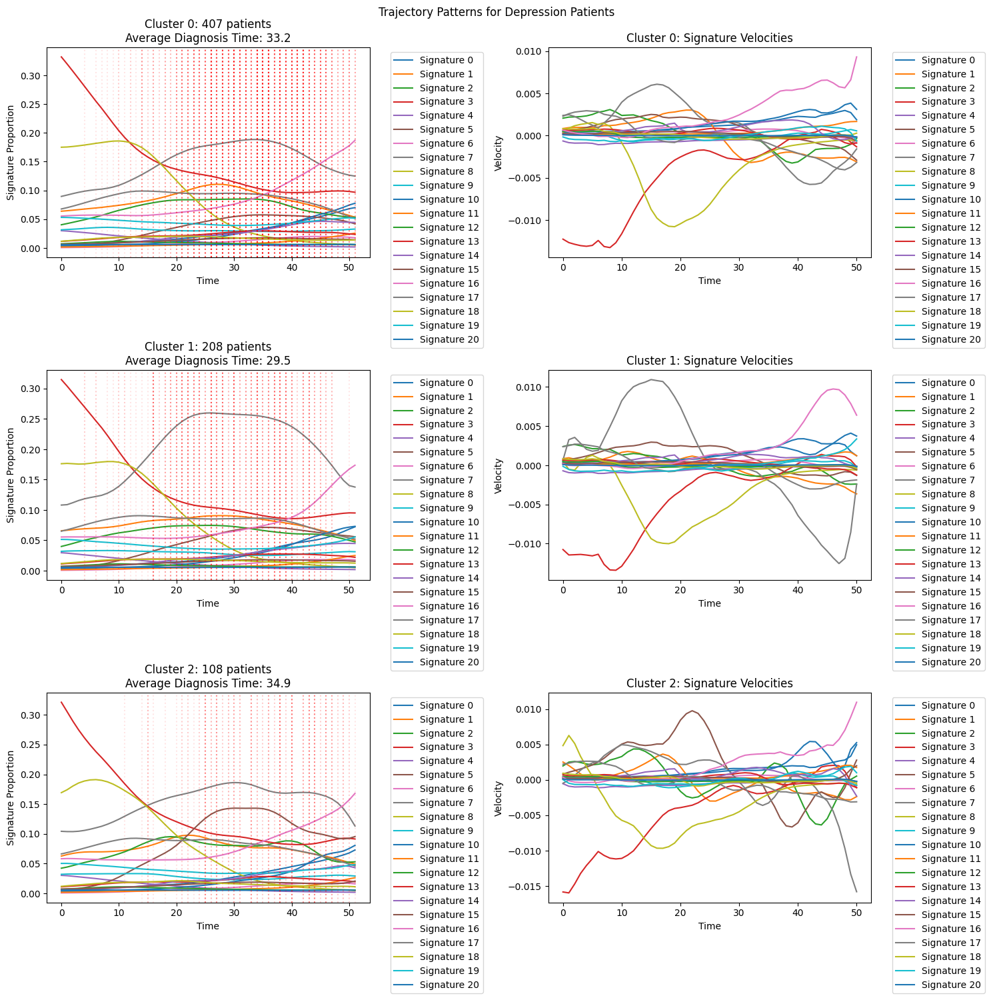

In [16]:
def analyze_condition_trajectories(model, condition_name, condition_idx, n_clusters=3):
    """
    Analyze trajectory patterns for patients with a specific condition
    
    Parameters:
    - model: your model object
    - condition_name: name of the condition (for plotting)
    - condition_idx: index of the condition in model.Y
    - n_clusters: number of clusters to use
    """
    # Find patients with this condition
    patients_with_condition = []
    diagnosis_times = []
    
    for p in range(model.Y.shape[0]):
        if torch.any(model.Y[p, condition_idx]):
            patients_with_condition.append(p)
            # Get diagnosis time
            diag_time = torch.where(model.Y[p, condition_idx])[0][0].item()
            diagnosis_times.append(diag_time)
    
    print(f"\nAnalyzing {len(patients_with_condition)} patients with {condition_name}")
    
    # Get features for clustering (using signature proportions)
    patient_features = []
    for p in patients_with_condition:
        props = torch.softmax(model.lambda_[p], dim=0)  # [K, T]
        mean_props = props.mean(dim=1)  # Average over time
        patient_features.append(mean_props.detach().numpy())
    
    # Cluster patients
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    clusters = kmeans.fit_predict(np.array(patient_features))
    
    # Visualize clusters
    fig, axes = plt.subplots(n_clusters, 2, figsize=(15, 5*n_clusters))
    fig.suptitle(f'Trajectory Patterns for {condition_name} Patients')
    
    for cluster_idx in range(n_clusters):
        # Get patients in this cluster
        cluster_patients = [p for i, p in enumerate(patients_with_condition) 
                          if clusters[i] == cluster_idx]
        cluster_diag_times = [t for i, t in enumerate(diagnosis_times) 
                            if clusters[i] == cluster_idx]
        
        # Calculate average trajectories and velocities
        all_props = []
        all_velocities = []
        
        for p in cluster_patients:
            props = torch.softmax(model.lambda_[p], dim=0)
            all_props.append(props.detach().numpy())
            
            # Calculate velocity
            velocity = torch.diff(props, dim=1)
            all_velocities.append(velocity.detach().numpy())
        
        mean_props = np.mean(all_props, axis=0)
        mean_vel = np.mean(all_velocities, axis=0)
        
        # Plot proportions
        ax = axes[cluster_idx, 0]
        for k in range(mean_props.shape[0]):
            ax.plot(mean_props[k], label=f'Signature {k}')
        
        # Add vertical lines for diagnosis times
        for t in cluster_diag_times:
            ax.axvline(x=t, color='red', alpha=0.1, linestyle=':')
        
        ax.set_title(f'Cluster {cluster_idx}: {len(cluster_patients)} patients\nAverage Diagnosis Time: {np.mean(cluster_diag_times):.1f}')
        ax.set_xlabel('Time')
        ax.set_ylabel('Signature Proportion')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        
        # Plot velocities
        ax = axes[cluster_idx, 1]
        for k in range(mean_vel.shape[0]):
            ax.plot(mean_vel[k], label=f'Signature {k}')
        ax.set_title(f'Cluster {cluster_idx}: Signature Velocities')
        ax.set_xlabel('Time')
        ax.set_ylabel('Velocity')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    return {
        'patients': patients_with_condition,
        'clusters': clusters,
        'diagnosis_times': diagnosis_times,
        'figure': fig
    }

# Example usage:
conditions = {
    'Coronary atherosclerosis': 112,  # Replace with actual index
    'Lung Cancer':13 ,  # Replace with actual index
    'Depression': 66  # Replace with actual index
}

# Analyze each condition separately
results = {}
for condition_name, condition_idx in conditions.items():
    results[condition_name] = analyze_condition_trajectories(model, condition_name, condition_idx)

# Compare velocities between conditions
def compare_condition_velocities(model, results):
    """
    Compare how rapidly signatures change between different conditions
    """
    print("\nVelocity Comparisons:")
    for cond1 in results:
        for cond2 in results:
            if cond1 >= cond2:
                continue
                
            vel1 = []
            vel2 = []
            
            # Calculate average velocities for condition 1
            for p in results[cond1]['patients']:
                props = torch.softmax(model.lambda_[p], dim=0)
                vel = torch.diff(props, dim=1)
                vel1.append(torch.abs(vel).mean().item())
            
            # Calculate average velocities for condition 2
            for p in results[cond2]['patients']:
                props = torch.softmax(model.lambda_[p], dim=0)
                vel = torch.diff(props, dim=1)
                vel2.append(torch.abs(vel).mean().item())
            
            # Perform statistical test
            from scipy import stats
            t_stat, p_val = stats.ttest_ind(vel1, vel2)
            
            print(f"\n{cond1} vs {cond2}:")
            print(f"Mean velocities: {np.mean(vel1):.3f} vs {np.mean(vel2):.3f}")
            print(f"T-statistic: {t_stat:.3f}")
            print(f"P-value: {p_val:.3f}")

# Compare velocities
compare_condition_velocities(model, results)


Dominant Signatures Analysis:
--------------------------------------------------

Disease: Myocardial infarction (index 112)
Dominant signature: 5 (psi value: -1.085)
Top 3 signatures:
  Signature 5: -1.085
  Signature 4: -1.915
  Signature 15: -1.935

Disease: Lung (index 13)
Dominant signature: 6 (psi value: 0.528)
Top 3 signatures:
  Signature 6: 0.528
  Signature 4: -1.928
  Signature 11: -2.014

Disease: Major depressive disorder (index 66)
Dominant signature: 7 (psi value: -0.371)
Top 3 signatures:
  Signature 7: -0.371
  Signature 17: -1.918
  Signature 14: -1.926


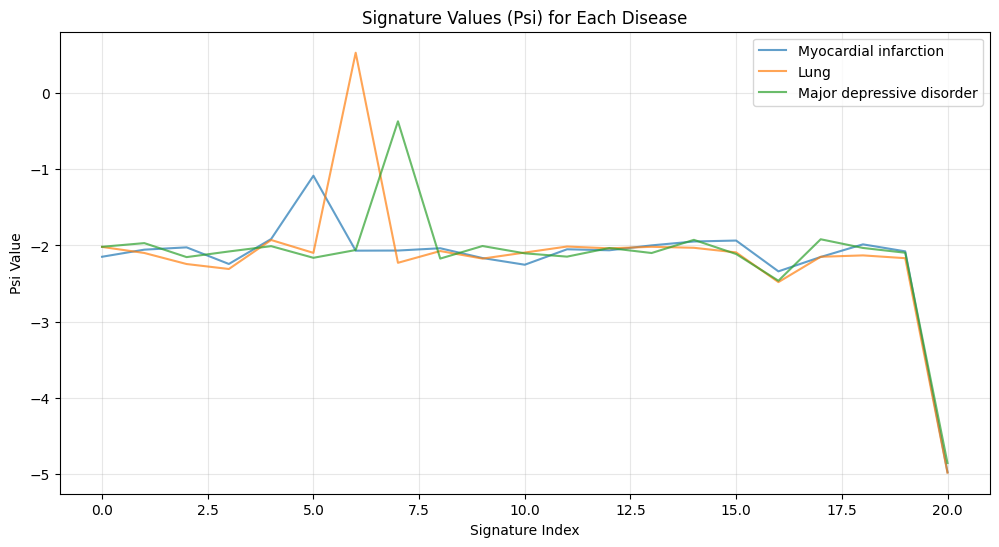

In [30]:
def find_dominant_signatures(model, disease_indices, disease_names):
    """
    Find dominant signatures for specified diseases using psi matrix
    
    Parameters:
    - model: your model with psi matrix
    - disease_indices: dictionary of disease names and their indices
    - disease_names: list of all disease names for reference
    """
    print("\nDominant Signatures Analysis:")
    print("-" * 50)
    
    results = {}
    for disease, idx in disease_indices.items():
        # Get psi values for this disease
        psi_disease = model.psi[:, idx]
        
        # Find dominant signature
        dom_sig_idx = psi_disease.argmax()
        dom_sig_value = psi_disease.max()
        
        # Get top 3 signatures
        top_values, top_indices = torch.topk(psi_disease, k=3)
        
        print(f"\nDisease: {disease} (index {idx})")
        print(f"Dominant signature: {dom_sig_idx} (psi value: {dom_sig_value:.3f})")
        print("Top 3 signatures:")
        for sig_idx, value in zip(top_indices, top_values):
            print(f"  Signature {sig_idx}: {value:.3f}")
        
        results[disease] = {
            'dominant_signature': dom_sig_idx.item(),
            'dominant_value': dom_sig_value.item(),
            'top_signatures': list(zip(top_indices.tolist(), top_values.tolist()))
        }
    
    return results

# Use the function
dominant_sigs = find_dominant_signatures(model, condition_indices, essentials['disease_names'])

# Optional: Create a visualization of the psi values for these diseases
def plot_disease_signatures(model, disease_indices, disease_names):
    plt.figure(figsize=(12, 6))
    
    for disease, idx in disease_indices.items():
        psi_values = model.psi[:, idx].detach().numpy()
        plt.plot(psi_values, label=disease, alpha=0.7)
    
    plt.title('Signature Values (Psi) for Each Disease')
    plt.xlabel('Signature Index')
    plt.ylabel('Psi Value')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

# Create the plot
plot_disease_signatures(model, condition_indices, essentials['disease_names'])

In [31]:
model.Y.shape

torch.Size([10000, 348, 52])

In [ ]:
def plot_group_trajectories(model, patient_indices, ax_prop, ax_vel, title):
    """
    Plot average trajectories and velocities for a group of patients
    Ages run from 30-80 (51 time points)
    """
    # Get average trajectories
    all_props = []
    all_velocities = []
    diagnosis_times = []
    
    for p in patient_indices:
        props = torch.softmax(model.lambda_[p], dim=0)  # [K, T]
        all_props.append(props.detach().numpy())
        
        velocity = torch.diff(props, dim=1)  # [K, T-1]
        all_velocities.append(velocity.detach().numpy())
        
        # Get diagnosis time
        diag_time = torch.where(model.Y[p, 112])[0][0].item()
        diagnosis_times.append(diag_time)
    
    mean_props = np.mean(all_props, axis=0)  # Average across patients
    mean_vel = np.mean(all_velocities, axis=0)
    mean_diag_time = np.mean(diagnosis_times)
    
    # Plot proportions
    time_points = np.arange(30, 81)  # Ages 30-80
    for k in range(mean_props.shape[0]):
        ax_prop.plot(time_points, mean_props[k], label=f'Signature {k}')
    
    ax_prop.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                   label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_prop.set_title(f'{title}\nProportions')
    ax_prop.set_xlabel('Age')
    ax_prop.set_ylabel('Average Signature Loading')
    ax_prop.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_prop.grid(True, alpha=0.3)
    
    # Plot velocities
    vel_time_points = np.arange(30, 80)  # One fewer point for velocities
    for k in range(mean_vel.shape[0]):
        ax_vel.plot(vel_time_points, mean_vel[k], label=f'Signature {k}')
    
    ax_vel.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                  label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_vel.set_title(f'{title}\nVelocities')
    ax_vel.set_xlabel('Age')
    ax_vel.set_ylabel('Velocity')
    ax_vel.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_vel.grid(True, alpha=0.3)
    
    # Add std error bands for key signatures
    # Get the top 5 signatures by maximum proportion
    top_sigs = np.argsort(np.max(mean_props, axis=1))[-5:]
    
    for k in top_sigs:
        # Calculate standard error for proportions
        props_std = np.std([p[k] for p in all_props], axis=0)
        props_se = props_std / np.sqrt(len(all_props))
        ax_prop.fill_between(time_points, 
                           mean_props[k] - props_se,
                           mean_props[k] + props_se,
                           alpha=0.1)
        
        # Calculate standard error for velocities
        vel_std = np.std([v[k] for v in all_velocities], axis=0)
        vel_se = vel_std / np.sqrt(len(all_velocities))
        ax_vel.fill_between(vel_time_points,
                          mean_vel[k] - vel_se,
                          mean_vel[k] + vel_se,
                          alpha=0.1)

In [34]:
def plot_group_trajectories(model, patient_indices, ax_prop, ax_vel, title):
    """
    Plot average trajectories and velocities for a group of patients
    Ages run from 30-80 (51 time points)
    """
    # Get average trajectories
    all_props = []
    all_velocities = []
    diagnosis_times = []
    
    for p in patient_indices:
        props = torch.softmax(model.lambda_[p], dim=0)  # [K, T]
        all_props.append(props.detach().numpy())
        
        velocity = torch.diff(props, dim=1)  # [K, T-1]
        all_velocities.append(velocity.detach().numpy())
        
        # Get diagnosis time
        diag_time = torch.where(model.Y[p, 112])[0][0].item()
        diagnosis_times.append(diag_time)
    
    mean_props = np.mean(all_props, axis=0)  # Average across patients
    mean_vel = np.mean(all_velocities, axis=0)
    mean_diag_time = np.mean(diagnosis_times)
    
    # Plot proportions
    time_points = np.arange(30, 81)  # Ages 30-80
    for k in range(mean_props.shape[0]):
        ax_prop.plot(time_points, mean_props[k], label=f'Signature {k}')
    
    ax_prop.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                   label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_prop.set_title(f'{title}\nProportions')
    ax_prop.set_xlabel('Age')
    ax_prop.set_ylabel('Average Signature Loading')
    ax_prop.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_prop.grid(True, alpha=0.3)
    
    # Plot velocities
    vel_time_points = np.arange(30, 80)  # One fewer point for velocities
    for k in range(mean_vel.shape[0]):
        ax_vel.plot(vel_time_points, mean_vel[k], label=f'Signature {k}')
    
    ax_vel.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                  label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_vel.set_title(f'{title}\nVelocities')
    ax_vel.set_xlabel('Age')
    ax_vel.set_ylabel('Velocity')
    ax_vel.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_vel.grid(True, alpha=0.3)
    
    # Add std error bands for key signatures
    # Get the top 5 signatures by maximum proportion
    top_sigs = np.argsort(np.max(mean_props, axis=1))[-5:]
    
    for k in top_sigs:
        # Calculate standard error for proportions
        props_std = np.std([p[k] for p in all_props], axis=0)
        props_se = props_std / np.sqrt(len(all_props))
        ax_prop.fill_between(time_points, 
                           mean_props[k] - props_se,
                           mean_props[k] + props_se,
                           alpha=0.1)
        
        # Calculate standard error for velocities
        vel_std = np.std([v[k] for v in all_velocities], axis=0)
        vel_se = vel_std / np.sqrt(len(all_velocities))
        ax_vel.fill_between(vel_time_points,
                          mean_vel[k] - vel_se,
                          mean_vel[k] + vel_se,
                          alpha=0.1)

In [36]:
def plot_group_trajectories(model, patient_indices, ax_prop, ax_vel, title):
    """
    Plot average trajectories and velocities for a group of patients
    Ages run from 30-80 (51 time points)
    """
    # Get average trajectories
    all_props = []
    all_velocities = []
    diagnosis_times = []
    
    for p in patient_indices:
        props = torch.softmax(model.lambda_[p], dim=0)  # [K, T]
        all_props.append(props.detach().numpy())
        
        velocity = torch.diff(props, dim=1)  # [K, T-1]
        all_velocities.append(velocity.detach().numpy())
        
        # Get diagnosis time
        diag_time = torch.where(model.Y[p, 112])[0][0].item()
        diagnosis_times.append(diag_time)
    
    mean_props = np.mean(all_props, axis=0)  # Average across patients
    mean_vel = np.mean(all_velocities, axis=0)
    mean_diag_time = np.mean(diagnosis_times)
    
    # Plot proportions
    time_points = np.arange(mean_props.shape[1]) + 30  # Create time points based on data shape
    for k in range(mean_props.shape[0]):
        ax_prop.plot(time_points, mean_props[k], label=f'Signature {k}')
    
    ax_prop.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                   label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_prop.set_title(f'{title}\nProportions')
    ax_prop.set_xlabel('Age')
    ax_prop.set_ylabel('Average Signature Loading')
    ax_prop.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_prop.grid(True, alpha=0.3)
    
    # Plot velocities
    vel_time_points = np.arange(mean_vel.shape[1]) + 30  # One fewer point for velocities
    for k in range(mean_vel.shape[0]):
        ax_vel.plot(vel_time_points, mean_vel[k], label=f'Signature {k}')
    
    ax_vel.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                  label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_vel.set_title(f'{title}\nVelocities')
    ax_vel.set_xlabel('Age')
    ax_vel.set_ylabel('Velocity')
    ax_vel.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_vel.grid(True, alpha=0.3)
    
    # Add std error bands for key signatures
    # Get the top 5 signatures by maximum proportion
    top_sigs = np.argsort(np.max(mean_props, axis=1))[-5:]
    
    for k in top_sigs:
        # Calculate standard error for proportions
        props_std = np.std([p[k] for p in all_props], axis=0)
        props_se = props_std / np.sqrt(len(all_props))
        ax_prop.fill_between(time_points, 
                           mean_props[k] - props_se,
                           mean_props[k] + props_se,
                           alpha=0.1)
        
        # Calculate standard error for velocities
        vel_std = np.std([v[k] for v in all_velocities], axis=0)
        vel_se = vel_std / np.sqrt(len(all_velocities))
        ax_vel.fill_between(vel_time_points,
                          mean_vel[k] - vel_se,
                          mean_vel[k] + vel_se,
                          alpha=0.1)

Found 87 early-onset patients (diagnosis < 55)
Found 314 late-onset patients (diagnosis > 65)

Early onset mean age: 50.1 (range: 39.0-54.0)
Late onset mean age: 72.1 (range: 66.0-81.0)


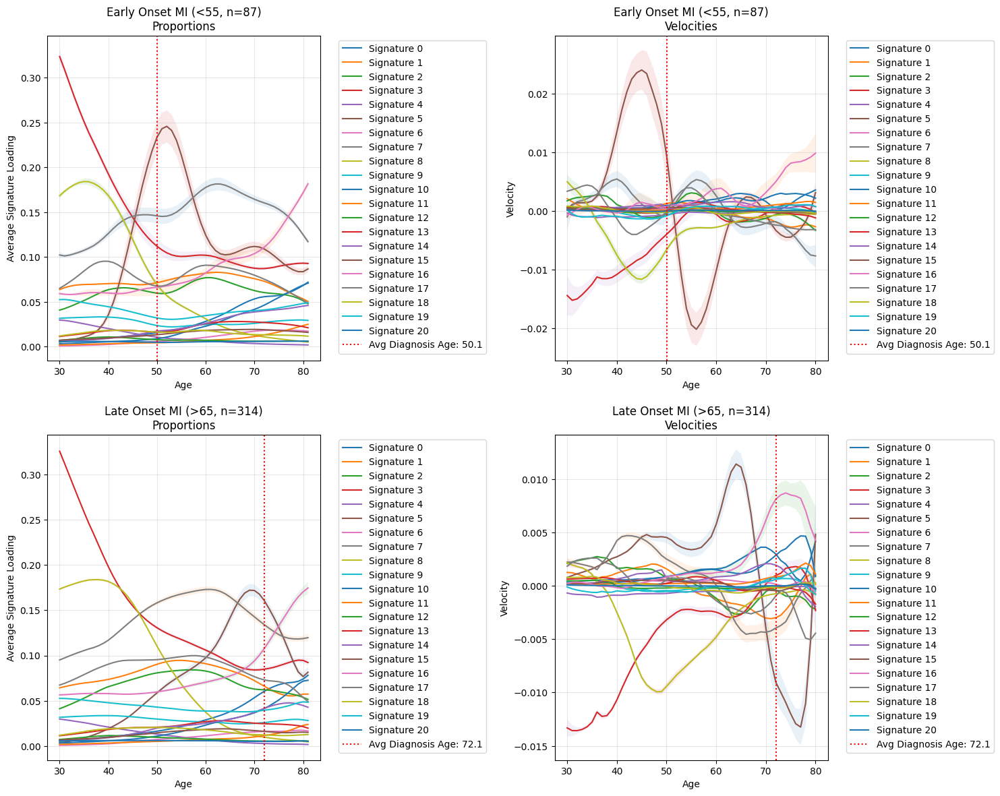

In [37]:
# Run the analysis
early_onset, late_onset = analyze_age_onset_patterns(model)

In [50]:
def plot_group_trajectories(model, patient_indices, ax_prop, ax_vel, title):
    """
    Plot average trajectories and velocities for a group of patients
    Ages run from 30-80 (51 time points)
    """
    # Get average trajectories
    all_props = []
    all_velocities = []
    diagnosis_times = []
    
    for p in patient_indices:
        props = torch.softmax(model.lambda_[p], dim=0)  # [K, T]
        all_props.append(props.detach().numpy())
        
        velocity = torch.diff(props, dim=1)  # [K, T-1]
        all_velocities.append(velocity.detach().numpy())
        
        # Get diagnosis time
        diag_time = torch.where(model.Y[p, 112])[0][0].item()
        diagnosis_times.append(diag_time)
    
    mean_props = np.mean(all_props, axis=0)  # Average across patients
    mean_vel = np.mean(all_velocities, axis=0)
    mean_diag_time = np.mean(diagnosis_times)
    
    # Plot proportions
    time_points = np.arange(mean_props.shape[1]) + 30  # Create time points based on data shape
    for k in range(mean_props.shape[0]):
        ax_prop.plot(time_points, mean_props[k], label=f'Signature {k}')
    
    ax_prop.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                   label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_prop.set_title(f'{title}\nProportions')
    ax_prop.set_xlabel('Age')
    ax_prop.set_ylabel('Average Signature Loading')
    ax_prop.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_prop.grid(True, alpha=0.3)
    
    # Plot velocities
    vel_time_points = np.arange(mean_vel.shape[1]) + 30  # One fewer point for velocities
    for k in range(mean_vel.shape[0]):
        ax_vel.plot(vel_time_points, mean_vel[k], label=f'Signature {k}')
    
    ax_vel.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                  label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_vel.set_title(f'{title}\nVelocities')
    ax_vel.set_xlabel('Age')
    ax_vel.set_ylabel('Velocity')
    ax_vel.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_vel.grid(True, alpha=0.3)
    
    # Add std error bands for key signatures
    # Get the top 5 signatures by maximum proportion
    top_sigs = np.argsort(np.max(mean_props, axis=1))[-5:]
    
    for k in top_sigs:
        # Calculate standard error for proportions
        props_std = np.std([p[k] for p in all_props], axis=0)
        props_se = props_std / np.sqrt(len(all_props))
        ax_prop.fill_between(time_points, 
                           mean_props[k] - props_se,
                           mean_props[k] + props_se,
                           alpha=0.1)
        
        # Calculate standard error for velocities
        vel_std = np.std([v[k] for v in all_velocities], axis=0)
        vel_se = vel_std / np.sqrt(len(all_velocities))
        ax_vel.fill_between(vel_time_points,
                          mean_vel[k] - vel_se,
                          mean_vel[k] + vel_se,
                          alpha=0.1)

In [ ]:
def analyze_multiple_cancers_age_onset():
    """
    Analyze age onset patterns for multiple cancers
    """
    # Define conditions and their thresholds
    conditions = {
        'Breast cancer': {'index': 17, 'early': 60, 'late': 70},
        'Colon cancer': {'index': 19, 'early': 60, 'late': 70}
    }
    
    # Find indices in disease names
    for condition in conditions:
        matches = [i for i, name in enumerate(essentials['disease_names']) 
                  if condition.lower() in name.lower()]
        if matches:
            print(f"Found {condition} at index {matches[0]}: {essentials['disease_names'][matches[0]]}")
            conditions[condition]['index'] = matches[0]
        else:
            print(f"Warning: Could not find {condition}")
    
    # Analyze each condition
    for condition, params in conditions.items():
        if params['index'] is not None:
            print(f"\nAnalyzing {condition}:")
            print("=" * 50)
            
            # Create a new figure for each condition
            fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
            fig.suptitle(f'Age Onset Analysis: {condition}', fontsize=16)
            
            early_onset, late_onset = analyze_age_onset_patterns(
                model, 
                mi_index=params['index'],
                early_threshold=params['early'],
                late_threshold=params['late']
            )
            
            plt.show()
            
            # Optional: analyze signature patterns specific to each cancer
            print(f"\nDominant signatures for {condition}:")
            psi_values = model.psi[:, params['index']].detach().numpy()
            top_sigs = np.argsort(psi_values)[-5:][::-1]
            for sig in top_sigs:
                print(f"Signature {sig}: {psi_values[sig]:.3f}")

# Run the analysis
analyze_multiple_cancers_age_onset()


Analyzing Breast Cancer:
Found 47 early-onset patients (diagnosis < 50)
Found 62 late-onset patients (diagnosis > 70)

Early onset mean age: 45.1 (range: 36.0-49.0)
Late onset mean age: 75.3 (range: 71.0-81.0)


IndexError: index 0 is out of bounds for dimension 0 with size 0

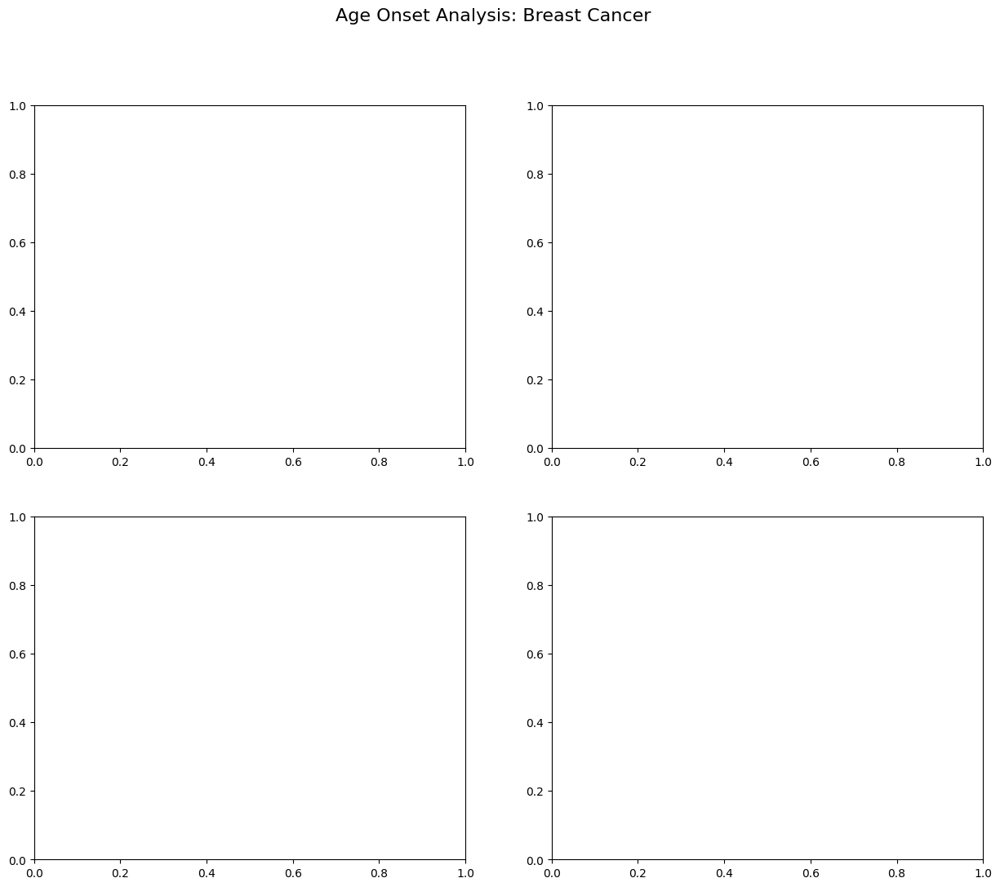

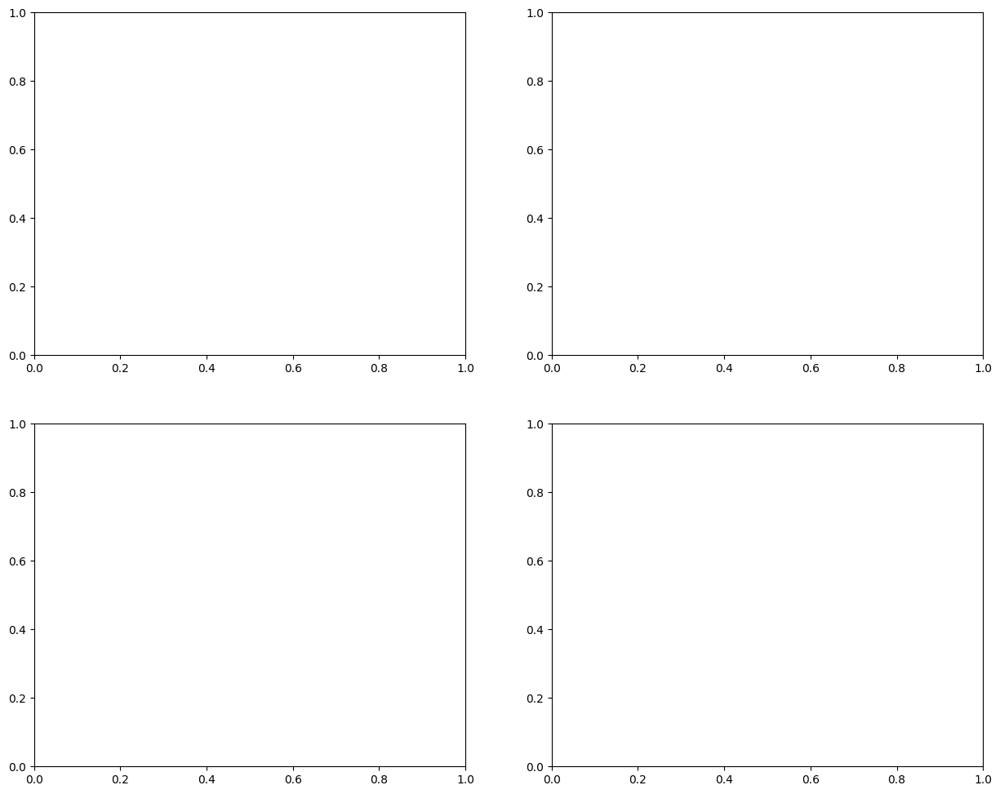

In [57]:
def analyze_specific_cancers(model, conditions):
    """
    Analyze age onset patterns for specific cancers
    conditions: dict with cancer names, their indices, and early/late thresholds
    """
    for cancer_name, params in conditions.items():
        print(f"\nAnalyzing {cancer_name}:")
        print("=" * 50)
        
        # Create plots for this cancer
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
        fig.suptitle(f'Age Onset Analysis: {cancer_name}', fontsize=16)
        
        early_onset, late_onset = analyze_age_onset_patterns(
            model, 
            mi_index=params['index'],
            early_threshold=params['early'],
            late_threshold=params['late']
        )
        
        plt.show()

# Define the conditions with their indices and thresholds
conditions = {
    'Breast Cancer': {
        'index': 17,  # Breast cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    },
    'Lung Cancer': {
        'index': 13,  # Lung cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    }
}

# Run the analysis
analyze_specific_cancers(model, conditions)


Analyzing Breast Cancer:
Found 47 early-onset patients (diagnosis < 50)
Found 62 late-onset patients (diagnosis > 70)

Early onset mean age: 45.1 (range: 36.0-49.0)
Late onset mean age: 75.3 (range: 71.0-81.0)


IndexError: index 0 is out of bounds for dimension 0 with size 0

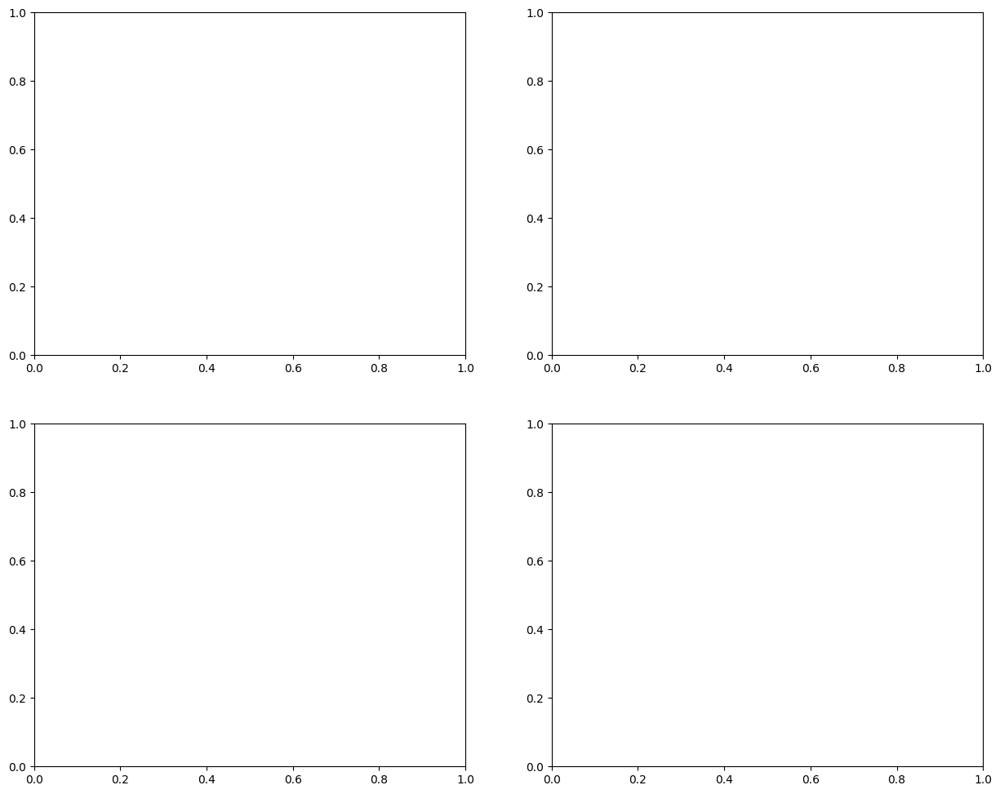

In [60]:
def analyze_age_onset_patterns(model, disease_index, early_threshold=50, late_threshold=70):
    """
    Compare signature patterns between early onset and late onset disease
    Ages run from 30-80 (51 time points)
    """
    early_onset = []
    late_onset = []
    
    # Find patients with disease and categorize by age of onset
    for p in range(model.Y.shape[0]):
        if torch.any(model.Y[p, disease_index]):
            diagnosis_time = torch.where(model.Y[p, disease_index])[0][0].item()
            
            # Convert time index to age (starting at age 30)
            diagnosis_age = 30 + diagnosis_time
            
            if diagnosis_age < early_threshold:
                early_onset.append((p, diagnosis_age))
            elif diagnosis_age > late_threshold:
                late_onset.append((p, diagnosis_age))
    
    print(f"Found {len(early_onset)} early-onset patients (diagnosis < {early_threshold})")
    print(f"Found {len(late_onset)} late-onset patients (diagnosis > {late_threshold})")
    
    # Calculate mean ages
    early_ages = [age for _, age in early_onset]
    late_ages = [age for _, age in late_onset]
    print(f"\nEarly onset mean age: {np.mean(early_ages):.1f} (range: {min(early_ages):.1f}-{max(early_ages):.1f})")
    print(f"Late onset mean age: {np.mean(late_ages):.1f} (range: {min(late_ages):.1f}-{max(late_ages):.1f})")
    
    # Extract just the patient indices for plotting
    early_patients = [p for p, _ in early_onset]
    late_patients = [p for p, _ in late_onset]
    
    # Create plots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    
    plot_group_trajectories(model, early_patients, ax1, ax2, 
                          f'Early Onset (<{early_threshold}, n={len(early_patients)})')
    plot_group_trajectories(model, late_patients, ax3, ax4,
                          f'Late Onset (>{late_threshold}, n={len(late_patients)})')
    
    plt.tight_layout()
    return early_patients, late_patients

# Define the conditions
conditions = {
    'Breast Cancer': {
        'index': 17,  # Breast cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    },
    'Lung Cancer': {
        'index': 13,  # Lung cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    }
}

# Analyze each cancer type
for cancer_name, params in conditions.items():
    print(f"\nAnalyzing {cancer_name}:")
    print("=" * 50)
    early_onset, late_onset = analyze_age_onset_patterns(
        model, 
        disease_index=params['index'],
        early_threshold=params['early'],
        late_threshold=params['late']
    )


Analyzing MI:
Found 30 early-onset patients (diagnosis < 50)
Found 200 late-onset patients (diagnosis > 70)

Early onset mean age: 45.8 (range: 39.0-49.0)
Late onset mean age: 74.5 (range: 71.0-81.0)

Analyzing Breast Cancer:
Found 47 early-onset patients (diagnosis < 50)
Found 62 late-onset patients (diagnosis > 70)

Early onset mean age: 45.1 (range: 36.0-49.0)
Late onset mean age: 75.3 (range: 71.0-81.0)

Analyzing PD:
Found 30 early-onset patients (diagnosis < 50)
Found 200 late-onset patients (diagnosis > 70)

Early onset mean age: 45.8 (range: 39.0-49.0)
Late onset mean age: 74.5 (range: 71.0-81.0)

Analyzing Major Depression:
Found 71 early-onset patients (diagnosis < 50)
Found 165 late-onset patients (diagnosis > 70)

Early onset mean age: 44.0 (range: 34.0-49.0)
Late onset mean age: 74.7 (range: 71.0-81.0)

Analyzing A Fib:
Found 18 early-onset patients (diagnosis < 50)
Found 118 late-onset patients (diagnosis > 70)

Early onset mean age: 44.6 (range: 37.0-49.0)
Late onset me

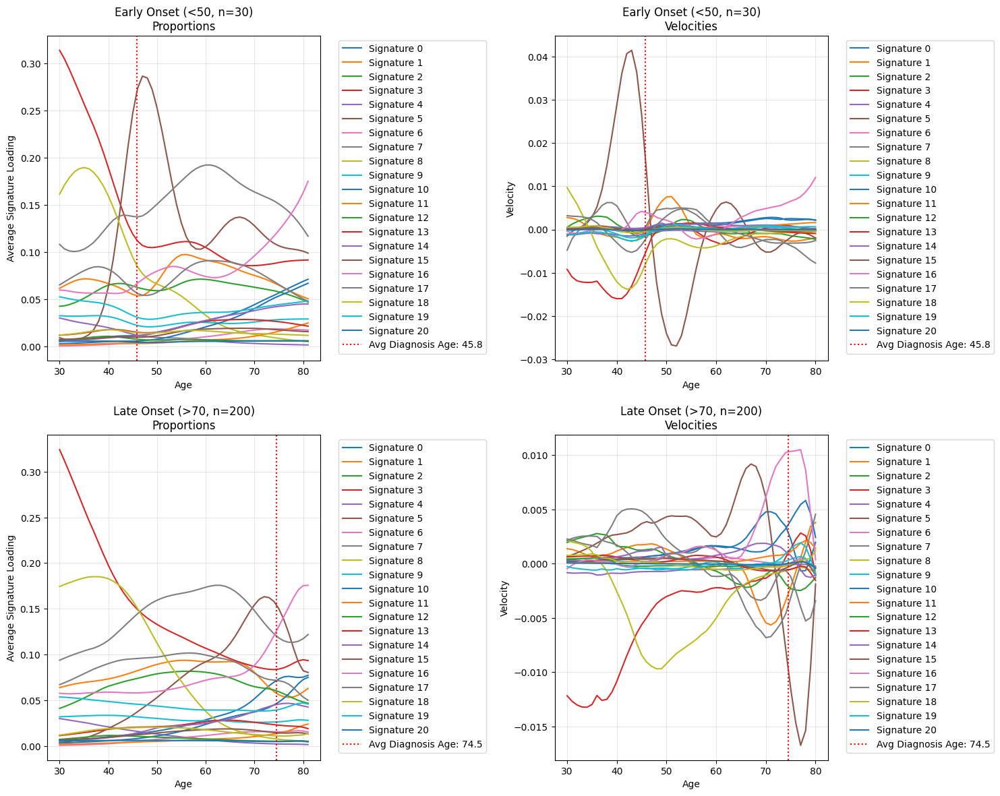

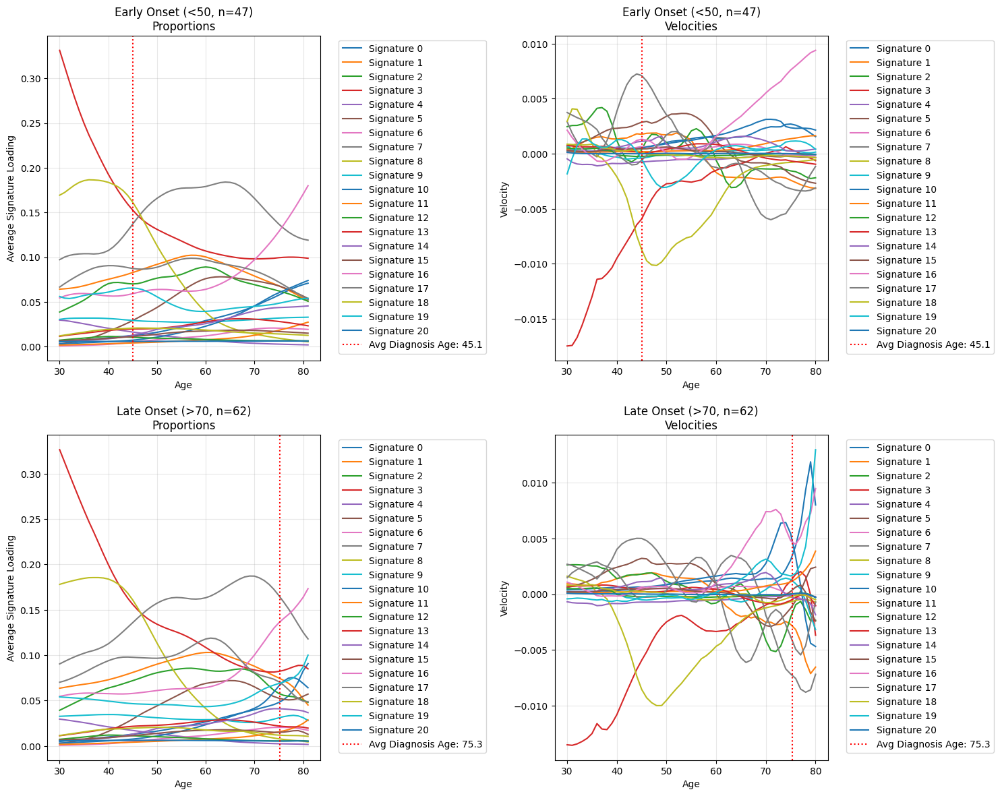

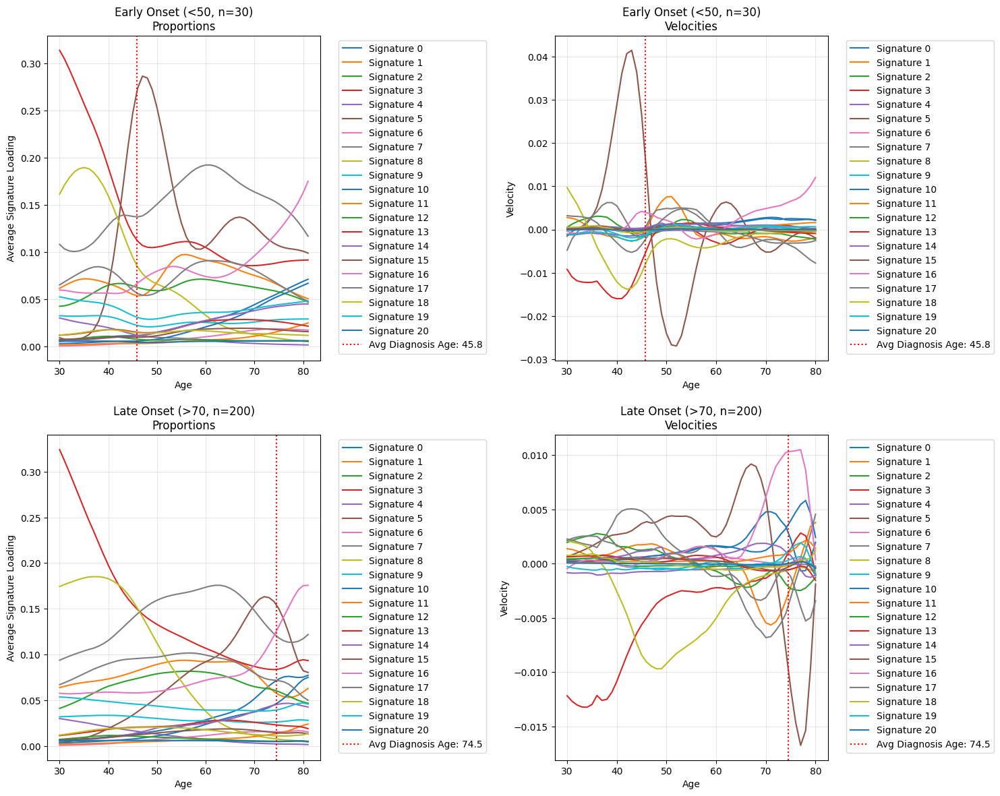

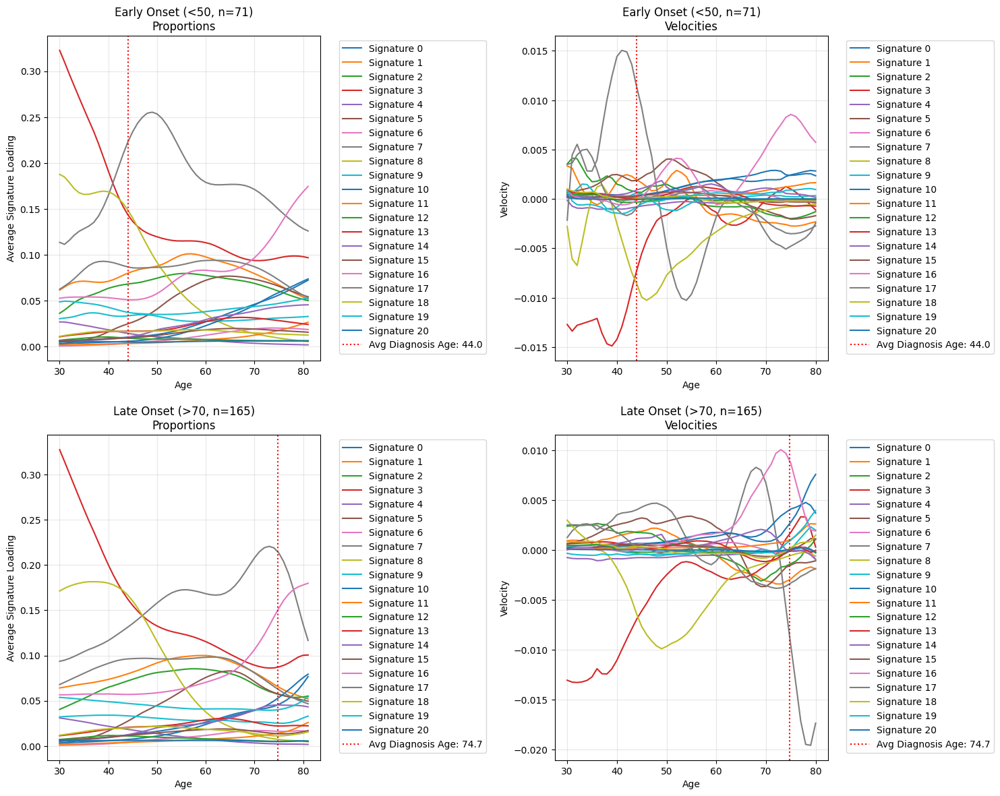

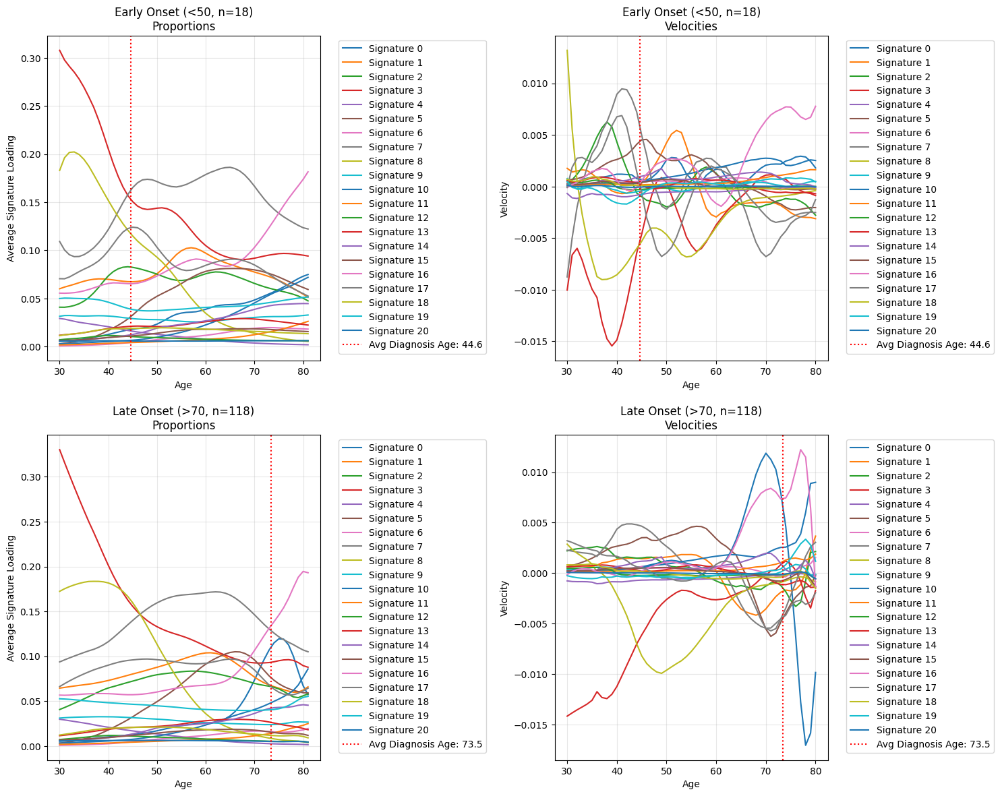

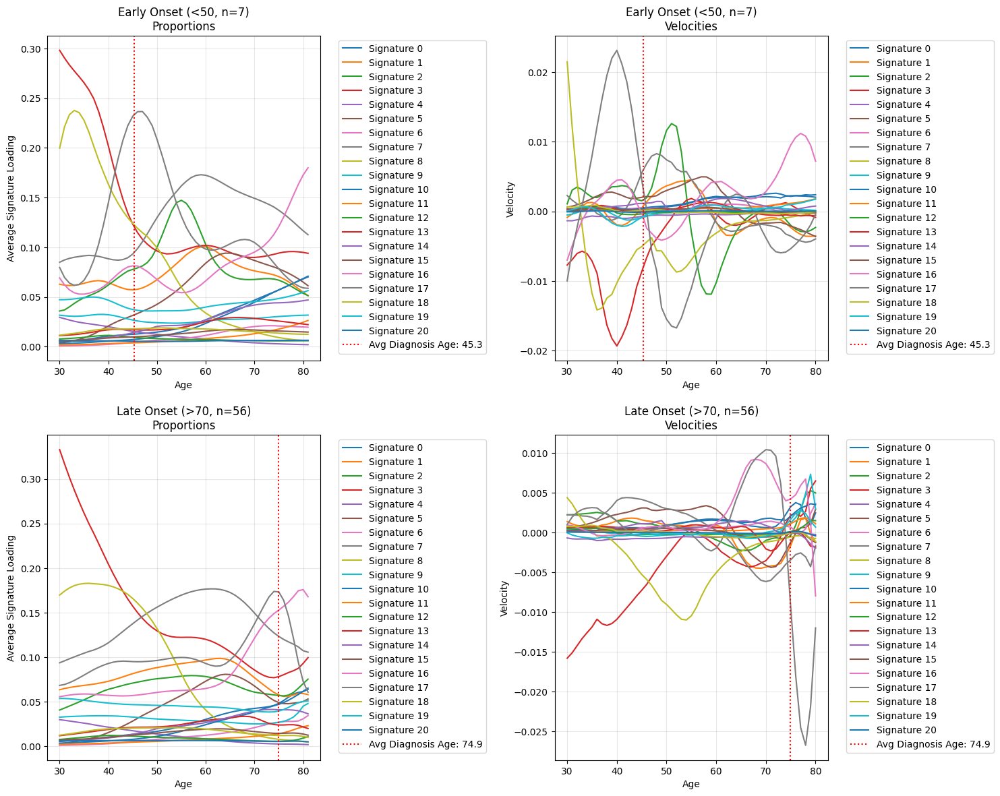

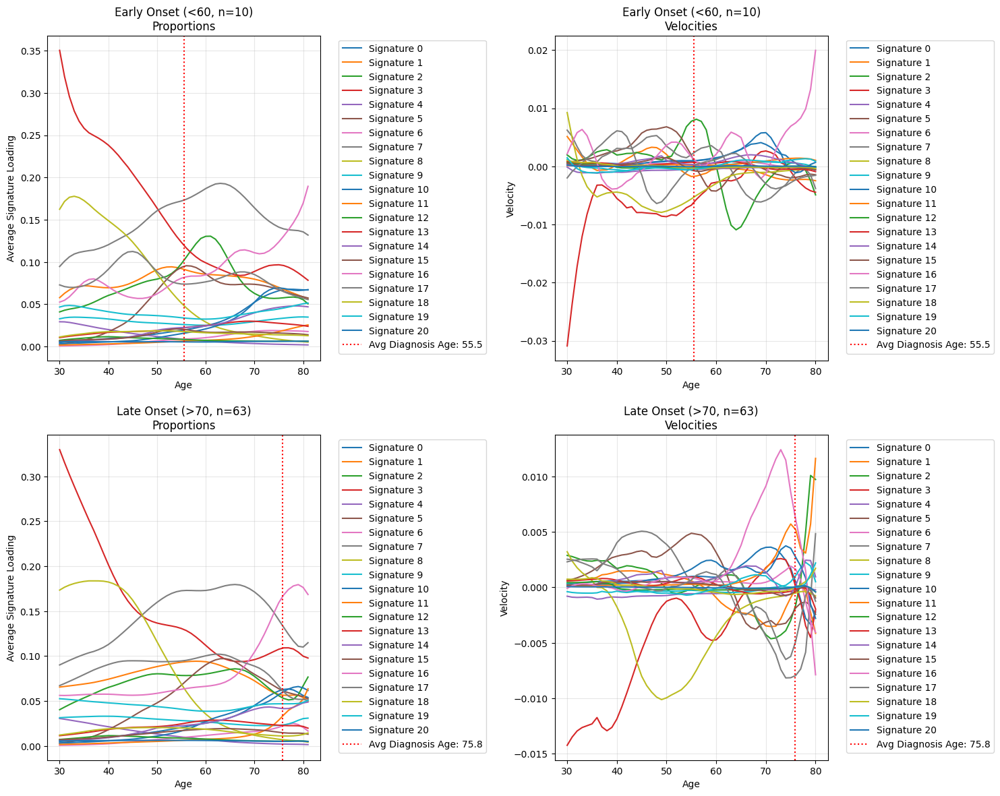

In [26]:
def plot_group_trajectories(model, patient_indices, ax_prop, ax_vel, title, disease_index):
    """
    Plot average trajectories and velocities for a group of patients
    Ages run from 30-80 (51 time points)
    """
    # Get average trajectories
    all_props = []
    all_velocities = []
    diagnosis_times = []
    
    for p in patient_indices:
        props = torch.softmax(model.lambda_[p], dim=0)
        all_props.append(props.detach().numpy())
        
        velocity = torch.diff(props, dim=1)
        all_velocities.append(velocity.detach().numpy())
        
        # Get diagnosis time using the correct disease index
        diag_time = torch.where(model.Y[p, disease_index])[0][0].item()
        diagnosis_times.append(diag_time)
    
    mean_props = np.mean(all_props, axis=0)
    mean_vel = np.mean(all_velocities, axis=0)
    mean_diag_time = np.mean(diagnosis_times)
    
    # Plot proportions
    time_points = np.arange(mean_props.shape[1]) + 30
    for k in range(mean_props.shape[0]):
        ax_prop.plot(time_points, mean_props[k], label=f'Signature {k}')
    
    ax_prop.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                   label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_prop.set_title(f'{title}\nProportions')
    ax_prop.set_xlabel('Age')
    ax_prop.set_ylabel('Average Signature Loading')
    ax_prop.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_prop.grid(True, alpha=0.3)
    
    # Plot velocities
    vel_time_points = np.arange(mean_vel.shape[1]) + 30
    for k in range(mean_vel.shape[0]):
        ax_vel.plot(vel_time_points, mean_vel[k], label=f'Signature {k}')
    
    ax_vel.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                  label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_vel.set_title(f'{title}\nVelocities')
    ax_vel.set_xlabel('Age')
    ax_vel.set_ylabel('Velocity')
    ax_vel.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_vel.grid(True, alpha=0.3)

def analyze_age_onset_patterns(model, disease_index, early_threshold=50, late_threshold=70):
    """
    Compare signature patterns between early onset and late onset disease
    Ages run from 30-80 (51 time points)
    """
    early_onset = []
    late_onset = []
    
    # Find patients with disease and categorize by age of onset
    for p in range(model.Y.shape[0]):
        if torch.any(model.Y[p, disease_index]):
            diagnosis_time = torch.where(model.Y[p, disease_index])[0][0].item()
            
            # Convert time index to age (starting at age 30)
            diagnosis_age = 30 + diagnosis_time
            
            if diagnosis_age < early_threshold:
                early_onset.append((p, diagnosis_age))
            elif diagnosis_age > late_threshold:
                late_onset.append((p, diagnosis_age))
    
    print(f"Found {len(early_onset)} early-onset patients (diagnosis < {early_threshold})")
    print(f"Found {len(late_onset)} late-onset patients (diagnosis > {late_threshold})")
    
    # Calculate mean ages
    early_ages = [age for _, age in early_onset]
    late_ages = [age for _, age in late_onset]
    print(f"\nEarly onset mean age: {np.mean(early_ages):.1f} (range: {min(early_ages):.1f}-{max(early_ages):.1f})")
    print(f"Late onset mean age: {np.mean(late_ages):.1f} (range: {min(late_ages):.1f}-{max(late_ages):.1f})")
    
    # Extract just the patient indices for plotting
    early_patients = [p for p, _ in early_onset]
    late_patients = [p for p, _ in late_onset]
    
    # Create plots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    
    plot_group_trajectories(model, early_patients, ax1, ax2, 
                          f'Early Onset (<{early_threshold}, n={len(early_patients)})',
                          disease_index)  # Pass disease_index here
    plot_group_trajectories(model, late_patients, ax3, ax4,
                          f'Late Onset (>{late_threshold}, n={len(late_patients)})',
                          disease_index)  # Pass disease_index here
    
    plt.tight_layout()
    return early_patients, late_patients

# Define the conditions
conditions = {
 'MI': {
        'index': 112,  # Breast cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    },
    'Breast Cancer': {
        'index': 17,  # Breast cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    },
     'PD': {
        'index': 112,  # Breast cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    },
    'Major Depression': {
        'index': 66,  # Lung cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    },
    'A Fib': {
        'index': 127,  # Lung cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    },
     'Colon cancer': {
        'index': 10,  # Lung cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    },
     'Stroke': {
        'index': 132,  # Lung cancer index
        'early': 60,  # Early onset threshold
        'late': 70    # Late onset threshold
    }

}

# Analyze each cancer type
for cancer_name, params in conditions.items():
    print(f"\nAnalyzing {cancer_name}:")
    print("=" * 50)
    early_onset, late_onset = analyze_age_onset_patterns(
        model, 
        disease_index=params['index'],
        early_threshold=params['early'],
        late_threshold=params['late']
    )

In [25]:
model.clusters[132]

np.int32(11)


Analyzing Breast Cancer:
Found 47 early-onset patients (diagnosis < 50)
Found 62 late-onset patients (diagnosis > 70)

Early onset mean age: 45.1 (range: 36.0-49.0)
Late onset mean age: 75.3 (range: 71.0-81.0)

Analyzing Lung Cancer:
Found 0 early-onset patients (diagnosis < 50)
Found 65 late-onset patients (diagnosis > 70)


ValueError: min() arg is an empty sequence

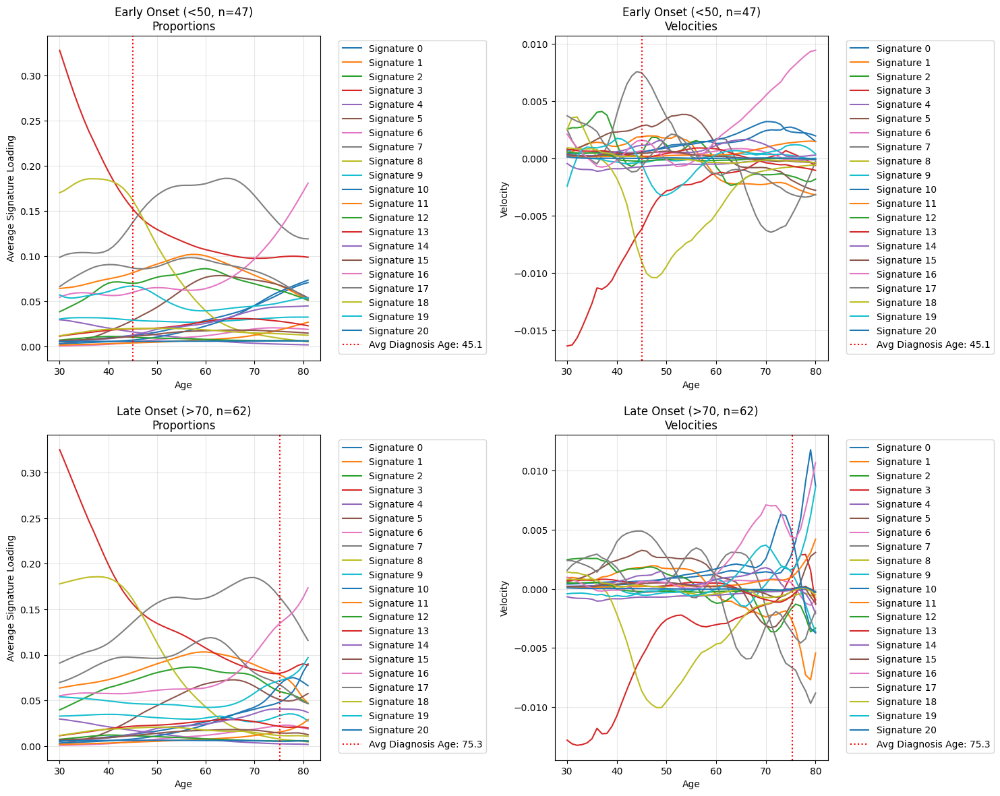

In [70]:
def plot_group_trajectories(model, patient_indices, ax_prop, ax_vel, title, disease_index):
    """
    Plot average trajectories and velocities for a group of patients
    Ages run from 30-80 (51 time points)
    """
    # Get average trajectories
    all_props = []
    all_velocities = []
    diagnosis_times = []
    
    for p in patient_indices:
        props = torch.softmax(model.lambda_[p], dim=0)
        all_props.append(props.detach().numpy())
        
        velocity = torch.diff(props, dim=1)
        all_velocities.append(velocity.detach().numpy())
        
        # Get diagnosis time using the correct disease index
        diag_time = torch.where(model.Y[p, disease_index])[0][0].item()
        diagnosis_times.append(diag_time)
    
    mean_props = np.mean(all_props, axis=0)
    mean_vel = np.mean(all_velocities, axis=0)
    mean_diag_time = np.mean(diagnosis_times)
    
    # Plot proportions
    time_points = np.arange(mean_props.shape[1]) + 30
    for k in range(mean_props.shape[0]):
        ax_prop.plot(time_points, mean_props[k], label=f'Signature {k}')
    
    ax_prop.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                   label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_prop.set_title(f'{title}\nProportions')
    ax_prop.set_xlabel('Age')
    ax_prop.set_ylabel('Average Signature Loading')
    ax_prop.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_prop.grid(True, alpha=0.3)
    
    # Plot velocities
    vel_time_points = np.arange(mean_vel.shape[1]) + 30
    for k in range(mean_vel.shape[0]):
        ax_vel.plot(vel_time_points, mean_vel[k], label=f'Signature {k}')
    
    ax_vel.axvline(x=30 + mean_diag_time, color='red', linestyle=':', 
                  label=f'Avg Diagnosis Age: {30 + mean_diag_time:.1f}')
    ax_vel.set_title(f'{title}\nVelocities')
    ax_vel.set_xlabel('Age')
    ax_vel.set_ylabel('Velocity')
    ax_vel.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax_vel.grid(True, alpha=0.3)

def analyze_age_onset_patterns(model, disease_index, early_threshold=50, late_threshold=70):
    """
    Compare signature patterns between early onset and late onset disease
    Ages run from 30-80 (51 time points)
    """
    early_onset = []
    late_onset = []
    
    # Find patients with disease and categorize by age of onset
    for p in range(model.Y.shape[0]):
        if torch.any(model.Y[p, disease_index]):
            diagnosis_time = torch.where(model.Y[p, disease_index])[0][0].item()
            
            # Convert time index to age (starting at age 30)
            diagnosis_age = 30 + diagnosis_time
            
            if diagnosis_age < early_threshold:
                early_onset.append((p, diagnosis_age))
            elif diagnosis_age > late_threshold:
                late_onset.append((p, diagnosis_age))
    
    print(f"Found {len(early_onset)} early-onset patients (diagnosis < {early_threshold})")
    print(f"Found {len(late_onset)} late-onset patients (diagnosis > {late_threshold})")
    
    # Calculate mean ages
    early_ages = [age for _, age in early_onset]
    late_ages = [age for _, age in late_onset]
    print(f"\nEarly onset mean age: {np.mean(early_ages):.1f} (range: {min(early_ages):.1f}-{max(early_ages):.1f})")
    print(f"Late onset mean age: {np.mean(late_ages):.1f} (range: {min(late_ages):.1f}-{max(late_ages):.1f})")
    
    # Extract just the patient indices for plotting
    early_patients = [p for p, _ in early_onset]
    late_patients = [p for p, _ in late_onset]
    
    # Create plots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 12))
    
    plot_group_trajectories(model, early_patients, ax1, ax2, 
                          f'Early Onset (<{early_threshold}, n={len(early_patients)})',
                          disease_index)  # Pass disease_index here
    plot_group_trajectories(model, late_patients, ax3, ax4,
                          f'Late Onset (>{late_threshold}, n={len(late_patients)})',
                          disease_index)  # Pass disease_index here
    
    plt.tight_layout()
    return early_patients, late_patients

# Define the conditions
conditions = {
    'Breast Cancer': {
        'index': 17,  # Breast cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    },
    'Lung Cancer': {
        'index': 13,  # Lung cancer index
        'early': 50,  # Early onset threshold
        'late': 70    # Late onset threshold
    }
}

# Analyze each cancer type
for cancer_name, params in conditions.items():
    print(f"\nAnalyzing {cancer_name}:")
    print("=" * 50)
    early_onset, late_onset = analyze_age_onset_patterns(
        model, 
        disease_index=params['index'],
        early_threshold=params['early'],
        late_threshold=params['late']
    )

Early Onset Analysis:
Comparing 47 patients with 9577 controls


ValueError: x and y must have same first dimension, but have shapes (51,) and (52,)

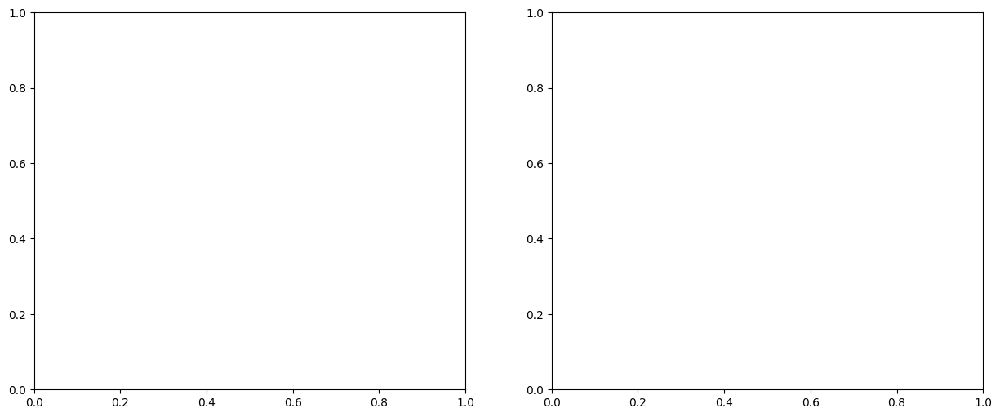

In [72]:
def compare_with_controls(model, disease_index, patient_indices):
    """
    Compare disease trajectories with controls
    """
    # Get patients without the disease
    control_indices = []
    for p in range(model.Y.shape[0]):
        if not torch.any(model.Y[p, disease_index]):
            control_indices.append(p)
            
    # Get trajectories for both groups
    patient_trajectories = []
    control_trajectories = []
    
    for p in patient_indices:
        props = torch.softmax(model.lambda_[p], dim=0)
        patient_trajectories.append(props.detach().numpy())
        
    for p in control_indices:
        props = torch.softmax(model.lambda_[p], dim=0)
        control_trajectories.append(props.detach().numpy())
    
    print(f"Comparing {len(patient_indices)} patients with {len(control_indices)} controls")
    
    # Plot comparison
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot mean trajectories
    mean_patient = np.mean(patient_trajectories, axis=0)
    mean_control = np.mean(control_trajectories, axis=0)
    
    time_points = np.arange(30, 81)
    
    for k in range(mean_patient.shape[0]):
        ax1.plot(time_points, mean_patient[k], label=f'Sig {k} (Disease)', linewidth=2)
        ax1.plot(time_points, mean_control[k], label=f'Sig {k} (Control)', linestyle='--', alpha=0.5)
    
    ax1.set_title('Disease vs Control Trajectories')
    ax1.set_xlabel('Age')
    ax1.set_ylabel('Average Signature Loading')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax1.grid(True, alpha=0.3)
    
    # Plot differences
    differences = mean_patient - mean_control
    for k in range(differences.shape[0]):
        ax2.plot(time_points, differences[k], label=f'Signature {k}')
    
    ax2.set_title('Disease - Control Differences')
    ax2.set_xlabel('Age')
    ax2.set_ylabel('Difference in Loading')
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    return mean_patient, mean_control, differences

# Run for early and late onset groups
print("Early Onset Analysis:")
early_trajectories = compare_with_controls(model, disease_index=17, patient_indices=early_onset)
plt.show()

print("\nLate Onset Analysis:")
late_trajectories = compare_with_controls(model, disease_index=17, patient_indices=late_onset)
plt.show()

Early Onset Analysis:
Comparing 47 patients with 9577 controls


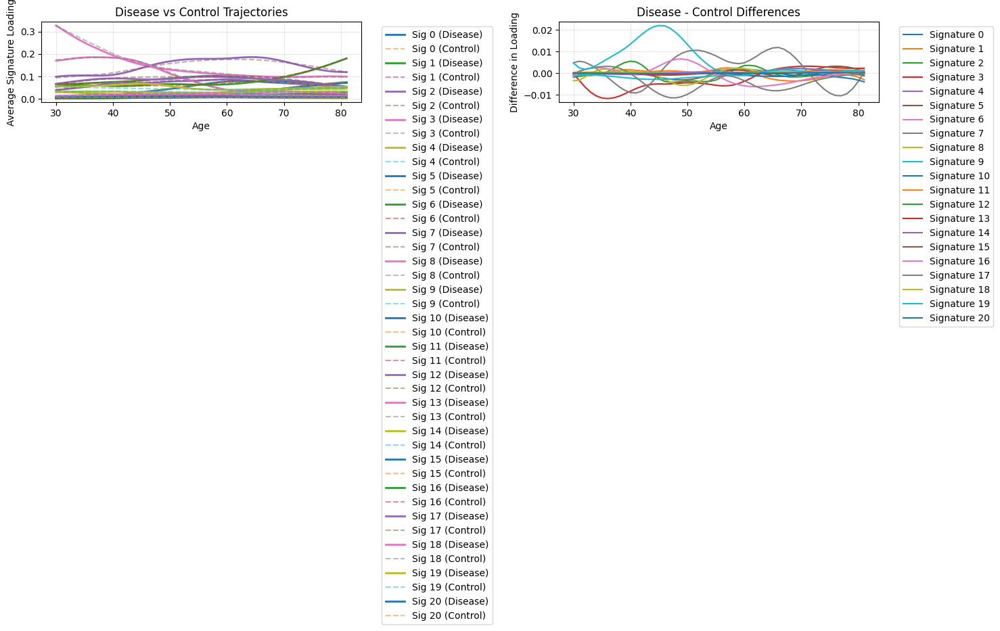


Late Onset Analysis:
Comparing 62 patients with 9577 controls


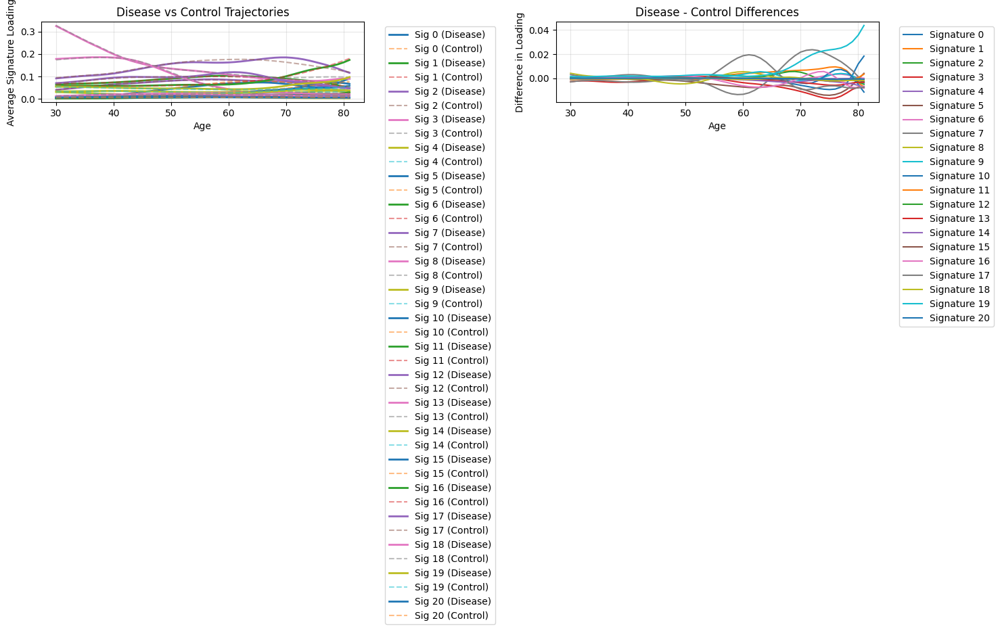

In [73]:
def compare_with_controls(model, disease_index, patient_indices):
    """
    Compare disease trajectories with controls
    """
    # Get patients without the disease
    control_indices = []
    for p in range(model.Y.shape[0]):
        if not torch.any(model.Y[p, disease_index]):
            control_indices.append(p)
            
    # Get trajectories for both groups
    patient_trajectories = []
    control_trajectories = []
    
    for p in patient_indices:
        props = torch.softmax(model.lambda_[p], dim=0)
        patient_trajectories.append(props.detach().numpy())
        
    for p in control_indices:
        props = torch.softmax(model.lambda_[p], dim=0)
        control_trajectories.append(props.detach().numpy())
    
    print(f"Comparing {len(patient_indices)} patients with {len(control_indices)} controls")
    
    # Plot comparison
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot mean trajectories
    mean_patient = np.mean(patient_trajectories, axis=0)
    mean_control = np.mean(control_trajectories, axis=0)
    
    # Use the shape of the data to determine time points
    n_timepoints = mean_patient.shape[1]
    time_points = np.arange(30, 30 + n_timepoints)
    
    for k in range(mean_patient.shape[0]):
        ax1.plot(time_points, mean_patient[k], label=f'Sig {k} (Disease)', linewidth=2)
        ax1.plot(time_points, mean_control[k], label=f'Sig {k} (Control)', linestyle='--', alpha=0.5)
    
    ax1.set_title('Disease vs Control Trajectories')
    ax1.set_xlabel('Age')
    ax1.set_ylabel('Average Signature Loading')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax1.grid(True, alpha=0.3)
    
    # Plot differences
    differences = mean_patient - mean_control
    for k in range(differences.shape[0]):
        ax2.plot(time_points, differences[k], label=f'Signature {k}')
    
    ax2.set_title('Disease - Control Differences')
    ax2.set_xlabel('Age')
    ax2.set_ylabel('Difference in Loading')
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    return mean_patient, mean_control, differences

# Run for early and late onset groups
print("Early Onset Analysis:")
early_trajectories = compare_with_controls(model, disease_index=17, patient_indices=early_onset)
plt.show()

print("\nLate Onset Analysis:")
late_trajectories = compare_with_controls(model, disease_index=17, patient_indices=late_onset)
plt.show()

In [74]:
signature_refs.shape

torch.Size([20, 52])

/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:541: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


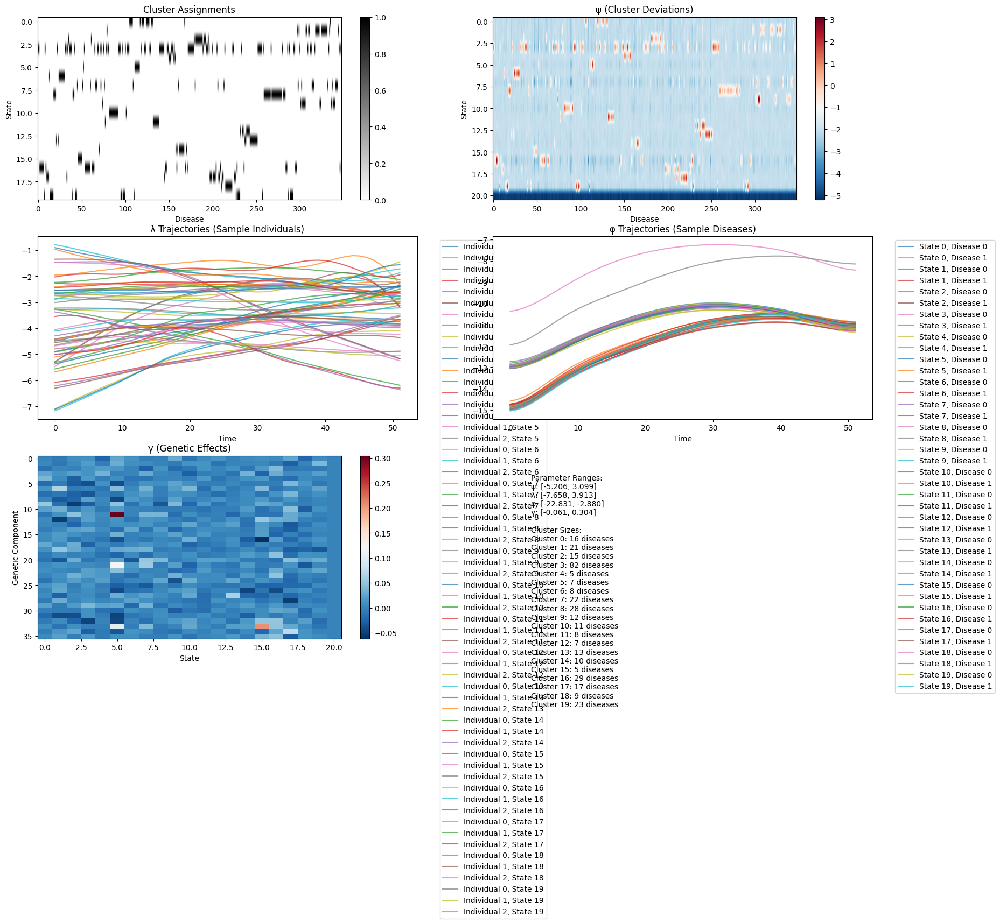

In [27]:
model.visualize_initialization()